# SUBJECT DEPENDENT TESTING

## TRAINING DATA

In [1]:
import numpy as np
def segment_data(train_data, train_labels=None, window_size=512, step_size=512):
    """
    Segment data into smaller chunks with a sliding window.

    Parameters:
    - data: np.array, input data of shape (samples, channels, time_steps, 1)
    - labels: np.array, input labels of shape (samples, num_classes)
    - window_size: int, the size of each segment (default 512)
    - step_size: int, the sliding window step size (default 512)

    Returns:
    - segmented_data: np.array, segmented data with shape (new_samples, channels, window_size, 1)
    - segmented_labels: np.array, corresponding labels for each segment
    """
    segmented_data = []
    segmented_labels = []

    # Loop over each sample in the dataset
    for i in range(len(train_data)):
        # Extract a single sample
        sample = train_data[i]
        if train_labels is not None:
            label = train_labels[i]
        
        # Slide the window across the time axis
        for start in range(0, sample.shape[1] - window_size + 1, step_size):
            end = start + window_size
            segment = sample[:, start:end, :]
            if(segment.shape[1] != window_size) :
                segment = np.hstack((segment,np.zeros((segment.shape[0], window_size-segment.shape[1], segment.shape[2]))), axis = 1) 
            segmented_data.append(segment)
            if train_labels is not None:
                segmented_labels.append(label)  # Replicate the label for each segment

    # Convert lists to numpy arrays
    segmented_data = np.array(segmented_data)
    if train_labels is not None:
        segmented_labels = np.array(segmented_labels)
    if train_labels is not None:
        return segmented_data, segmented_labels
    return segmented_data


In [2]:
import _pickle as cPickle
import os
import numpy as np

# Define the path to the preprocessed folder
preprocessed_folder = '/kaggle/input/deap-dataset/PREPROCESSED/data_preprocessed_python'

# Create lists to store the data and labels
train_data = []
train_labels = []

# Iterate through the files in the preprocessed folder
for filename in os.listdir(preprocessed_folder):
    if filename.endswith('.dat'):
        # Load the data from the file
        filepath = os.path.join(preprocessed_folder, filename)
        data = cPickle.load(open(filepath, 'rb'), encoding='latin1')

        for sample in data['data']:
            train_data.append(sample)
        for sample in data['labels']:
            train_labels.append(sample)

# Convert the lists to numpy arrays
train_data = np.array(train_data)
train_data = train_data[:,:32]
train_data = train_data.reshape(train_data.shape[0], train_data.shape[1], train_data.shape[2], 1)
train_labels = np.array(train_labels)

train_data, train_labels = segment_data(train_data, train_labels)

# Shuffle the data
num_samples = train_data.shape[0]

# Shuffle the indices
shuffled_indices = np.random.permutation(num_samples)

# Shuffle both data and labels using the same indices
train_data = train_data[shuffled_indices]
train_labels = train_labels[shuffled_indices]
print(train_data.shape, train_labels.shape)

# # Create the data_processed folder if it doesn't exist
os.makedirs('data_processed', exist_ok=True)

# # # # Save the data and labels to numpy files
np.save('data_processed/train_data.npy', train_data)
np.save('data_processed/train_labels.npy', train_labels)

(19200, 32, 512, 1) (19200, 4)


## FREE UP RAM

In [3]:
del train_data,train_labels

## ALL MODELS

In [1]:
import tensorflow.keras as keras
from tensorflow.keras import regularizers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Activation, Dropout, Lambda, TimeDistributed, LSTM, Bidirectional, Flatten, GRU
from tensorflow.keras.layers import Conv2D, AveragePooling2D, MaxPooling2D, Bidirectional, SpatialDropout2D
from tensorflow.keras.layers import SeparableConv2D, DepthwiseConv2D
from tensorflow.keras.layers import BatchNormalization, Flatten
from tensorflow.keras.layers import MultiHeadAttention, LayerNormalization
from tensorflow.keras.layers import GlobalAveragePooling1D
from tensorflow.keras.layers import Input
from tensorflow.keras.constraints import max_norm
import numpy as np
import tensorflow as tf
from keras import backend as K

#################################################### model our proposed ##########################################################################
class TransformerBlock(keras.layers.Layer):
    def __init__(self, embed_dim, num_heads, rate=0.1, **kwargs):
        super(TransformerBlock, self).__init__(**kwargs)
        self.att = MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.ffn = Dense(embed_dim, activation='elu', use_bias=False)
        self.layernorm1 = LayerNormalization(epsilon=1e-6)
        self.layernorm2 = LayerNormalization(epsilon=1e-6)
        self.dropout = Dropout(rate)

    def call(self, inputs):
        attn_output = self.att(inputs, inputs)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout(ffn_output)
        out = self.layernorm2(out1 + ffn_output)
        return out

    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'att': self.att,
            'ffn': self.ffn,
            'layernorm1': self.layernorm1,
            'layernorm2': self.layernorm2,
            'dropout': self.dropout
        })
        return config

    @classmethod
    def from_config(cls, config):
        return cls(**config)

class PositionalEncoding(keras.layers.Layer):
    def __init__(self, d_model, max_len):
        super(PositionalEncoding, self).__init__()
        self.max_len = max_len
        self.d_model = d_model

    def get_angles(self, pos, i):
        angles = 1 / np.power(10000, (2 * (i//2)) / np.float32(self.d_model))
        return pos * angles

    def call(self, inputs):
        # Get the length of the input sequence
        length = inputs.shape[1]
        # Calculate the positional encoding matrix
        pos_encoding = np.zeros((length, self.d_model))
        for pos in range(length):
            for i in range(self.d_model):
                if i % 2 == 0:
                    pos_encoding[pos, i] = np.sin(self.get_angles(pos, i))
                else:
                    pos_encoding[pos, i] = np.cos(self.get_angles(pos, i))
        pos_encoding = pos_encoding[np.newaxis, ...]
        # Add the positional encoding matrix to the input embeddings
        return inputs + tf.cast(pos_encoding, tf.float32)
    def get_config(self):
        config = super().get_config().copy()
        config.update({'max_len': self.max_len, 'd_model': self.d_model})
        return config

    @classmethod
    def from_config(cls, config):
        return cls(**config)


# ERTNet model
def ertnet(nb_classes, Chans=64, Samples=128,
           dropoutRate=0.5, kernLength=64, F1=8, heads=8,
           D=2, F2=16):
    """
    ERTNet(Emotion Recognition Transformer Network) model for EEG Emotion Recognition
    nb_classes: number of classes
    Chans: number of channels in the EEG data
    Samples: number of time points in the EEG data
    dropoutRate: dropout fraction
    kernLength: length of temporal convolution in first layer
    F1: number of temporal filters in first layer
    heads: number of heads for multi-head attention
    D: number of depthwise convolutional filters
    F2: number of separable convolutional filters

    return ERTNet model
    """
    input1 = Input(shape=(Chans, Samples, 1))

    block1 = Conv2D(F1, (1, kernLength), padding='same',
                    input_shape=(Chans, Samples, 1),
                    use_bias=False)(input1)
    block1 = BatchNormalization()(block1)

    block1 = DepthwiseConv2D((Chans, 1), use_bias=False,
                             depth_multiplier=D,
                             depthwise_constraint=max_norm(1.))(block1)
    block1 = BatchNormalization()(block1)
    block1 = Activation('elu')(block1)
    block1 = AveragePooling2D((1, 4))(block1)
    block1 = Dropout(dropoutRate)(block1)

    block2 = SeparableConv2D(F2, (1, 16),
                             use_bias=False, padding='same')(block1)
    block2 = BatchNormalization()(block2)
    block2 = Activation('elu')(block2)
    block2 = Lambda(lambda x: keras.backend.squeeze(x, axis=1))(block2)

    #position_encoding
    pos_en = PositionalEncoding(F2, 500)(block2)

    attention1 = TransformerBlock(embed_dim=F2,num_heads=heads,rate=dropoutRate)

    transformer1 = attention1(pos_en)
    outputs = GlobalAveragePooling1D()(transformer1)
    outputs = Dropout(dropoutRate)(outputs)
    dense = Dense(nb_classes,activation=None, use_bias=False)(outputs)
    softmax = Activation('softmax', name='softmax')(dense)

    return Model(inputs=input1, outputs=softmax)
##################################################################################################################################################

def DeepConvNet(nb_classes, Chans = 64, Samples = 256,
                dropoutRate = 0.5):
    """ Keras implementation of the Deep Convolutional Network as described in
    Schirrmeister et. al. (2017), Human Brain Mapping.
    """

    # start the model
    input_main   = Input((Chans, Samples, 1))
    block1       = Conv2D(25, (1, 2),
                                 input_shape=(Chans, Samples, 1),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(input_main)
    block1       = Conv2D(25, (Chans, 1),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(block1)
    block1       = BatchNormalization(epsilon=1e-05, momentum=0.1)(block1)
    block1       = Activation('relu')(block1)
    block1       = MaxPooling2D(pool_size=(1, 2), strides=(1, 2))(block1)
    block1       = Dropout(dropoutRate)(block1)

    block2       = Conv2D(50, (1, 2),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(block1)
    block2       = BatchNormalization(epsilon=1e-05, momentum=0.1)(block2)
    block2       = Activation('relu')(block2)
    block2       = MaxPooling2D(pool_size=(1, 2), strides=(1, 2))(block2)
    block2       = Dropout(dropoutRate)(block2)

    block3       = Conv2D(100, (1, 2),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(block2)
    block3       = BatchNormalization(epsilon=1e-05, momentum=0.1)(block3)
    block3       = Activation('relu')(block3)
    block3       = MaxPooling2D(pool_size=(1, 2), strides=(1, 2))(block3)
    block3       = Dropout(dropoutRate)(block3)

    block4       = Conv2D(200, (1, 5),
                                 kernel_constraint = max_norm(2., axis=(0,1,2)))(block3)
    block4       = BatchNormalization(epsilon=1e-05, momentum=0.1)(block4)
    block4       = Activation('relu')(block4)
    block4       = MaxPooling2D(pool_size=(1, 2), strides=(1, 2))(block4)
    block4       = Dropout(dropoutRate)(block4)

    flatten      = Flatten()(block4)

    dense        = Dense(nb_classes, kernel_constraint = max_norm(0.5))(flatten)
    softmax      = Activation('softmax')(dense)

    return Model(inputs=input_main, outputs=softmax)


# need these for ShallowConvNet
def square(x):
    return tf.square(x)

def log(x):
    return tf.math.log(tf.clip_by_value(x, 1e-7, 10000))


def ShallowConvNet(nb_classes, Chans = 64, Samples = 128, dropoutRate = 0.5):
    """ Keras implementation of the Shallow Convolutional Network as described
    in Schirrmeister et. al. (2017), Human Brain Mapping.

    Code can be found at:https://github.com/MiChongGET/EEGNet-TensorFlow
    """

    # start the model
    input_main   = Input((Chans, Samples, 1))
    block1       = Conv2D(40, (1, 13),
                        input_shape=(Chans, Samples, 1),
                        kernel_constraint = max_norm(2., axis=(0,1,2)))(input_main)
    block1       = Conv2D(40, (Chans, 1), use_bias=False,
                          kernel_constraint = max_norm(2., axis=(0,1,2)))(block1)
    block1       = BatchNormalization(epsilon=1e-05, momentum=0.9)(block1)
    block1       = Activation(square)(block1)
    block1       = AveragePooling2D(pool_size=(1, 7), strides=(1, 3))(block1)
    block1       = Activation(log)(block1)
    block1       = Dropout(dropoutRate)(block1)
    flatten      = Flatten()(block1)
    dense        = Dense(nb_classes, kernel_constraint = max_norm(0.5))(flatten)
    softmax      = Activation('softmax')(dense)

    return Model(inputs=input_main, outputs=softmax)

def EEGNet(nb_classes, Chans=64, Samples=128,
           dropoutRate=0.5, kernLength=64, F1=8,
           D=2, F2=16, norm_rate=0.25, dropoutType='Dropout'):
    if dropoutType == 'SpatialDropout2D':
        dropoutType = SpatialDropout2D
    elif dropoutType == 'Dropout':
        dropoutType = Dropout
    else:
        raise ValueError('dropoutType must be one of SpatialDropout2D '
                         'or Dropout, passed as a string.')

    """
    Original EEGNet model.
    Code can be found at:https://github.com/MiChongGET/EEGNet-TensorFlow
    """
    input1 = Input(shape=(Chans, Samples, 1))

    block1 = Conv2D(F1, (1, kernLength), padding='same',
                    input_shape=(Chans, Samples, 1),
                    use_bias=False)(input1)
    block1 = BatchNormalization()(block1)

    block1 = DepthwiseConv2D((Chans, 1), use_bias=False,
                             depth_multiplier=D,
                             depthwise_constraint=max_norm(1.))(block1)
    block1 = BatchNormalization()(block1)
    block1 = Activation('relu')(block1)
    block1 = AveragePooling2D((1, 4))(block1)
    block1 = dropoutType(dropoutRate)(block1)

    block2 = SeparableConv2D(F2, (1, 16),
                             use_bias=False, padding='same')(block1)
    block2 = BatchNormalization()(block2)
    block2 = Activation('relu')(block2)
    block2 = AveragePooling2D((1, 8))(block2)
    block2 = dropoutType(dropoutRate)(block2)

    flatten = Flatten(name='flatten')(block2)

    dense = Dense(nb_classes, name='dense',
                  kernel_constraint=max_norm(norm_rate))(flatten)
    softmax = Activation('softmax', name='softmax')(dense)

    return Model(inputs=input1, outputs=softmax)

'''
def CNN_BiLSTM(nb_classes, Chans = 64, Samples = 128, dropoutRate = 0.5, num_lstm=64, F1=40, F2=40):

    # CNN+BiLSTM model based ShallowConvNet and BiLSTM
    input_main   = Input((Chans, Samples, 1))
    block1       = Conv2D(F1, (1, 13),
                        input_shape=(Chans, Samples, 1),
                        kernel_constraint = max_norm(2., axis=(0,1,2)))(input_main)
    block1       = Conv2D(F2, (Chans, 1), use_bias=False,
                          kernel_constraint = max_norm(2., axis=(0,1,2)))(block1)
    block1       = BatchNormalization(epsilon=1e-05, momentum=0.9)(block1)
    block1       = Activation(square)(block1)
    block1       = AveragePooling2D(pool_size=(1, 7), strides=(1, 3))(block1)
    block1       = Activation(log)(block1)
    block1       = Lambda(lambda x: keras.backend.squeeze(x, axis=1))(block1)
    block1       = Dropout(dropoutRate)(block1)
    reshaped = TimeDistributed(Flatten())(block1)

    bilstm = Bidirectional(LSTM(num_lstm, kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4)))(reshaped)

    flatten = Flatten(name='flatten')(bilstm)
    dropout1 = Dropout(dropoutRate)(flatten)

    output_layer = Dense(nb_classes, activation='softmax')(dropout1)
    return Model(inputs=input_main, outputs=output_layer)
'''

def CNN_BiLSTM(nb_classes, Chans=64, Samples=128,
           dropoutRate=0.5, kernLength=64, F1=8, num_lstm=64,
           D=2, F2=16, dropoutType='Dropout'):
    # CNN+BiLSTM model based EEGNet and BiLSTM
    if dropoutType == 'SpatialDropout2D':
        dropoutType = SpatialDropout2D
    elif dropoutType == 'Dropout':
        dropoutType = Dropout
    else:
        raise ValueError('dropoutType must be one of SpatialDropout2D '
                         'or Dropout, passed as a string.')

    input1 = Input(shape=(Chans, Samples, 1))

    block1 = Conv2D(F1, (1, kernLength), padding='same',
                    input_shape=(Chans, Samples, 1),kernel_regularizer=tf.keras.regularizers.l2(0.01),
                    use_bias=False)(input1)
    block1 = BatchNormalization()(block1)

    block1 = DepthwiseConv2D((Chans, 1), use_bias=False,
                             depth_multiplier=D,depthwise_regularizer=tf.keras.regularizers.l2(0.01),
                             depthwise_constraint=max_norm(1.))(block1)
    block1 = BatchNormalization()(block1)
    block1 = Activation('elu')(block1)
    block1 = AveragePooling2D((1, 4))(block1)
    block1 = dropoutType(dropoutRate)(block1)

    block2 = SeparableConv2D(F2, (1, 16),depthwise_regularizer=tf.keras.regularizers.l2(0.01),  
                             pointwise_regularizer=tf.keras.regularizers.l2(0.01),
                             use_bias=False, padding='same')(block1)
    block2 = BatchNormalization()(block2)
    block2 = Activation('elu')(block2)
    reshaped = TimeDistributed(Flatten())(block1)

    bilstm = GRU(num_lstm)(reshaped)

    dropout1 = Dropout(dropoutRate)(bilstm)
    output_layer = Dense(nb_classes, activation='softmax')(dropout1)
    return Model(inputs=input1, outputs=output_layer)


def gru_net(nb_classes, Chans=32, Samples=512, dropoutRate=0.3, L1=32, L2=16):

    # Pure GRU model
    input_layer = Input(shape=(Chans, Samples, 1))
    timedist = TimeDistributed(Flatten())(input_layer)
    bigru = Bidirectional(GRU(L1, return_sequences=True, kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4)))(timedist)
    dropout1 = Dropout(dropoutRate)(bigru)
    gru = GRU(L2, kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4))(dropout1)
    output_layer = Dense(nb_classes, activation='softmax')(gru)

    return Model(inputs=input_layer, outputs=output_layer)


## UTILS

In [2]:
import seaborn
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics
from itertools import cycle
from sklearn.neural_network import MLPClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize

def plotHeatMap(Y_test, Y_pred, ClassSet, norm=False, file=None,dpi=96):
    '''
    This is a function for ploting HeatMap.
    Y_test is your test labels, and Y_pred is your model's outputs.
    Especially, you need to offer classer' name which is a list, like '['a', 'b', 'c', 'd']'.
    norm means you need to normalize your results, False default.
    Y_test and Y_pred should be final output ->(None, )
    '''
    con_mat = metrics.confusion_matrix(Y_test, Y_pred)
    plt.figure(figsize=(7, 7),dpi=dpi)
    # normalization, optional
    if norm == True:
        con_mat = con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis]
        con_mat = np.around(con_mat, decimals=2)
    seaborn.heatmap(con_mat, annot=True, fmt='.2f', cmap='Blues')
    plt.xlim(0,len(ClassSet))
    plt.ylim(0,len(ClassSet))
    ticks = [i+0.5 for i in range(len(ClassSet))]
    plt.xticks(ticks,ClassSet)
    plt.yticks(ticks,ClassSet)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    # save or not, optional
    if file != None:
        plt.savefig(file,  bbox_inches='tight')
    plt.show()
    print('done')

def show_accuracy(Y_test, Y_pred, normalize=True):
    '''
    Using scikit-learn API to compute accuracy.
    Y_test and Y_pred should be final output ->(None, )
    '''
    return metrics.accuracy_score(Y_test, Y_pred, normalize=normalize)

def report(Y_test, Y_pred, labels_name=None):
    '''
    Using scikit-learn API to export report,
      include precision, recall, f1_score, support(per-class numbers), accuracy, macro vrg, weighted avg.
    Y_test and Y_pred should be final output ->(None, )
    '''
    return metrics.classification_report(Y_test, Y_pred, target_names=labels_name)

def kappa(Y_test, Y_pred):
    '''
    Using scikit-learn API to compute cohen's kappa value.
    Y_test and Y_pred should be final output ->(None, )
    '''
    return metrics.cohen_kappa_score(Y_test, Y_pred)

def f1_score(Y_test, Y_pred, average='macro'):
    '''
    Using scikit-learn API to compute f1-score value.
    Y_test and Y_pred should be final output ->(None, )
    '''
    return metrics.f1_score(Y_test, Y_pred, average=average)

def plot_ROC(Y_test, Y_prob, labels,
            colorlist=["aqua", "darkorange", "cornflowerblue"],
            figsize=(7, 7), dpi=96,file=None):
    '''
    Using scikit-learn API to plot ROC curve.
    Y_prob is model's outputs, not final labels.
    Y_test and Y_pred should be probability distribution output ->(None, n_classes)
    '''
    n_classes = Y_prob.shape[1]
    #Compute ROC curve and ROC area for each class.
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = metrics.roc_curve(Y_test[:, i], Y_prob[:, i])
        roc_auc[i] = metrics.auc(fpr[i], tpr[i])

    #Compute micro-average ROC curve and ROC area.
    fpr["micro"], tpr["micro"], _ = metrics.roc_curve(Y_test.ravel(), Y_prob.ravel())
    roc_auc["micro"] = metrics.auc(fpr["micro"], tpr["micro"])

    #First aggregate all false positive rates.
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    #Then interpolate all ROC curves at this points.
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    #Finally average it and compute AUC.
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = metrics.auc(fpr["macro"], tpr["macro"])

    #Plot all ROC curves.
    plt.figure(figsize=figsize,dpi=dpi)
    plt.plot(
        fpr["micro"],
        tpr["micro"],
        label="micro-average ROC curve (area = {0:0.4f})".format(roc_auc["micro"]),
        color="deeppink",
        linestyle=":",
        linewidth=2,
    )

    plt.plot(
        fpr["macro"],
        tpr["macro"],
        label="macro-average ROC curve (area = {0:0.4f})".format(roc_auc["macro"]),
        color="navy",
        linestyle=":",
        linewidth=2,
    )

    colors = cycle(colorlist)
    for i, color in zip(range(n_classes), colors):
        plt.plot(
            fpr[i],
            tpr[i],
            color=color,
            lw=2,
            label="ROC curve of {0} (area = {1:0.4f})".format(labels[i], roc_auc[i]),
        )

    plt.plot([0, 1], [0, 1], "k--", lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positve Rate")
    plt.title("ROC Curves")
    plt.legend(loc="lower right")
    if file != None:
        plt.savefig(file,  bbox_inches='tight')
    plt.show()
    print('done')

## TRAINING ERTNET

In [3]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0" # Set the visible GPU device

import tensorflow as tf
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
      # Limit the memory usage of the GPU
      tf.config.experimental.set_virtual_device_configuration(
          gpu,
          [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=15240)] # Limit to 1GB
      )
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

1 Physical GPUs, 1 Logical GPUs


In [4]:
import tensorflow as tf
import gc

class MyCustomCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    gc.collect()

## Bayesian Optimization

In [ ]:
import logging
import os
os.makedirs('logs', exist_ok=True)
bay_logger = logging.getLogger('bay_logger')
bay_logger.setLevel(logging.INFO)
file_handler = logging.FileHandler('logs/bayesian.log')
bay_logger.addHandler(file_handler)

import optuna
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
data = np.load('data_processed/train_data.npy')
labels = np.load('data_processed/train_labels.npy')
labels = to_categorical(labels)
X_train, X_val, y_train, y_val = train_test_split(data, labels, test_size=0.1)

def objective_function(trial):

    dropout_rate = trial.suggest_float("dropout_rate", 0.1, 0.5)
    kern_length = trial.suggest_int("kern_length", 5, 101)
    heads = int(trial.suggest_discrete_uniform("heads", 4, 20, 4))
    F1 = int(trial.suggest_discrete_uniform("F1", 4, 20, 4))
    D = trial.suggest_int("D", 1, 5)
    F2 = trial.suggest_int("F2", 8, 64)
    
    model = ertnet(nb_classes=4, dropoutRate=dropout_rate, kernLength=kern_length, heads=heads, Chans=32, Samples=512, F1=F1, D=D, F2=F2)
    
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
  
    model.fit(X_train, y_train, epochs=100, batch_size=128, verbose=0, validation_data=(X_val, y_val), callbacks=[MyCustomCallback()])
    
    
    val_loss = model.evaluate(X_val, y_val, verbose=0)[0]
    
    return val_loss


print('Creating optimizer')
study = optuna.create_study(direction="minimize")
print('Optimizer created')

n_trials = 30

print('Optimizing')
study.optimize(objective_function, n_trials=n_trials)
print('End')

best_params = study.best_params
best_value = study.best_value

print(f"best_params：{best_params}, best_value：{best_value:.4f}")
bay_logger.info(f"best_params：{best_params}, best_value：{best_value:.4f}")

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200


I0000 00:00:1729317182.464885    7604 service.cc:145] XLA service 0x7d7348048180 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1729317182.464967    7604 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  3/135 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.2296 - loss: 1.5453  

I0000 00:00:1729317190.853090    7604 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.2923 - loss: 1.4250
Epoch 1: val_accuracy improved from -inf to 0.34271, saving model to model/model_best_within_t1_0.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 19s 54ms/step - accuracy: 0.2924 - loss: 1.4246 - val_accuracy: 0.3427 - val_loss: 1.3413 - learning_rate: 0.0010
Epoch 2/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3784 - loss: 1.3136
Epoch 2: val_accuracy improved from 0.34271 to 0.36823, saving model to model/model_best_within_t1_0.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3784 - loss: 1.3136 - val_accuracy: 0.3682 - val_loss: 1.2968 - learning_rate: 0.0010
Epoch 3/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3977 - loss: 1.2897
Epoch 3: val_accuracy improved from 0.36823 to 0.42500, saving model to model/model_best_within_t1_0.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3977 - loss: 1.2897 - val_accuracy: 0.4250 - val_loss: 1.2552 - learning_r

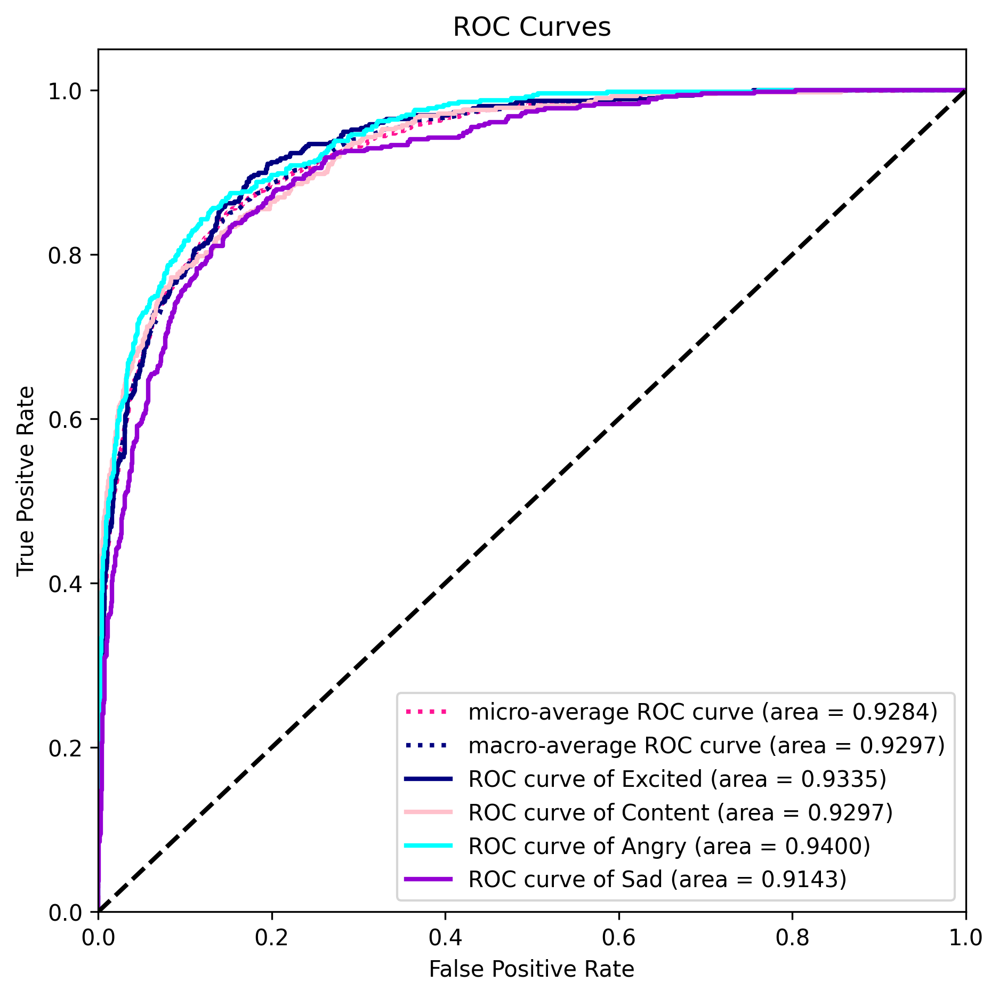

done


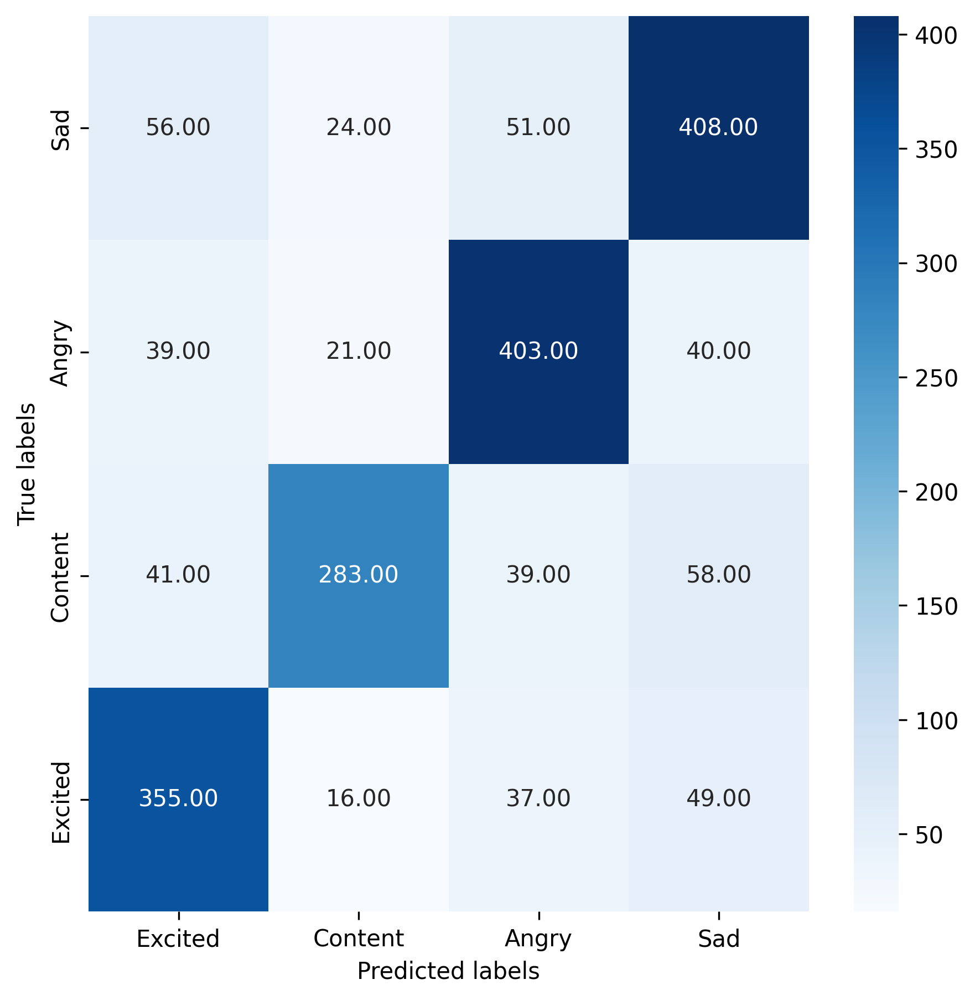

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.2851 - loss: 1.4134
Epoch 1: val_accuracy improved from -inf to 0.32344, saving model to model/model_best_within_t1_1.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.2853 - loss: 1.4132 - val_accuracy: 0.3234 - val_loss: 1.3607 - learning_rate: 0.0010
Epoch 2/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3730 - loss: 1.3268
Epoch 2: val_accuracy improved from 0.32344 to 0.39896, saving model to model/model_best_within_t1_1.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 14s 44ms/step - accuracy: 0.3731 - loss: 1.3267 - val_accuracy: 0.3990 - val_loss: 1.2993 - learning_rate: 0.0010
Epoch 3/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.3961 - loss: 1.2898
Epoch 3: val_accuracy improved from 0.39896 to 0.41406, saving model to model/model_best_within_t1_1.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3961 - loss: 1.2898 - val_accuracy: 0.4141 - val_loss: 1.2749

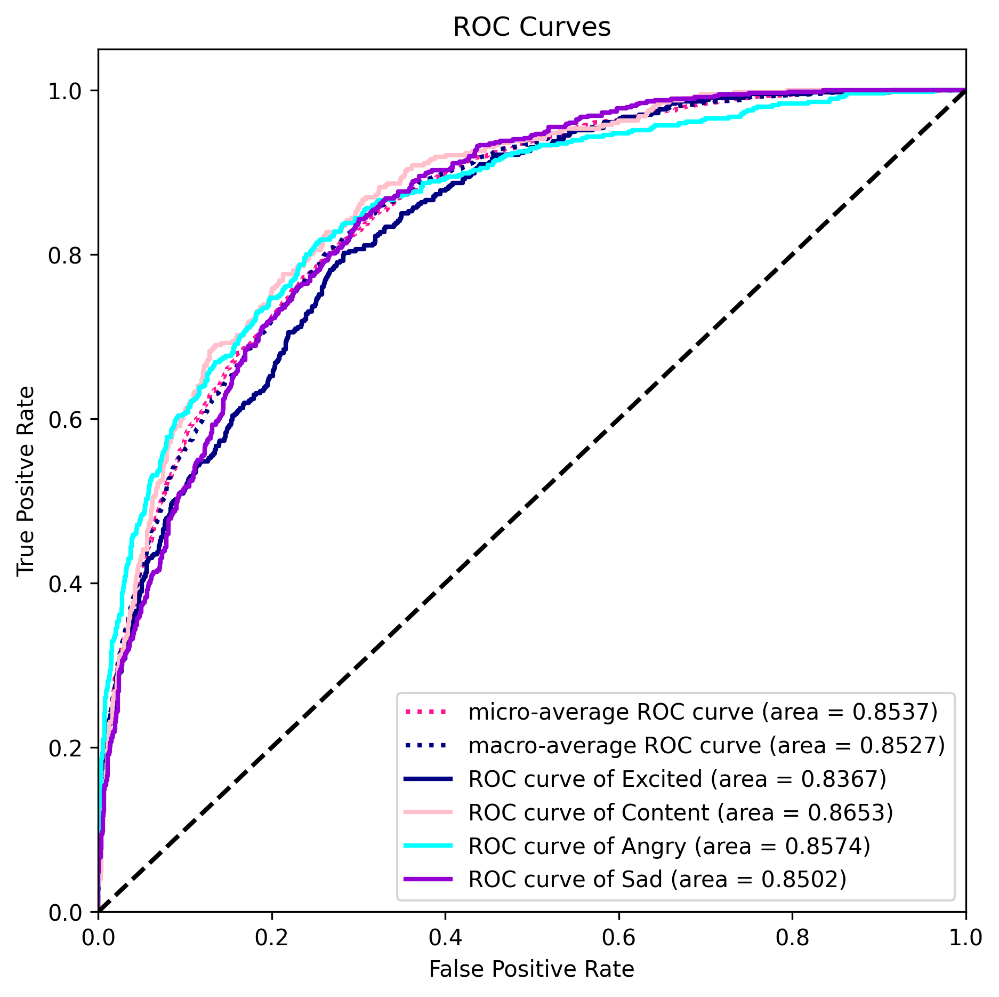

done


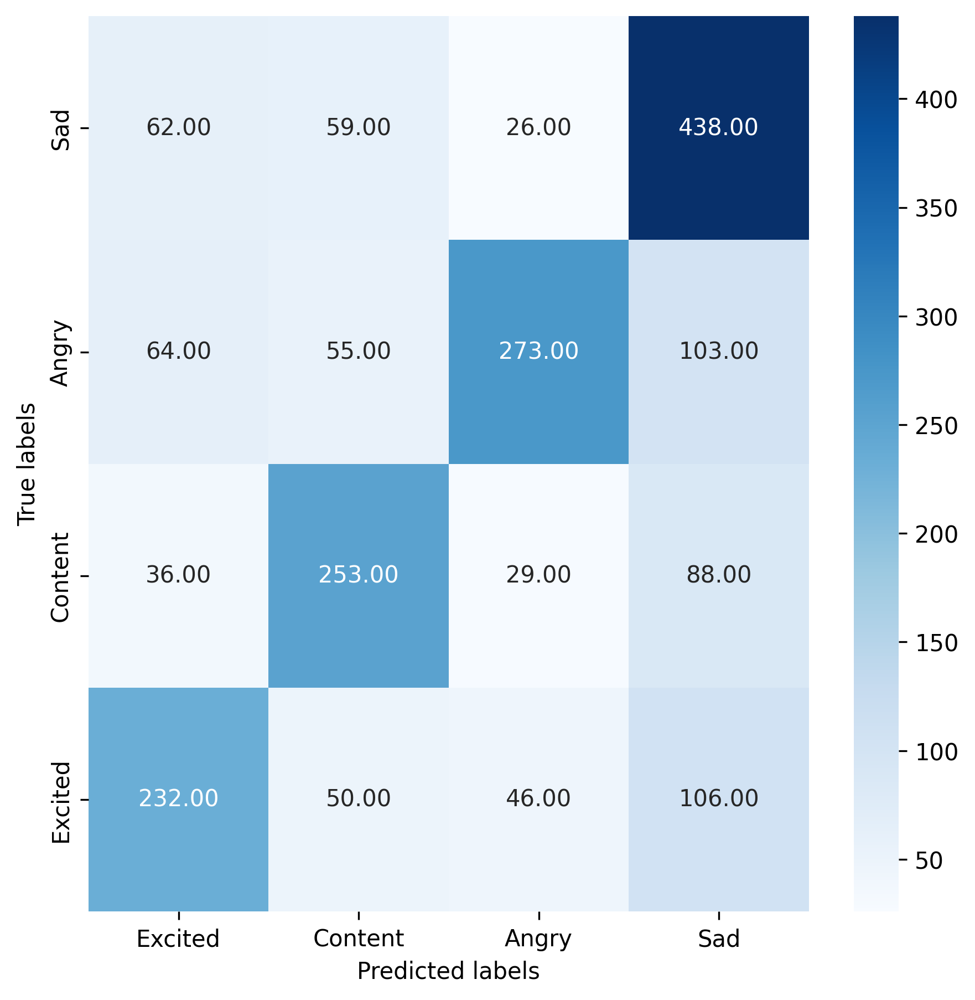

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.2941 - loss: 1.4036
Epoch 1: val_accuracy improved from -inf to 0.33125, saving model to model/model_best_within_t1_2.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.2943 - loss: 1.4034 - val_accuracy: 0.3313 - val_loss: 1.3448 - learning_rate: 0.0010
Epoch 2/200
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3706 - loss: 1.3221
Epoch 2: val_accuracy improved from 0.33125 to 0.39844, saving model to model/model_best_within_t1_2.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3706 - loss: 1.3220 - val_accuracy: 0.3984 - val_loss: 1.2925 - learning_rate: 0.0010
Epoch 3/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3892 - loss: 1.2986
Epoch 3: val_accuracy improved from 0.39844 to 0.41667, saving model to model/model_best_within_t1_2.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3892 - loss: 1.2986 - val_accuracy: 0.4167 - val_loss: 1.2731 

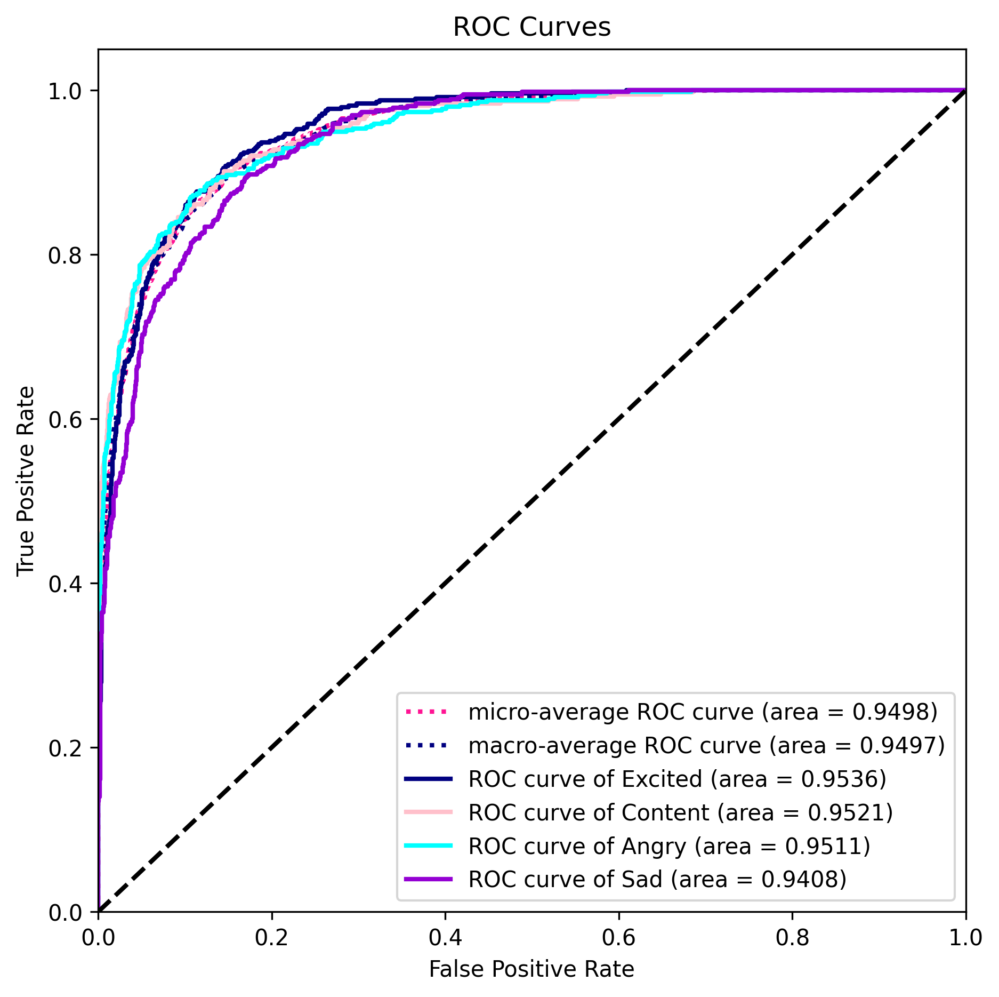

done


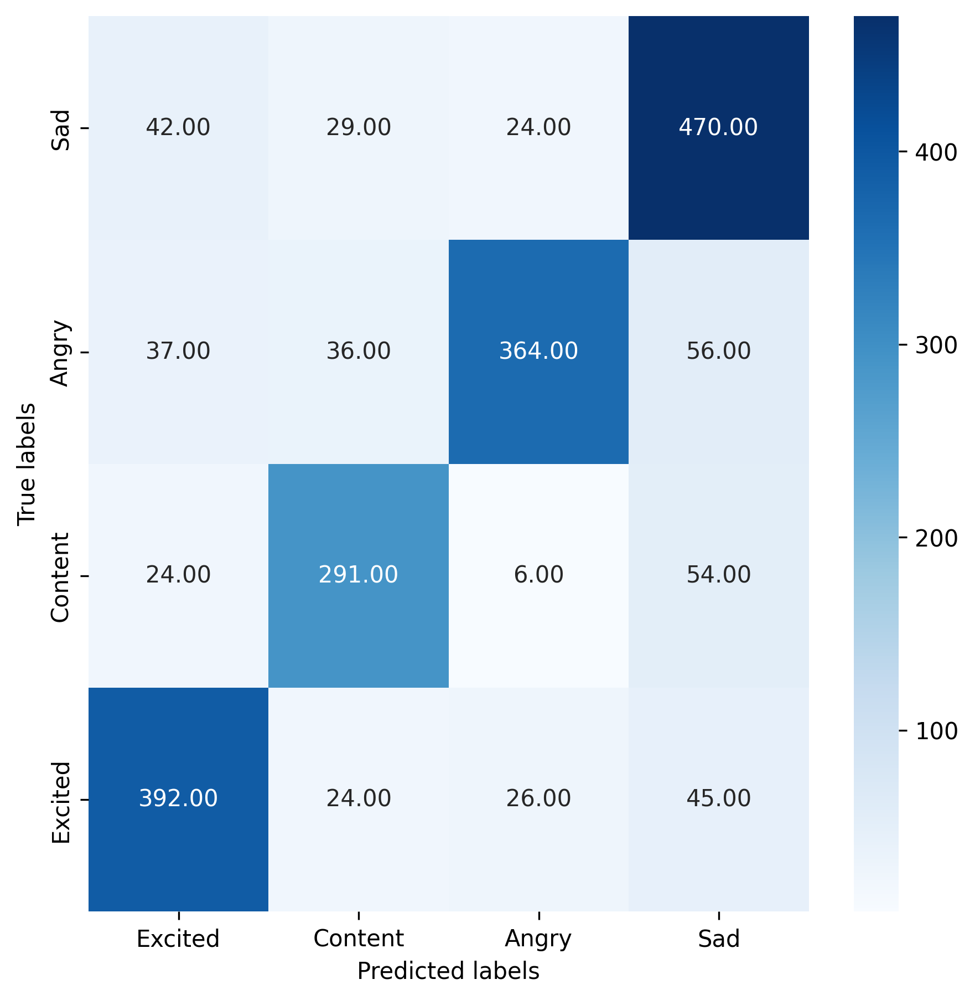

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.2934 - loss: 1.3978
Epoch 1: val_accuracy improved from -inf to 0.34583, saving model to model/model_best_within_t1_3.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.2936 - loss: 1.3976 - val_accuracy: 0.3458 - val_loss: 1.3637 - learning_rate: 0.0010
Epoch 2/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.3700 - loss: 1.3253
Epoch 2: val_accuracy improved from 0.34583 to 0.41823, saving model to model/model_best_within_t1_3.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3700 - loss: 1.3252 - val_accuracy: 0.4182 - val_loss: 1.2839 - learning_rate: 0.0010
Epoch 3/200
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4002 - loss: 1.2829
Epoch 3: val_accuracy improved from 0.41823 to 0.43594, saving model to model/model_best_within_t1_3.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.4002 - loss: 1.2829 - val_accuracy: 0.4359 - val_loss: 1.2618 

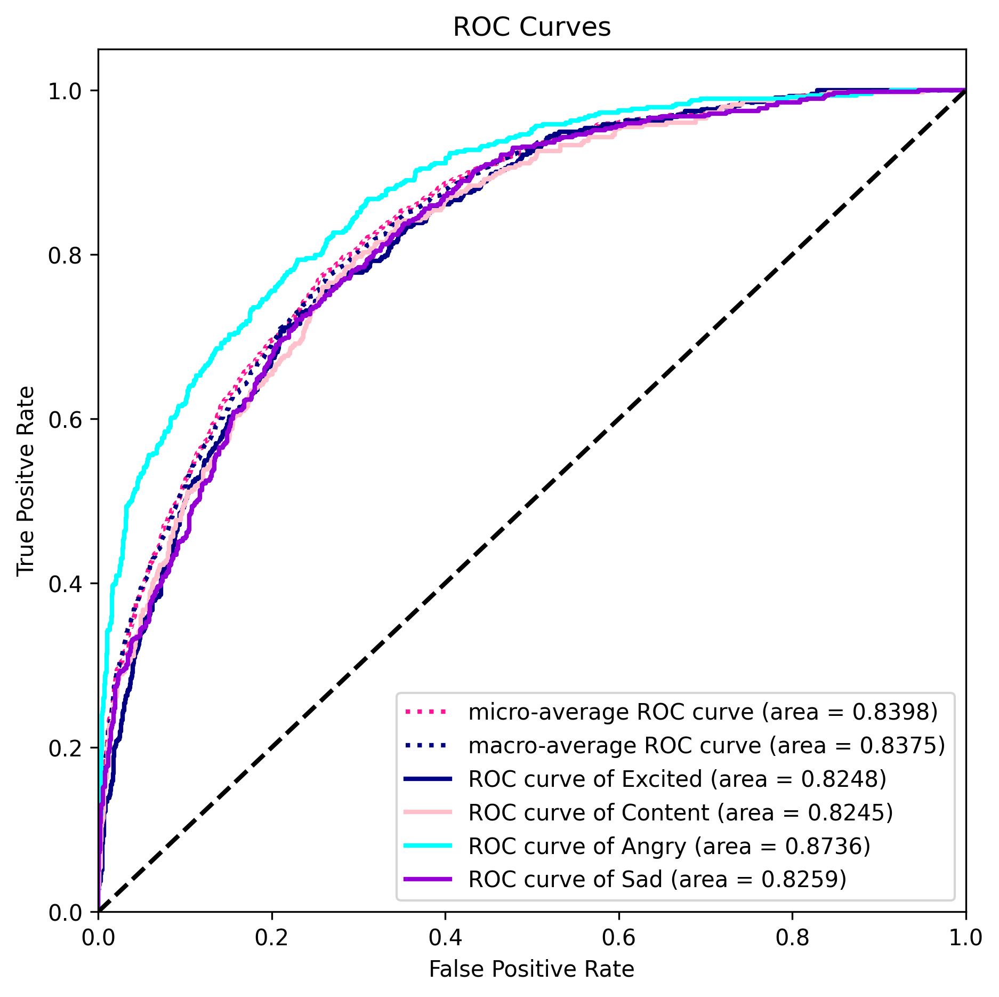

done


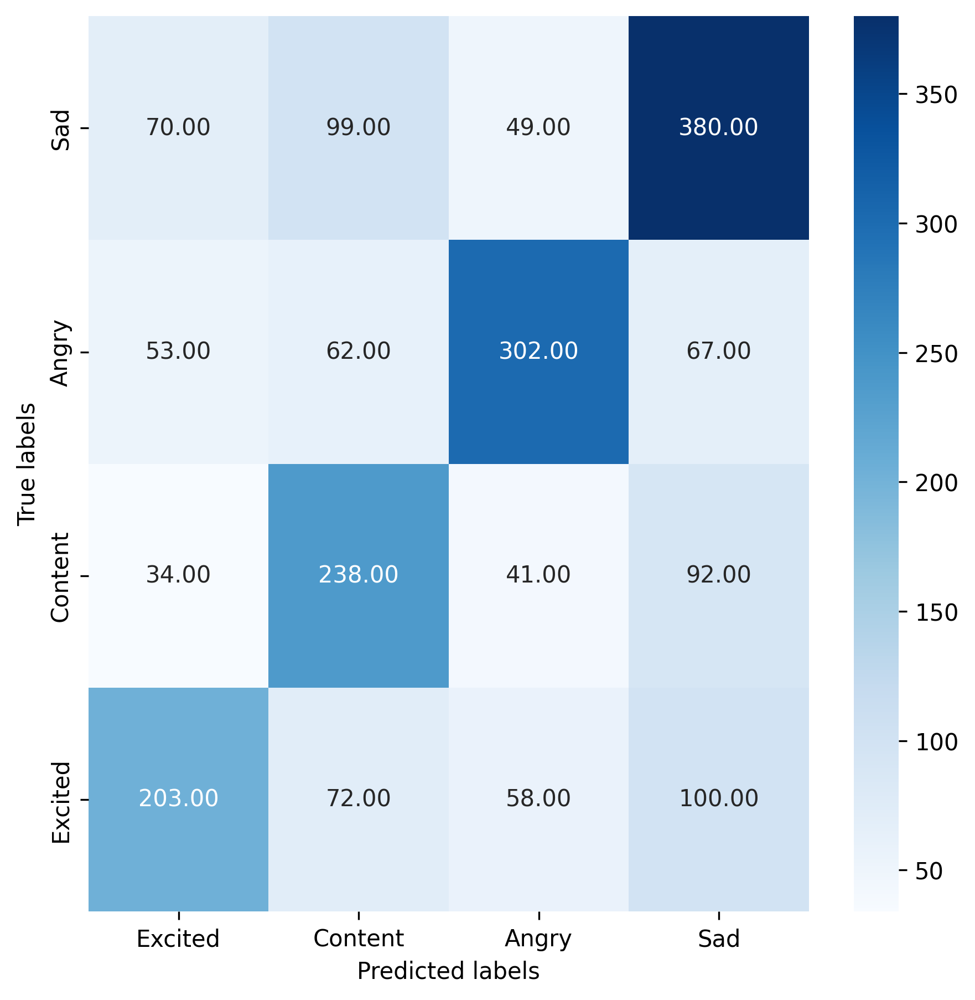

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.2854 - loss: 1.4283
Epoch 1: val_accuracy improved from -inf to 0.24792, saving model to model/model_best_within_t1_4.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.2856 - loss: 1.4280 - val_accuracy: 0.2479 - val_loss: 1.3918 - learning_rate: 0.0010
Epoch 2/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3729 - loss: 1.3183
Epoch 2: val_accuracy improved from 0.24792 to 0.36198, saving model to model/model_best_within_t1_4.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.3730 - loss: 1.3182 - val_accuracy: 0.3620 - val_loss: 1.3195 - learning_rate: 0.0010
Epoch 3/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4011 - loss: 1.2884
Epoch 3: val_accuracy improved from 0.36198 to 0.41354, saving model to model/model_best_within_t1_4.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - accuracy: 0.4011 - loss: 1.2884 - val_accuracy: 0.4135 - val_loss: 1.2761 

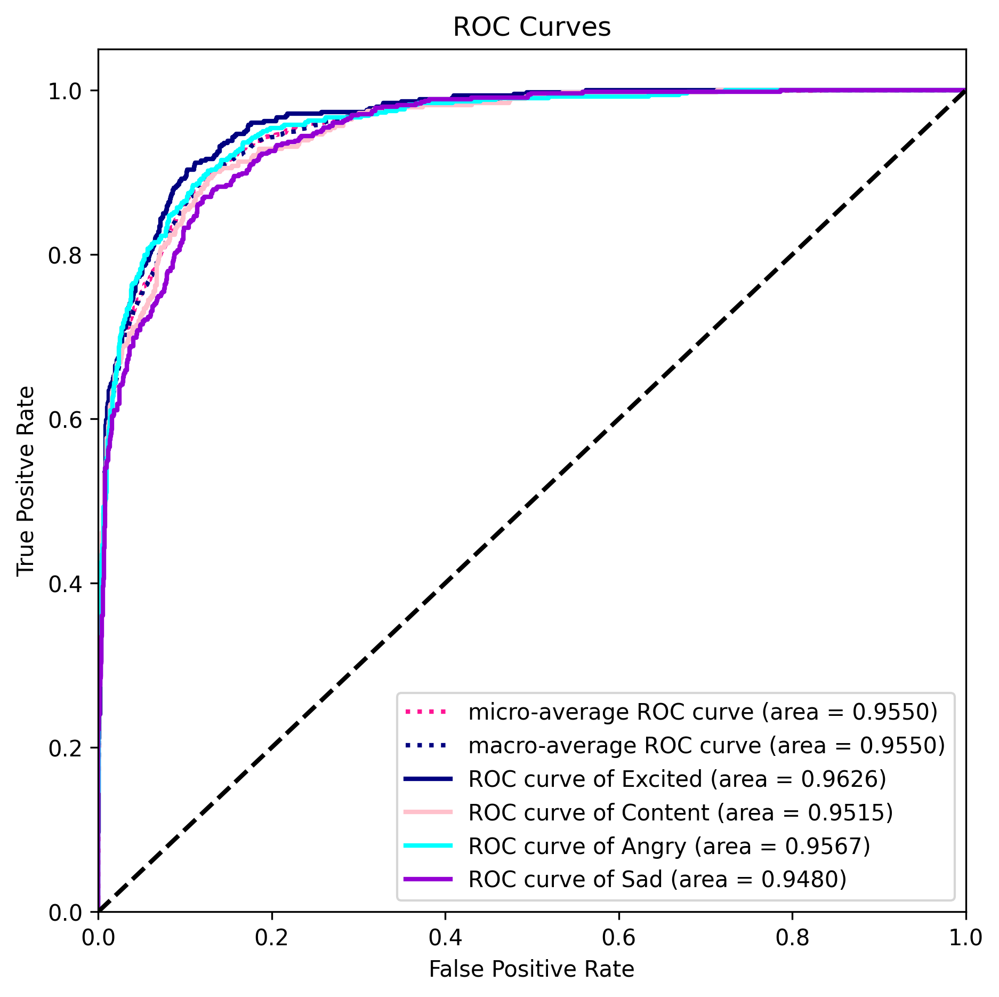

done


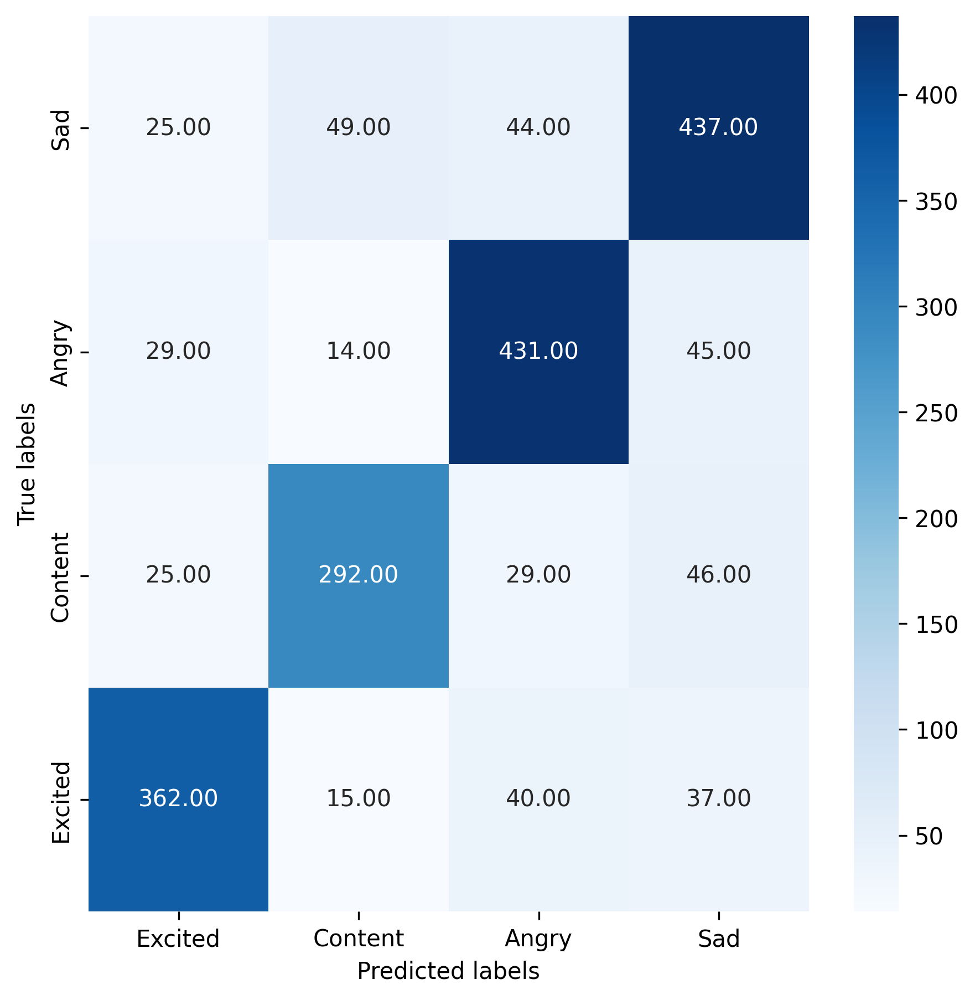

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.2842 - loss: 1.4401
Epoch 1: val_accuracy improved from -inf to 0.27760, saving model to model/model_best_within_t1_5.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - accuracy: 0.2843 - loss: 1.4398 - val_accuracy: 0.2776 - val_loss: 1.3683 - learning_rate: 0.0010
Epoch 2/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3610 - loss: 1.3326
Epoch 2: val_accuracy improved from 0.27760 to 0.38958, saving model to model/model_best_within_t1_5.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.3611 - loss: 1.3326 - val_accuracy: 0.3896 - val_loss: 1.2958 - learning_rate: 0.0010
Epoch 3/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3878 - loss: 1.2940
Epoch 3: val_accuracy improved from 0.38958 to 0.41354, saving model to model/model_best_within_t1_5.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.3878 - loss: 1.2939 - val_accuracy: 0.4135 - val_loss: 1.2580 

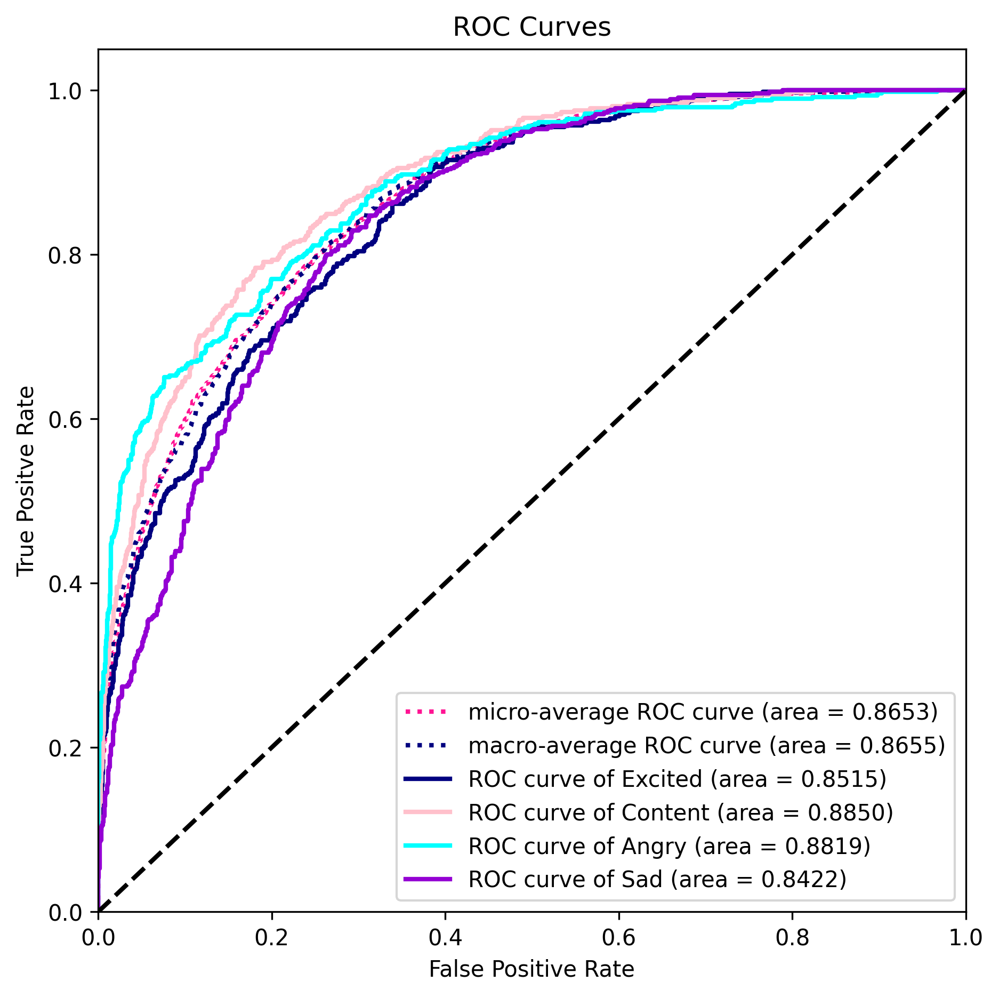

done


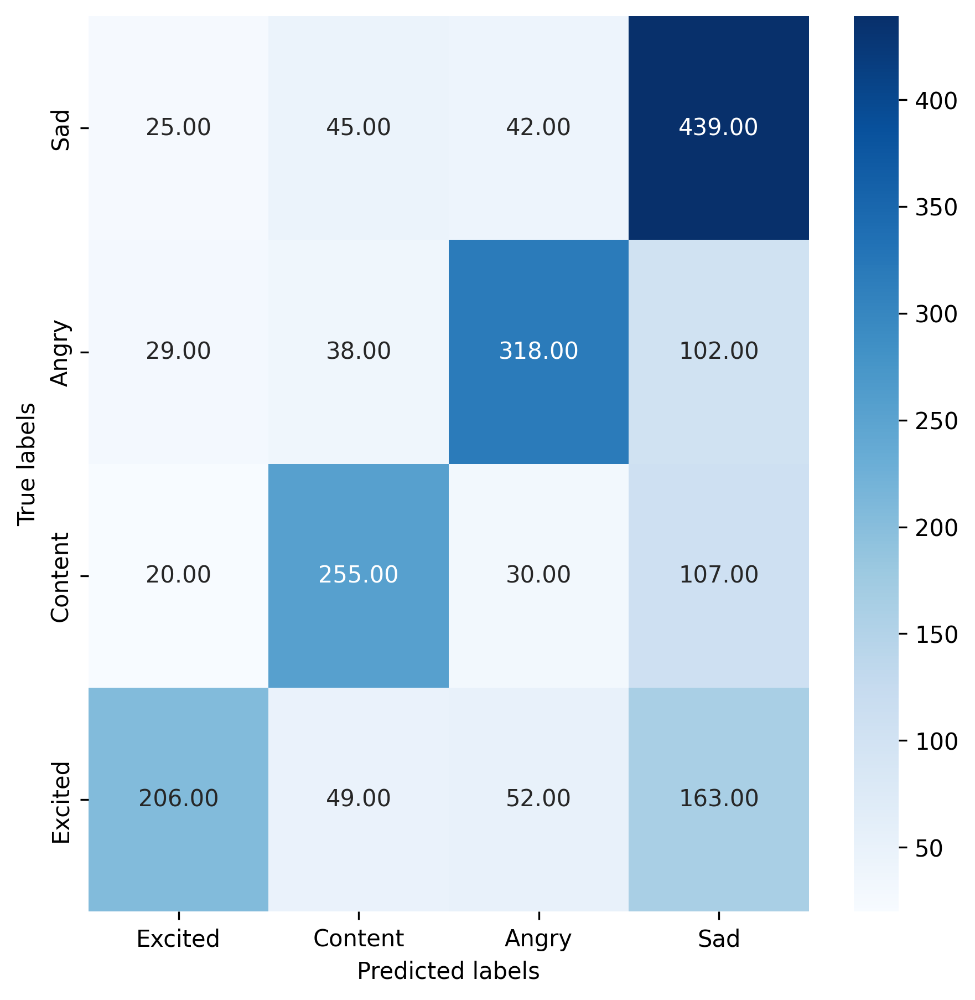

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.2759 - loss: 1.4198
Epoch 1: val_accuracy improved from -inf to 0.32135, saving model to model/model_best_within_t1_6.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.2762 - loss: 1.4195 - val_accuracy: 0.3214 - val_loss: 1.3595 - learning_rate: 0.0010
Epoch 2/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3814 - loss: 1.3148
Epoch 2: val_accuracy improved from 0.32135 to 0.42188, saving model to model/model_best_within_t1_6.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.3814 - loss: 1.3148 - val_accuracy: 0.4219 - val_loss: 1.2799 - learning_rate: 0.0010
Epoch 3/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3954 - loss: 1.2839
Epoch 3: val_accuracy improved from 0.42188 to 0.42865, saving model to model/model_best_within_t1_6.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.3955 - loss: 1.2839 - val_accuracy: 0.4286 - val_loss: 1.2486 

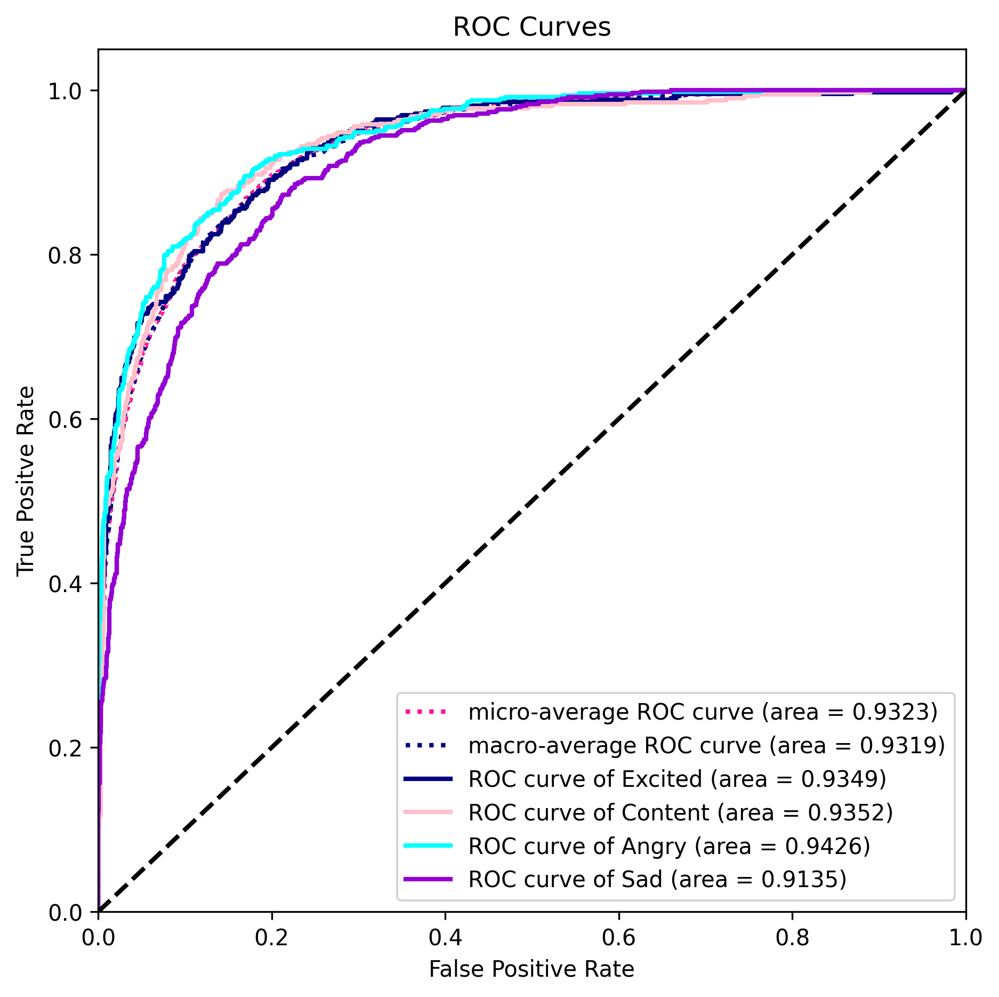

done


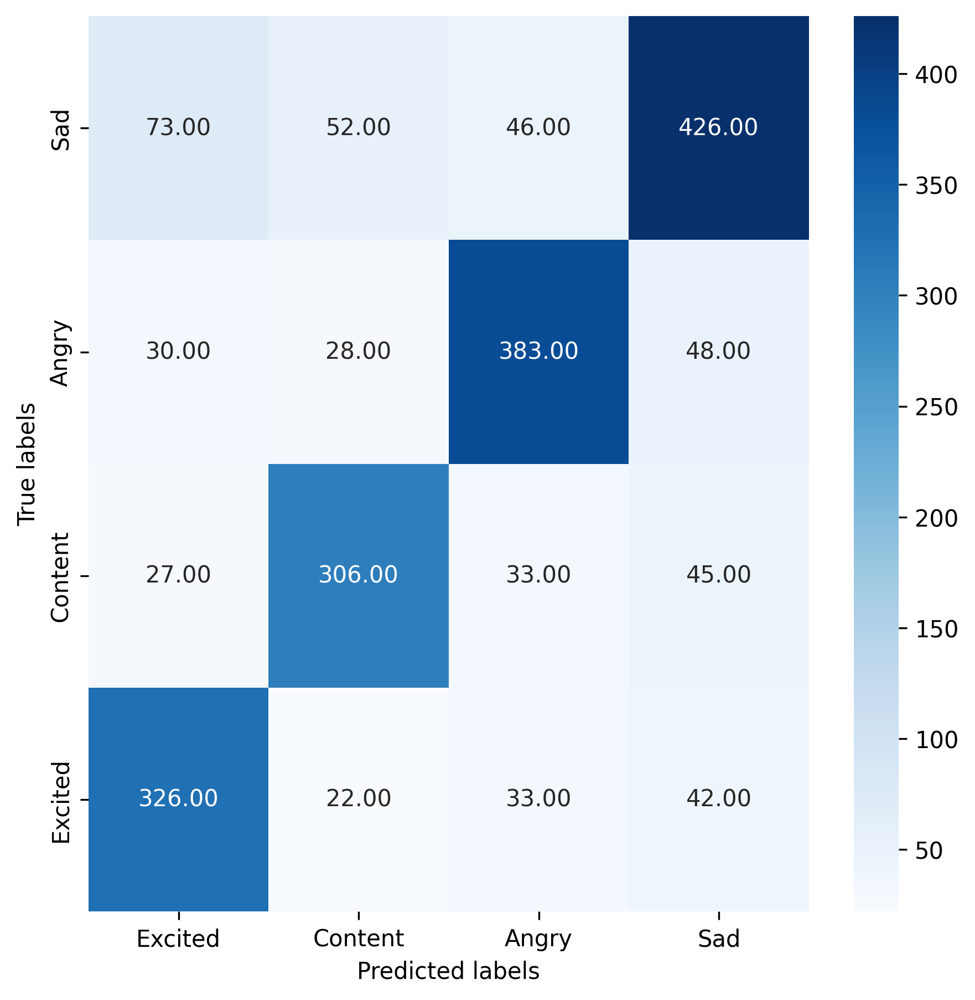

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.2912 - loss: 1.4164
Epoch 1: val_accuracy improved from -inf to 0.34271, saving model to model/model_best_within_t1_7.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - accuracy: 0.2913 - loss: 1.4161 - val_accuracy: 0.3427 - val_loss: 1.3519 - learning_rate: 0.0010
Epoch 2/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3591 - loss: 1.3347
Epoch 2: val_accuracy improved from 0.34271 to 0.40208, saving model to model/model_best_within_t1_7.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.3592 - loss: 1.3346 - val_accuracy: 0.4021 - val_loss: 1.2910 - learning_rate: 0.0010
Epoch 3/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3844 - loss: 1.3027
Epoch 3: val_accuracy improved from 0.40208 to 0.42396, saving model to model/model_best_within_t1_7.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.3845 - loss: 1.3027 - val_accuracy: 0.4240 - val_loss: 1.2621 

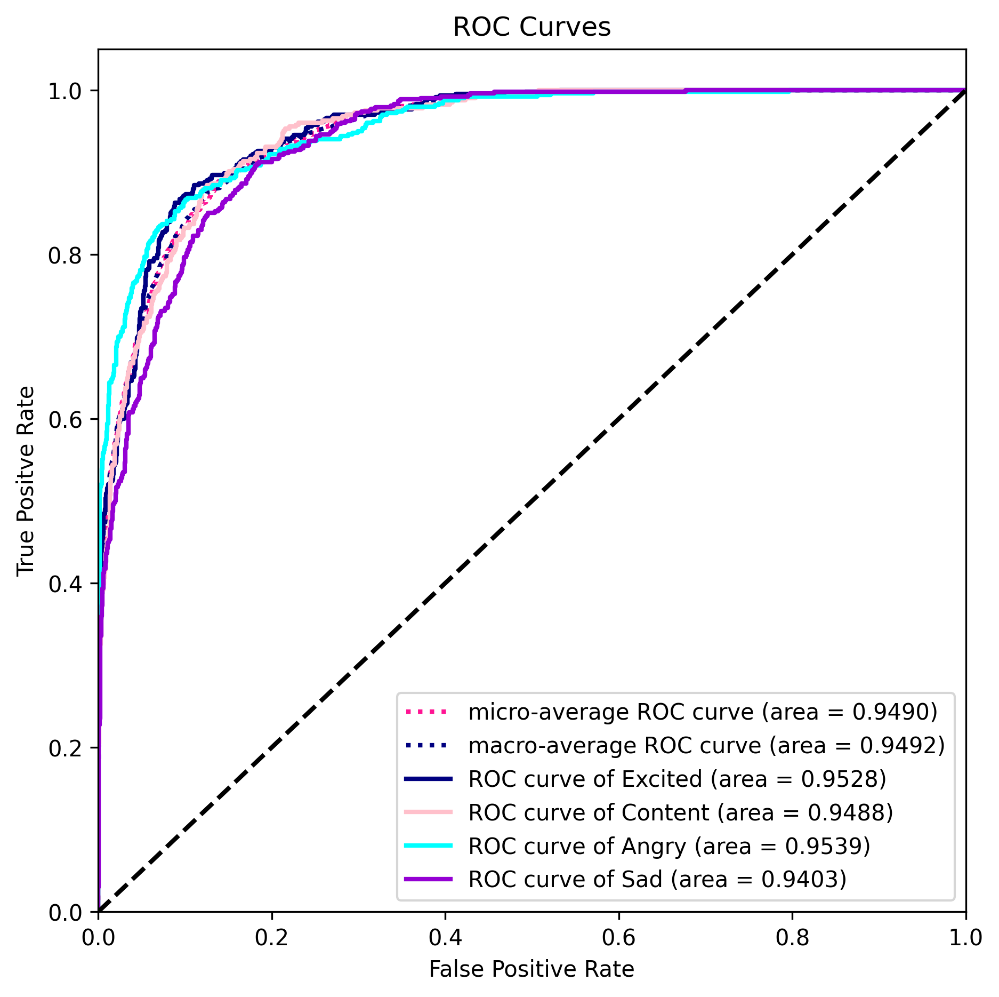

done


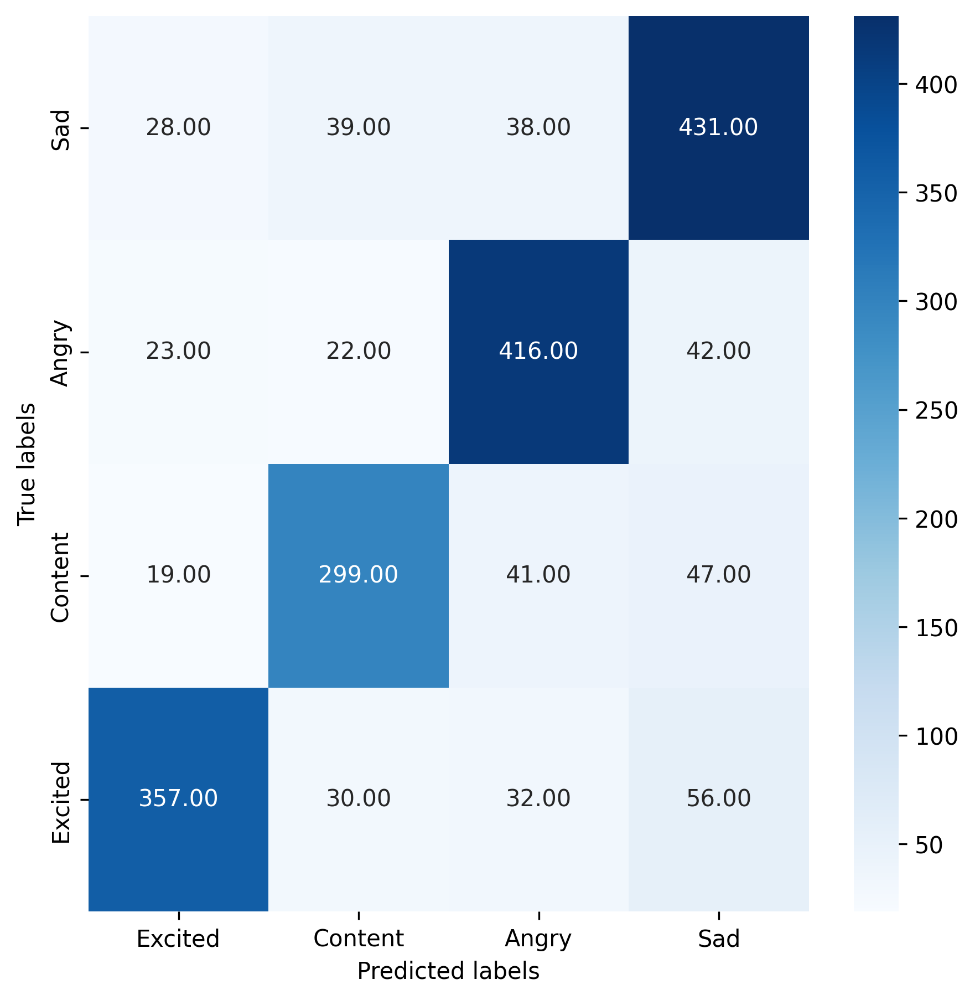

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.2959 - loss: 1.4200
Epoch 1: val_accuracy improved from -inf to 0.33698, saving model to model/model_best_within_t1_8.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - accuracy: 0.2961 - loss: 1.4197 - val_accuracy: 0.3370 - val_loss: 1.3594 - learning_rate: 0.0010
Epoch 2/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3718 - loss: 1.3208
Epoch 2: val_accuracy improved from 0.33698 to 0.36198, saving model to model/model_best_within_t1_8.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.3718 - loss: 1.3207 - val_accuracy: 0.3620 - val_loss: 1.3194 - learning_rate: 0.0010
Epoch 3/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3915 - loss: 1.2924
Epoch 3: val_accuracy improved from 0.36198 to 0.39635, saving model to model/model_best_within_t1_8.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.3915 - loss: 1.2924 - val_accuracy: 0.3964 - val_loss: 1.2851 

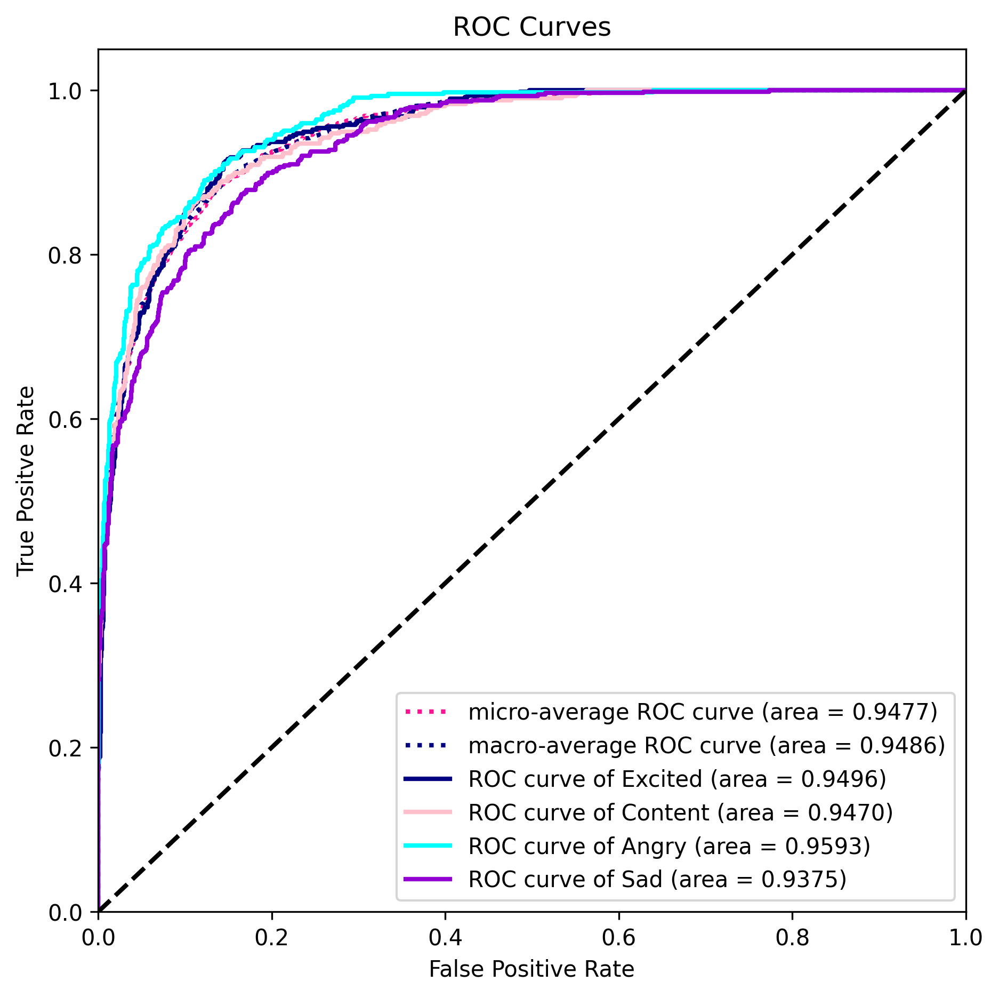

done


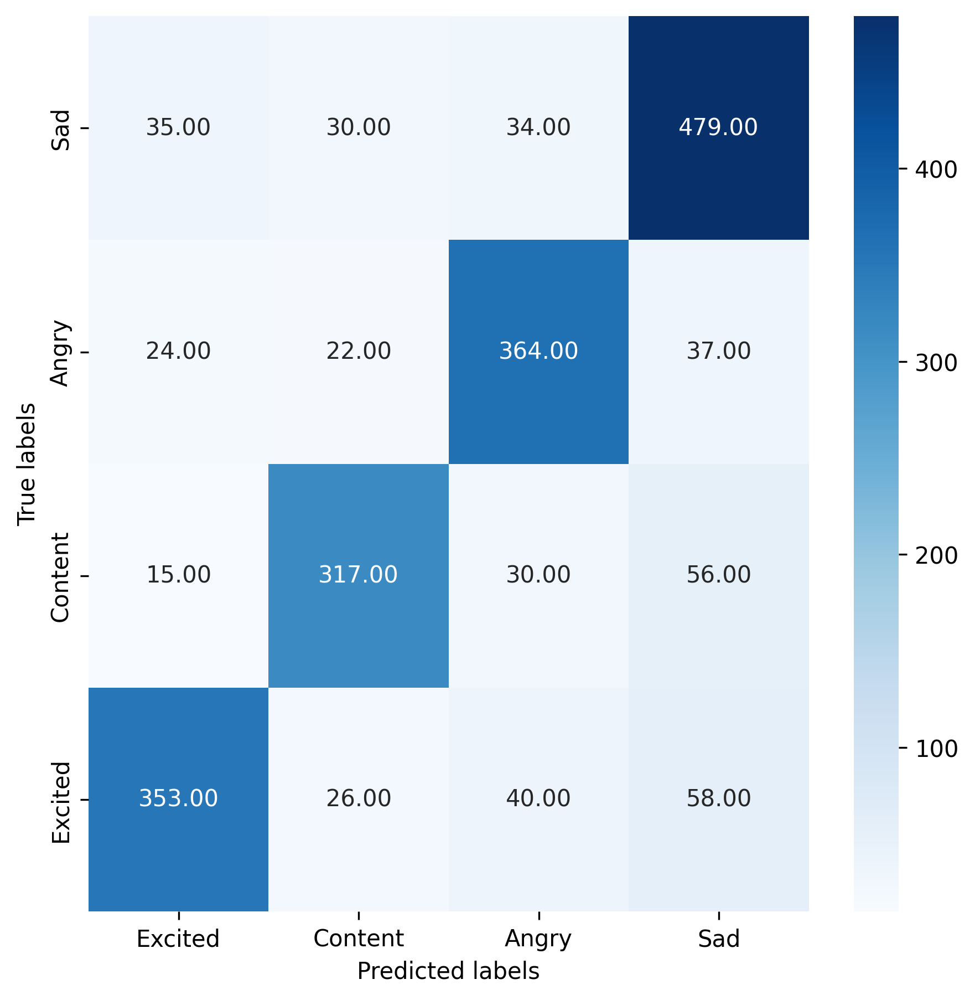

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.2810 - loss: 1.4624
Epoch 1: val_accuracy improved from -inf to 0.30625, saving model to model/model_best_within_t1_9.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 16s 55ms/step - accuracy: 0.2813 - loss: 1.4618 - val_accuracy: 0.3063 - val_loss: 1.3560 - learning_rate: 0.0010
Epoch 2/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3721 - loss: 1.3112
Epoch 2: val_accuracy improved from 0.30625 to 0.38281, saving model to model/model_best_within_t1_9.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.3722 - loss: 1.3112 - val_accuracy: 0.3828 - val_loss: 1.3048 - learning_rate: 0.0010
Epoch 3/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3898 - loss: 1.2959
Epoch 3: val_accuracy did not improve from 0.38281
135/135 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.3898 - loss: 1.2959 - val_accuracy: 0.3818 - val_loss: 1.3112 - learning_rate: 0.0010
Epoch 4/200
135/135 ━━━━━━━━━━━━━━━━━

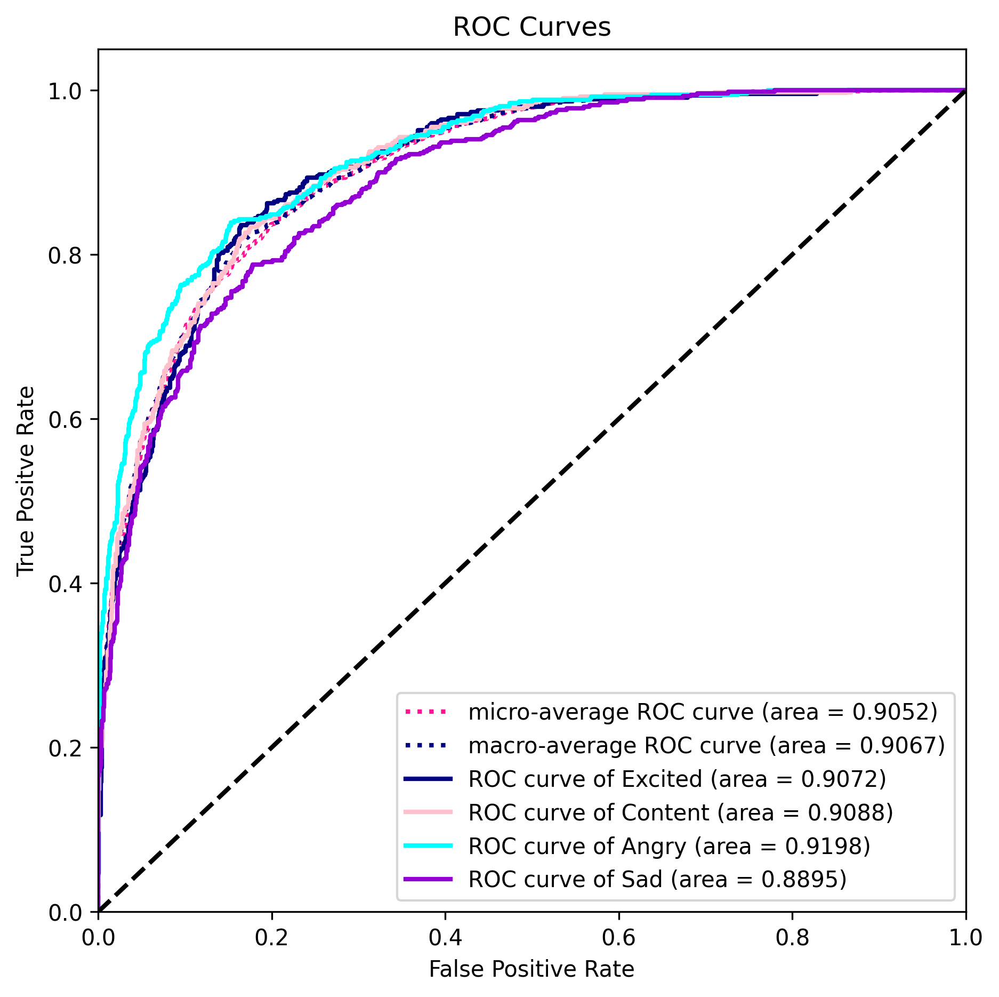

done


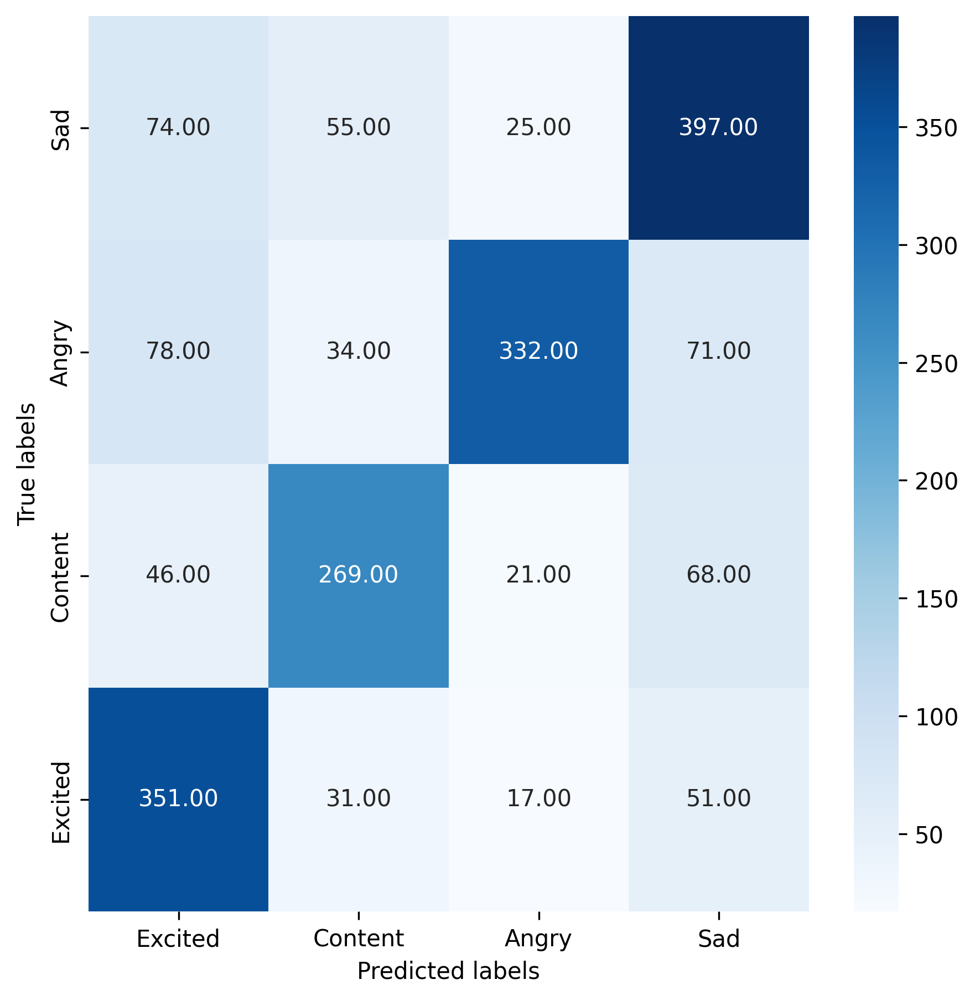

done


Model: "functional_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_18 (InputLayer)     │ (None, 32, 512, 1)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 32, 512, 8)     │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_54          │ (None, 32, 512, 8)     │            32 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ depthwise_conv2d_18             │ (None, 1, 512, 32)     │         1,024 │
│ (DepthwiseConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_55          │ (None, 1, 512, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_36 (Activation)      │ (None, 1, 512, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_18            │ (None, 1, 128, 32)     │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_72 (Dropout)            │ (None, 1, 128, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_18             │ (None, 1, 128, 32)     │         1,536 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_56          │ (None, 1, 128, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_37 (Activation)      │ (None, 1, 128, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda_18 (Lambda)              │ (None, 128, 32)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ positional_encoding_18          │ (None, 128, 32)        │             0 │
│ (PositionalEncoding)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ transformer_block_18            │ (None, 128, 32)        │        34,720 │
│ (TransformerBlock)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_18     │ (None, 32)             │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_75 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 4)              │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax (Activation)            │ (None, 4)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 114,338 (446.64 KB)

 Trainable params: 38,064 (148.69 KB)

 Non-trainable params: 144 (576.00 B)

 Optimizer params: 76,130 (297.39 KB)

[0.754687488079071, 0.6229166388511658, 0.7901041507720947, 0.5848958492279053, 0.7927083373069763, 0.6343749761581421, 0.7505208253860474, 0.7828124761581421, 0.7880208492279053, 0.7026041746139526]
Accuracy: 72.04% (+/- 7.50%)
ERTNet Train End.


In [8]:
import logging
ertnet_logger = logging.getLogger('ertnet_logger')
ertnet_logger.setLevel(logging.INFO)
os.makedirs('model', exist_ok=True)
os.makedirs('picture', exist_ok=True)
file_handler = logging.FileHandler('logs/ertnet.log')
ertnet_logger.addHandler(file_handler)

import numpy as np
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []

# Load data
data = np.load('data_processed/train_data.npy')
labels = np.load('data_processed/train_labels.npy')
labels = np.argmax(labels, axis=1)
# Convert labels to categorical one-hot encoding
labels = to_categorical(labels)

# Load Hyperparamters
# from config import Model_Config_DEAP
class Model_Config_DEAP:
    K = 10

    nb_classes=4
    Chans=32
    Samples=512
    dropoutRate=0.5
    kernLength=64
    F1=8
    D=4
    F2=32
    dropoutType='Dropout'

    es_patience=50
    batch_size = 128
    max_epochs = 200
    lr_begin = 1e-3
    lr_end = 1e-5
    re_lr_patience = 10
    re_lr_factor = 0.1
params = Model_Config_DEAP

# 10-fold cross validation
kf = KFold(n_splits=params.K,shuffle=True,random_state=42)
i = 0
for train_index, test_index in kf.split(data):

    train_data, test_data = data[train_index], data[test_index]
    train_labels, test_labels = labels[train_index], labels[test_index]

    early_stop = EarlyStopping(monitor='val_loss', patience=params.es_patience, verbose=1)
    # Set model checkpoint callback
    checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_t1_{i}.weights.h5',
                                 monitor='val_accuracy',
                                 verbose=1, save_best_only=True, mode='max', save_weights_only=True)
    # Load model
    model = ertnet(nb_classes=params.nb_classes, Chans=params.Chans,
                    Samples=params.Samples, dropoutRate=params.dropoutRate,
                    kernLength=params.kernLength, F1=params.F1, D=params.D,
                    F2=params.F2)
    # Use tf.keras.optimizers.Adam instead of keras.optimizers.adam_v2.Adam
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=params.lr_begin),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    # Set reduce learning rate callback
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=params.re_lr_factor,
                                  patience=params.re_lr_patience, mode='auto',
                                  min_lr=params.lr_end)
    # Fit model
    hist = model.fit(train_data, train_labels, epochs=params.max_epochs,
                     batch_size=params.batch_size,
                     validation_data=(test_data, test_labels),
                     callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])
    # Get the best accuracy on the validation set
    cv_scores.append(max(list(hist.history['val_accuracy'])))

    model_best = ertnet(nb_classes=params.nb_classes, Chans=params.Chans,
                        Samples=params.Samples, dropoutRate=params.dropoutRate,
                        kernLength=params.kernLength, F1=params.F1, D=params.D,
                        F2=params.F2)
    model_best.load_weights(f'model/model_best_within_t1_{i}.weights.h5')
    # Get the prediction on the test set
    pred = model_best.predict(test_data)
    # Plot ROC curve
    plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'],
                      colorlist=['navy', 'pink', 'cyan', 'darkviolet'],
                      file=f'picture/roc_within_t1_{i}.jpg',dpi=300)
    # Plot confusion matrix
    plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                         ClassSet=['Excited', 'Content', 'Angry', 'Sad'],
                         file=f'picture/hm_within_t1_{i}.jpg',dpi=300)
    ertnet_logger.info(f"{i} Fold Training Epochs Accuracy: {list(hist.history['val_accuracy'])}")
    i = i + 1
# Print model summary
model.summary()
# Save information to log file
print(cv_scores)
ertnet_logger.info(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
ertnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('ERTNet Train End.')

### VISUALIZE KERNELS

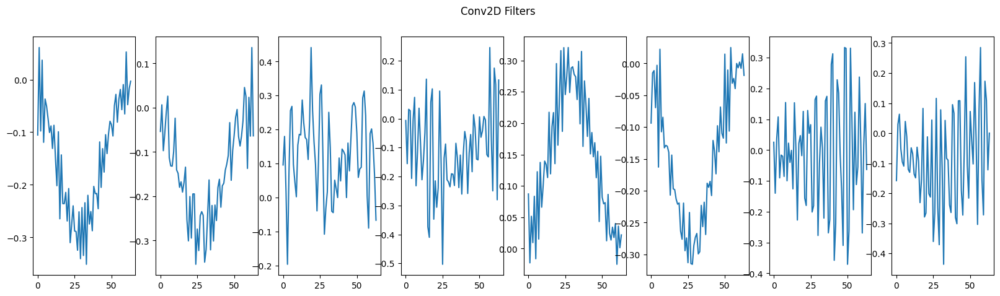

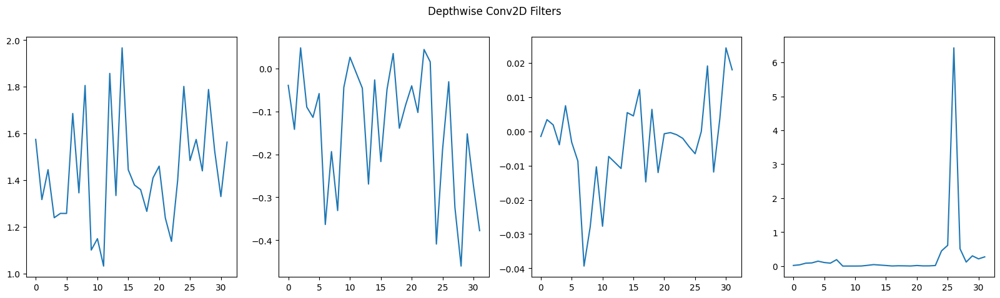

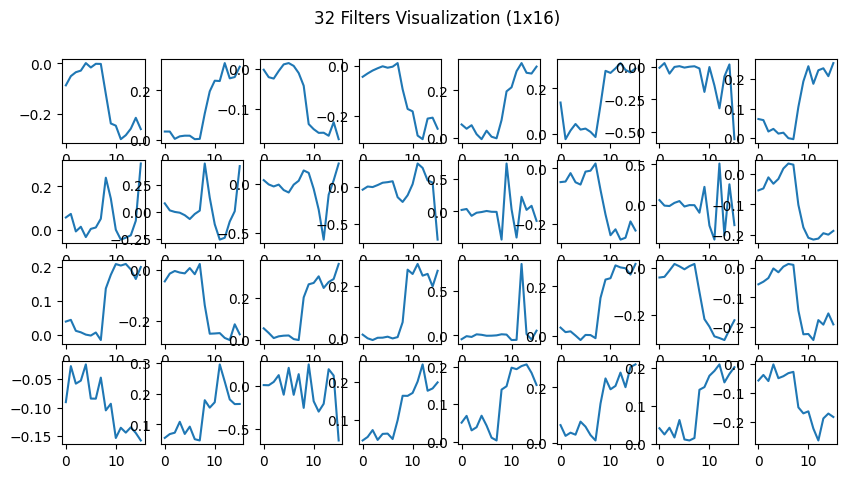

In [25]:
from keras.models import load_model

model = ertnet(nb_classes=4, Chans=32, Samples=512, kernLength=64, F1=8, D=4, F2=32)

# Load the weights from the .h5 file
model.load_weights('/model/model_best_within_t1_0.weights.h5')  # Modify the path as needed

# Get the layers by name or by index
conv1_layer = model.get_layer(index=1)  # This should correspond to the Conv2D layer
depthwise_conv_layer = model.get_layer(index=4)  # This should correspond to the DepthwiseConv2D layer
separable_conv_layer = model.get_layer(index=8)  # This should correspond to the separable_conv2d layer

# Visualize filters from the first Conv2D layer
def visualize_conv_kernels(weights, num_filters, chans, title='Conv2D Kernels'):
    fig, axes = plt.subplots(1, num_filters, figsize=(20, 5))
    for i in range(num_filters):
        ax = axes[i]
        kernel = weights[:, :, 0, i][0]  # Extract the ith filter
        ax.plot(kernel)  # Plot filter
    fig.suptitle(title)
    plt.show()


# Visualize DepthwiseConv2D filters (assuming depth_multiplier = D)
def visualize_depthwise_kernels(weights, chans, depth_multiplier, title='Depthwise Conv2D Kernels'):
    fig, axes = plt.subplots(1, depth_multiplier, figsize=(20, 5))
    for j in range(depth_multiplier):
        ax = axes[j]
        kernel = weights[j]  # Extract depthwise filter
        ax.plot(kernel)  # Plot filter
    fig.suptitle(title)
    plt.show()
    

def visualize_separable_kernels(weights, title='Separable Conv2D Kernels'):
    weights = weights[0, :, :, 0] 
    filters_transposed = weights.T  
    n_filters = filters_transposed.shape[0]

    plt.figure(figsize=(10, 5))  

    for i in range(n_filters):
        plt.subplot(4, 8, i+1)  
        plt.plot(filters_transposed[i].reshape(16, 1))  

    plt.suptitle('32 Filters Visualization (1x16)')
    plt.show()

conv1_weights = conv1_layer.get_weights()[0]
# Visualize Conv2D filters
visualize_conv_kernels(conv1_weights,8, 32, title='Conv2D Filters')

depthwise_weights = depthwise_conv_layer.get_weights()
# Visualize DepthwiseConv2D filters
visualize_depthwise_kernels(depthwise_weights, 32, 4, title='Depthwise Conv2D Filters')

# Visualize SeparablConv2D filters
separable_weights = separable_conv_layer.get_weights()[0]
visualize_separable_kernels(separable_weights)

## CL 

Epoch 1/200


2024-10-19 09:19:31.359215: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/functional_43_1/dropout_84_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.2766 - loss: 1.5050
Epoch 1: val_accuracy improved from -inf to 0.35000, saving model to model/model_best_within_cl.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - accuracy: 0.2767 - loss: 1.5047 - val_accuracy: 0.3500 - val_loss: 1.4134 - learning_rate: 0.0010
Epoch 2/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.3736 - loss: 1.3663
Epoch 2: val_accuracy improved from 0.35000 to 0.38438, saving model to model/model_best_within_cl.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.3737 - loss: 1.3662 - val_accuracy: 0.3844 - val_loss: 1.3570 - learning_rate: 0.0010
Epoch 3/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.4186 - loss: 1.3002
Epoch 3: val_accuracy improved from 0.38438 to 0.40417, saving model to model/model_best_within_cl.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - accuracy: 0.4186 - loss: 1.3002 - val_accuracy: 0.4042 - val_loss: 1.3200 - learning_rate: 0

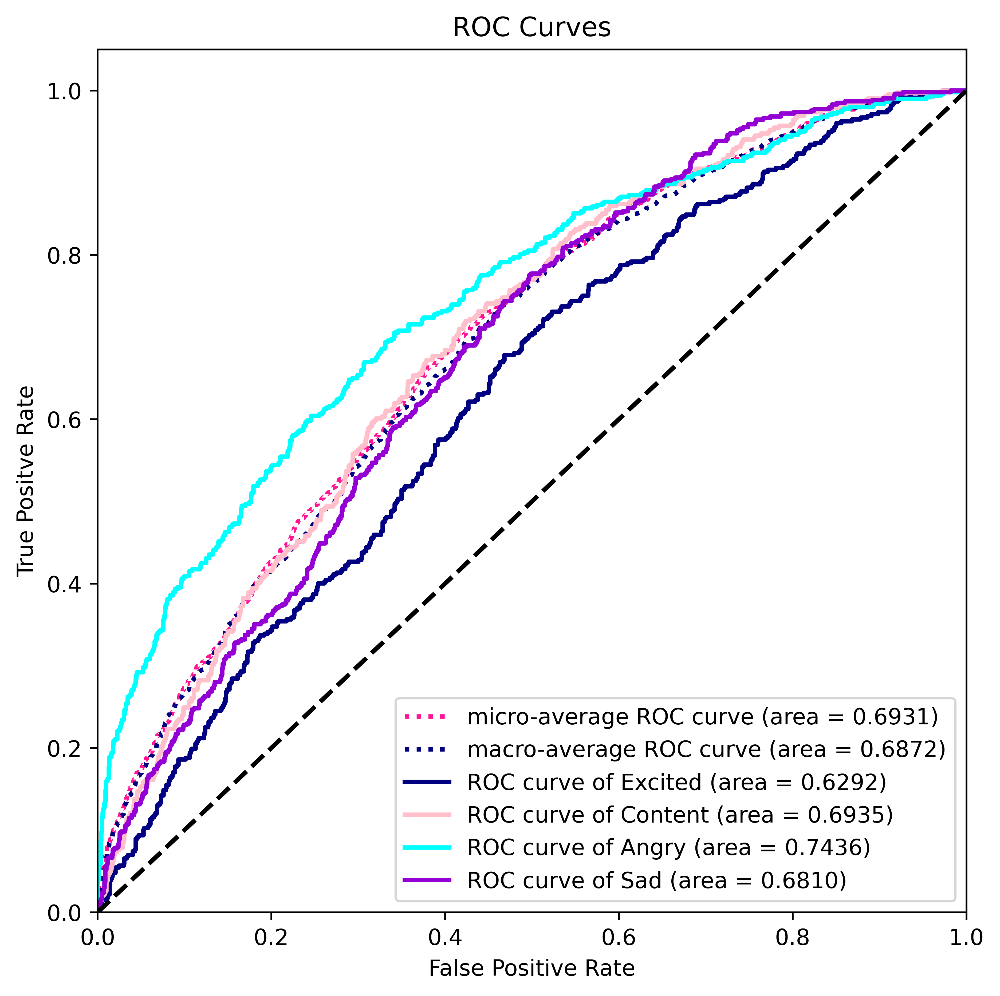

done


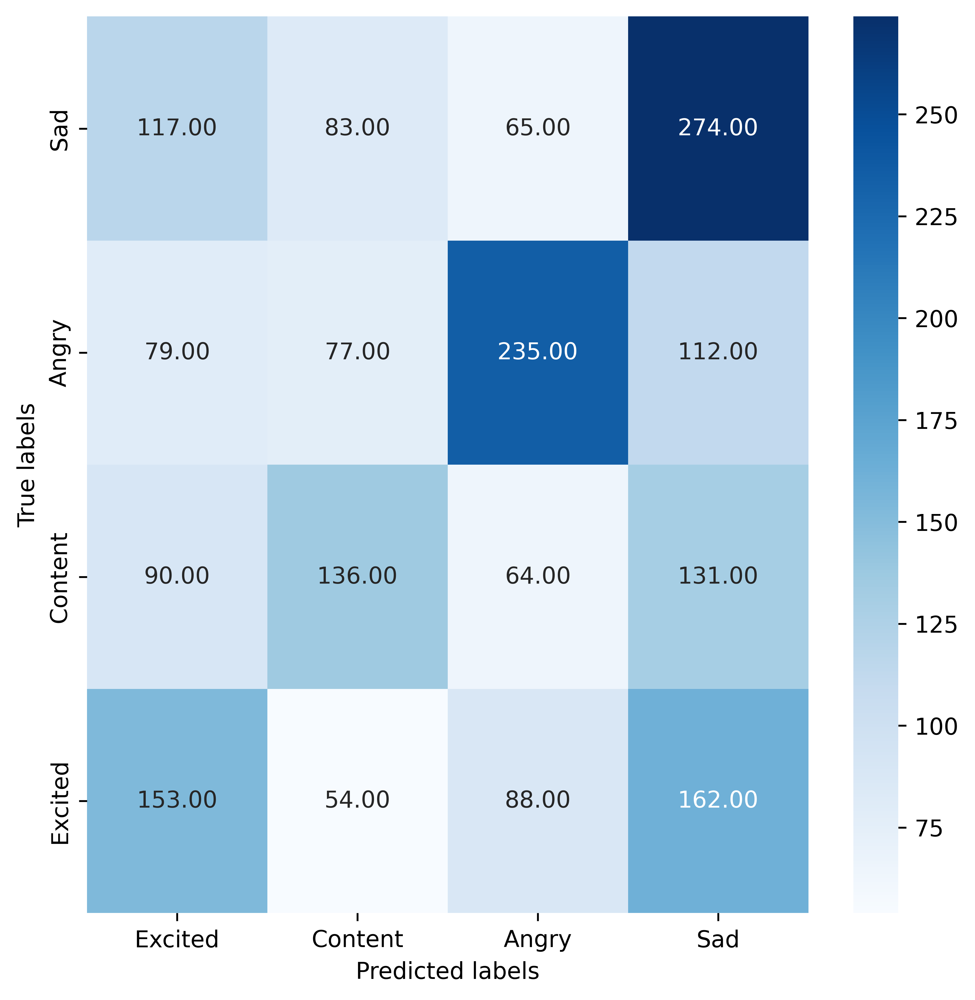

done


Model: "functional_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_21 (InputLayer)     │ (None, 32, 512, 1)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 32, 512, 8)     │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_63          │ (None, 32, 512, 8)     │            32 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ depthwise_conv2d_21             │ (None, 1, 512, 32)     │         1,024 │
│ (DepthwiseConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_64          │ (None, 1, 512, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_42 (Activation)      │ (None, 1, 512, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_21            │ (None, 1, 128, 32)     │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_84 (Dropout)            │ (None, 1, 128, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, 1, 4096)        │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru (GRU)                       │ (None, 64)             │       799,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_85 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,403,022 (9.17 MB)

 Trainable params: 800,980 (3.06 MB)

 Non-trainable params: 80 (320.00 B)

 Optimizer params: 1,601,962 (6.11 MB)

[0.4260416626930237]
Accuracy: 42.60% (+/- 0.00%)
cl Train End.


In [11]:
import logging
cl_logger = logging.getLogger('cl_logger')
cl_logger.setLevel(logging.INFO)
os.makedirs('logs', exist_ok=True)
os.makedirs('model', exist_ok=True)
os.makedirs('picture', exist_ok=True)
file_handler = logging.FileHandler('logs/cl.log')
cl_logger.addHandler(file_handler)

import numpy as np
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []

# Load data
data = np.load('data_processed/train_data.npy')
labels = np.load('data_processed/train_labels.npy')
labels = np.argmax(labels, axis=1)
# Convert labels to categorical one-hot encoding
labels = to_categorical(labels)

train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size = 0.1, random_state=42)

early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)
checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_cl.weights.h5', 
                             monitor='val_accuracy', verbose=1, save_best_only=True, 
                             mode='max', save_weights_only=True)

model = CNN_BiLSTM(4, Chans = 32, Samples = 512, F1=8, D=4, F2=32)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

hist = model.fit(train_data, train_labels, epochs=200,
                 batch_size=128,
                 validation_data=(test_data, test_labels),
                 callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])

cv_scores.append(max(list(hist.history['val_accuracy'])))


pred = model.predict(test_data)

plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                  colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                  file=f'picture/roc_within_cl.jpg',dpi=600)

plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                     ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                     file=f'picture/hm_within_cl.jpg',dpi=600)
cl_logger.info(f"Training Epochs Accuracy: {list(hist.history['val_accuracy'])}")

model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
cl_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('cl Train End.')


## DEEPCONVNET

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.2657 - loss: 1.5522
Epoch 1: val_accuracy improved from -inf to 0.33229, saving model to model/model_best_within_deepconvnet.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - accuracy: 0.2659 - loss: 1.5511 - val_accuracy: 0.3323 - val_loss: 1.3694 - learning_rate: 0.0010
Epoch 2/200
133/135 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.3519 - loss: 1.3673
Epoch 2: val_accuracy improved from 0.33229 to 0.37083, saving model to model/model_best_within_deepconvnet.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - accuracy: 0.3521 - loss: 1.3669 - val_accuracy: 0.3708 - val_loss: 1.2918 - learning_rate: 0.0010
Epoch 3/200
133/135 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.3830 - loss: 1.3159
Epoch 3: val_accuracy improved from 0.37083 to 0.39271, saving model to model/model_best_within_deepconvnet.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - accuracy: 0.3831 - loss: 1.3158 - val_accuracy: 0.392

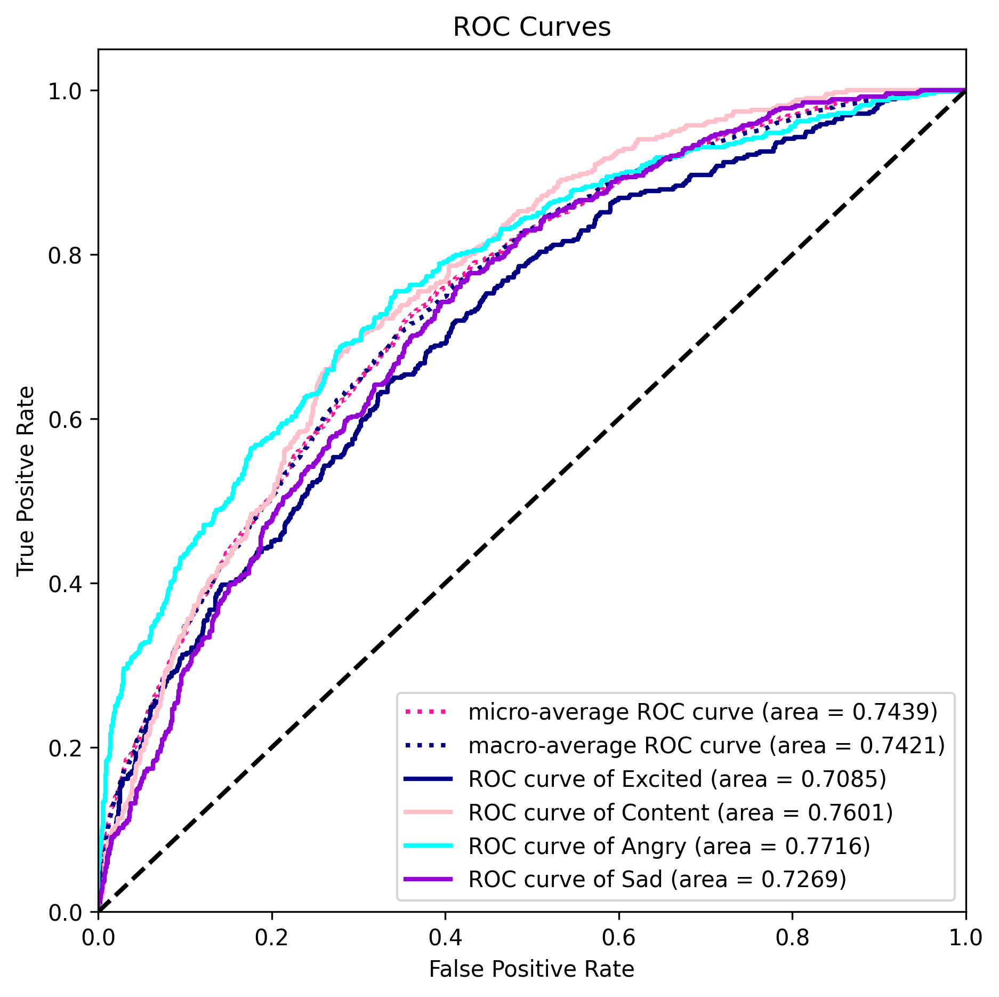

done


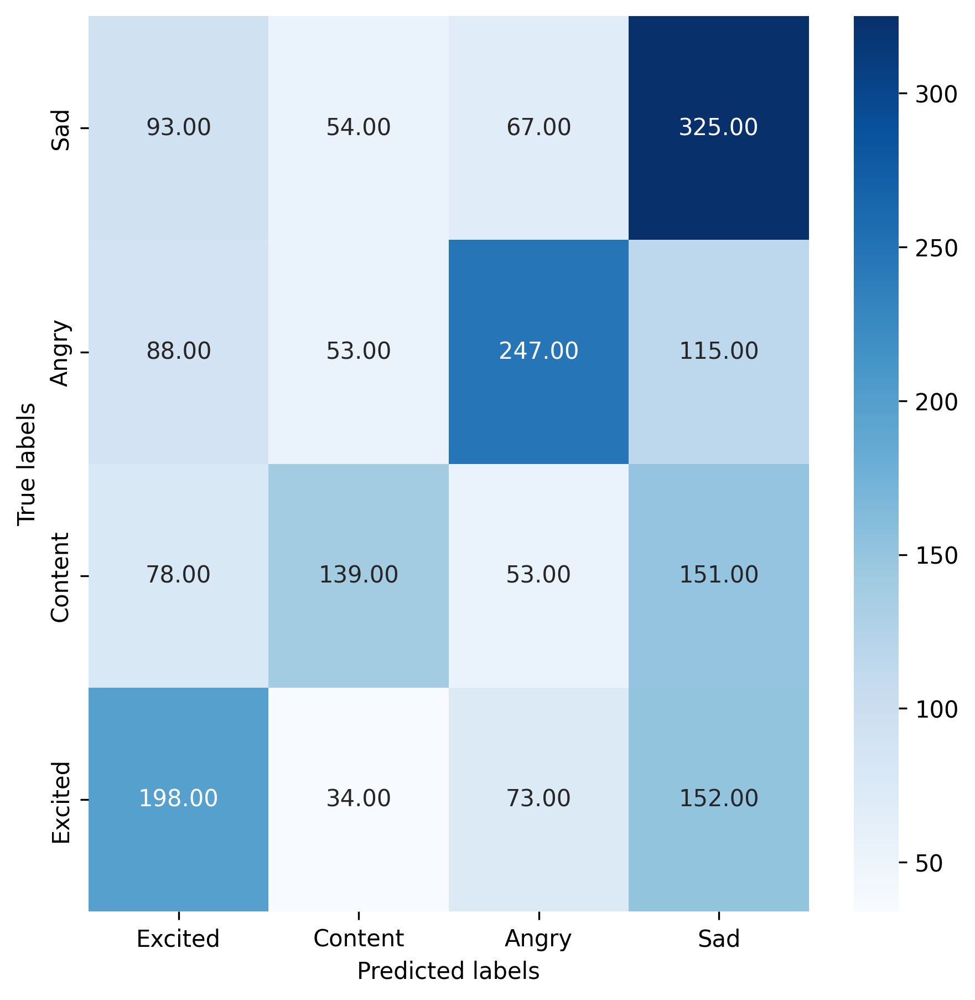

done


Model: "functional_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_22 (InputLayer)     │ (None, 32, 512, 1)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 32, 511, 25)    │            75 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 1, 511, 25)     │        20,025 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_66          │ (None, 1, 511, 25)     │           100 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_44 (Activation)      │ (None, 1, 511, 25)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 1, 255, 25)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_86 (Dropout)            │ (None, 1, 255, 25)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 1, 254, 50)     │         2,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_67          │ (None, 1, 254, 50)     │           200 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_45 (Activation)      │ (None, 1, 254, 50)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 1, 127, 50)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_87 (Dropout)            │ (None, 1, 127, 50)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 1, 126, 100)    │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_68          │ (None, 1, 126, 100)    │           400 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_46 (Activation)      │ (None, 1, 126, 100)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 1, 63, 100)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_88 (Dropout)            │ (None, 1, 63, 100)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 1, 59, 200)     │       100,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_69          │ (None, 1, 59, 200)     │           800 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_47 (Activation)      │ (None, 1, 59, 200)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 1, 29, 200)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_89 (Dropout)            │ (None, 1, 29, 200)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 5800)           │             

 Total params: 471,464 (1.80 MB)

 Trainable params: 156,904 (612.91 KB)

 Non-trainable params: 750 (2.93 KB)

 Optimizer params: 313,810 (1.20 MB)

[0.47343748807907104]
Accuracy: 47.34% (+/- 0.00%)
deepconvnet Train End.


In [12]:
import logging
deepconvnet_logger = logging.getLogger('deepconvnet_logger')
deepconvnet_logger.setLevel(logging.INFO)
file_handler = logging.FileHandler('logs/deepconvnet.log')
deepconvnet_logger.addHandler(file_handler)

import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []

# Load data
data = np.load('data_processed/train_data.npy')
labels = np.load('data_processed/train_labels.npy')
labels = np.argmax(labels, axis=1)
# Convert labels to categorical one-hot encoding
labels = to_categorical(labels)

train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size = 0.1, random_state=42)

early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)

checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_deepconvnet.weights.h5', 
                             monitor='val_accuracy', verbose=1, save_best_only=True, 
                             mode='max', save_weights_only=True)

model = DeepConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

hist = model.fit(train_data, train_labels, epochs=200,
                 batch_size=128,
                 validation_data=(test_data, test_labels),
                 callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])

cv_scores.append(max(list(hist.history['val_accuracy'])))

model_best = DeepConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
model_best.load_weights(f'model/model_best_within_deepconvnet.weights.h5')

pred = model_best.predict(test_data)

plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                  colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                  file=f'picture/roc_within_deepconvnet.jpg',dpi=300)

plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                     ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                     file=f'picture/hm_within_deepconvnet.jpg',dpi=300)
deepconvnet_logger.info(f"Training Epochs Accuracy: {list(hist.history['val_accuracy'])}")

model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
deepconvnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('deepconvnet Train End.')


## EEGNET

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Epoch 1: val_accuracy improved from -inf to 0.37396, saving model to model/model_best_within_eegnet.weights.h5

Epoch 2: val_accuracy improved from 0.37396 to 0.40052, saving model to model/model_best_within_eegnet.weights.h5

Epoch 3: val_accuracy improved from 0.40052 to 0.42917, saving model to model/model_best_within_eegnet.weights.h5

Epoch 4: val_accuracy improved from 0.42917 to 0.44688, saving model to model/model_best_within_eegnet.weights.h5

Epoch 5: val_accuracy did not improve from 0.44688

Epoch 6: val_accuracy did not improve from 0.44688

Epoch 7: val_accuracy improved from 0.44688 to 0.45260, saving model to model/model_best_within_eegnet.weights.h5

Epoch 8: val_accuracy did not improve from 0.45260

Epoch 9: val_accuracy improved from 0.45260 to 0.47240, saving model to model/model_best_within_eegnet.weights.h5

Epoch 10: val_accuracy did not improve from 0.47240

Epoch 11: val_accuracy did not improve from 0.47240

Epoch 12: val_accuracy did not improve from 0.4724

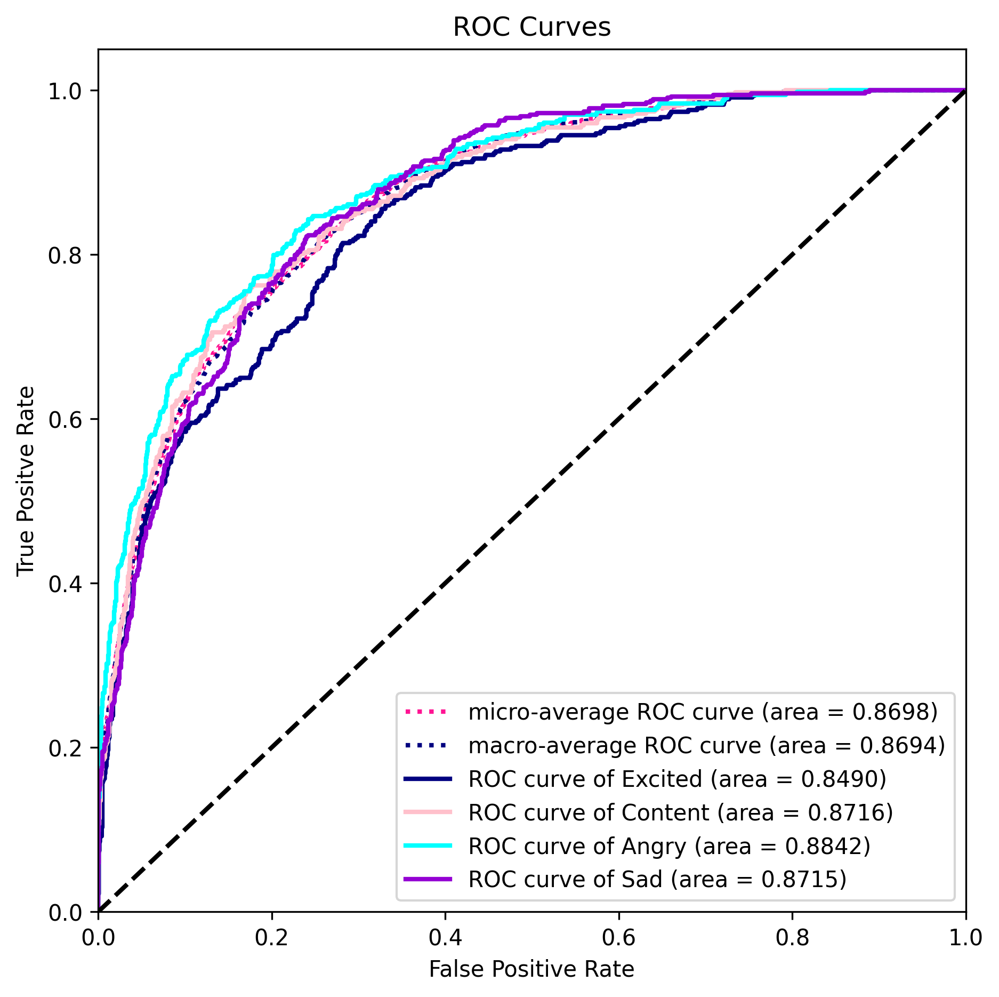

done


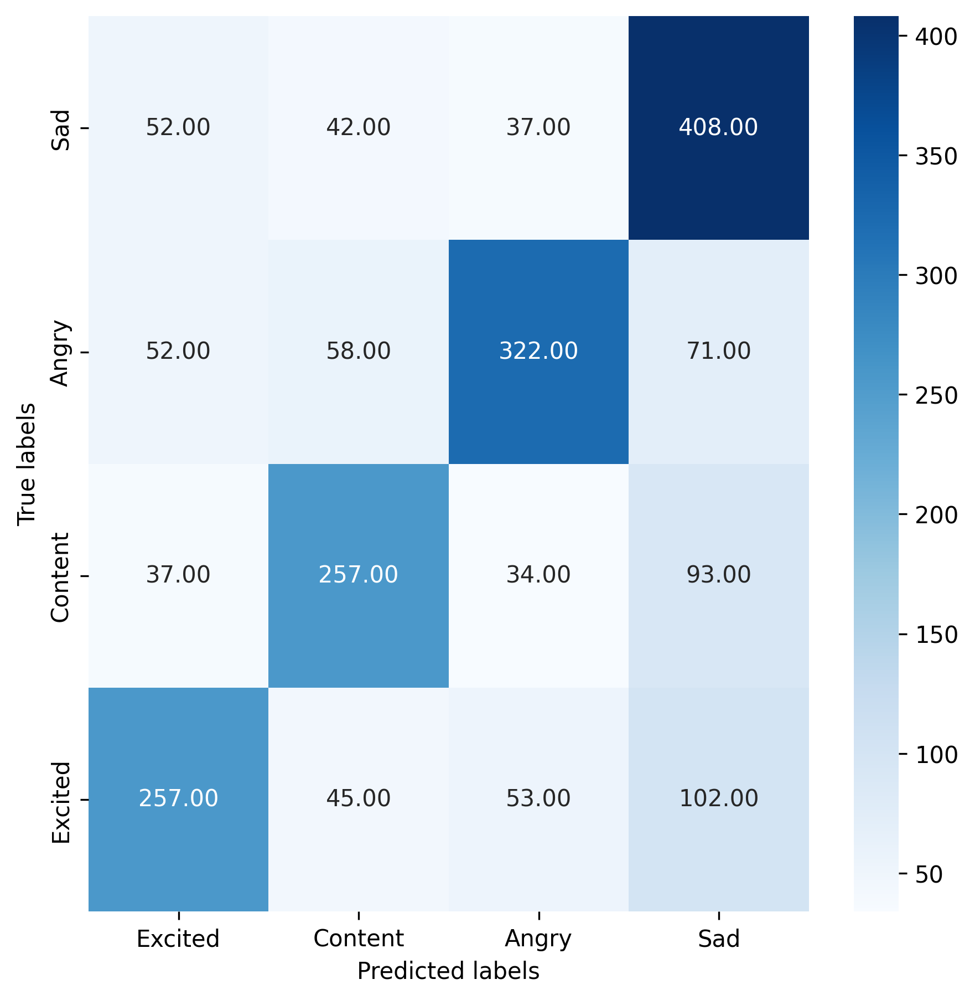

done


Model: "functional_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_24 (InputLayer)     │ (None, 32, 512, 1)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_32 (Conv2D)              │ (None, 32, 512, 8)     │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_74          │ (None, 32, 512, 8)     │            32 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ depthwise_conv2d_22             │ (None, 1, 512, 32)     │         1,024 │
│ (DepthwiseConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_75          │ (None, 1, 512, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_54 (Activation)      │ (None, 1, 512, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_22            │ (None, 1, 128, 32)     │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_94 (Dropout)            │ (None, 1, 128, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_22             │ (None, 1, 128, 32)     │         1,536 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_76          │ (None, 1, 128, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_55 (Activation)      │ (None, 1, 128, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_23            │ (None, 1, 16, 32)      │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_95 (Dropout)            │ (None, 1, 16, 32)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4)              │         2,052 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax (Activation)            │ (None, 4)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,950 (62.31 KB)

 Trainable params: 5,268 (20.58 KB)

 Non-trainable params: 144 (576.00 B)

 Optimizer params: 10,538 (41.17 KB)

[0.6479166746139526]
Accuracy: 64.79% (+/- 0.00%)
EEGNet Train End.


In [14]:
import logging
eegnet_logger = logging.getLogger('eegnet_logger')
eegnet_logger.setLevel(logging.INFO)
file_handler = logging.FileHandler('logs/eegnet.log')
eegnet_logger.addHandler(file_handler)

import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []

# Load data
data = np.load('data_processed/train_data.npy')
labels = np.load('data_processed/train_labels.npy')
labels = np.argmax(labels, axis=1)
# Convert labels to categorical one-hot encoding
labels = to_categorical(labels)

train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size = 0.1, random_state=42)

early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)
checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_eegnet.weights.h5', 
                             monitor='val_accuracy', verbose=1, save_best_only=True, 
                             mode='max', save_weights_only=True)

model = EEGNet(nb_classes=4, Chans=32, Samples=512, dropoutRate=0.5, kernLength=64, F1=8, D=4, F2=32)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

hist = model.fit(train_data, train_labels, epochs=200,
                 batch_size=128,
                 validation_data=(test_data, test_labels),
                 callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()], verbose=0)

cv_scores.append(max(list(hist.history['val_accuracy'])))


model_best = EEGNet(nb_classes=4, Chans=32, Samples=512, dropoutRate=0.5, kernLength=64, F1=8, D=4, F2=32)
model_best.load_weights(f'model/model_best_within_eegnet.weights.h5')
pred = model_best.predict(test_data)

plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                  colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                  file=f'picture/roc_within_eegnet.jpg',dpi=300)

plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                     ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                     file=f'picture/hm_within_eegnet.jpg',dpi=300)
eegnet_logger.info(f"Training Epochs Accuracy: {list(hist.history['val_accuracy'])}")

model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
eegnet_logger.info(cv_scores)
eegnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('EEGNet Train End.')


## SHALLOWCONVNET

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
134/135 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.2921 - loss: 2.7788
Epoch 1: val_accuracy improved from -inf to 0.38125, saving model to model/model_best_within_shallowconvnet.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.2924 - loss: 2.7670 - val_accuracy: 0.3812 - val_loss: 1.4709 - learning_rate: 0.0010
Epoch 2/200
135/135 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.3849 - loss: 1.4444
Epoch 2: val_accuracy improved from 0.38125 to 0.39010, saving model to model/model_best_within_shallowconvnet.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - accuracy: 0.3849 - loss: 1.4445 - val_accuracy: 0.3901 - val_loss: 1.4362 - learning_rate: 0.0010
Epoch 3/200
133/135 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.4149 - loss: 1.3742
Epoch 3: val_accuracy improved from 0.39010 to 0.41510, saving model to model/model_best_within_shallowconvnet.weights.h5
135/135 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - accuracy: 0.4147 - loss: 1.3744 - val_accurac

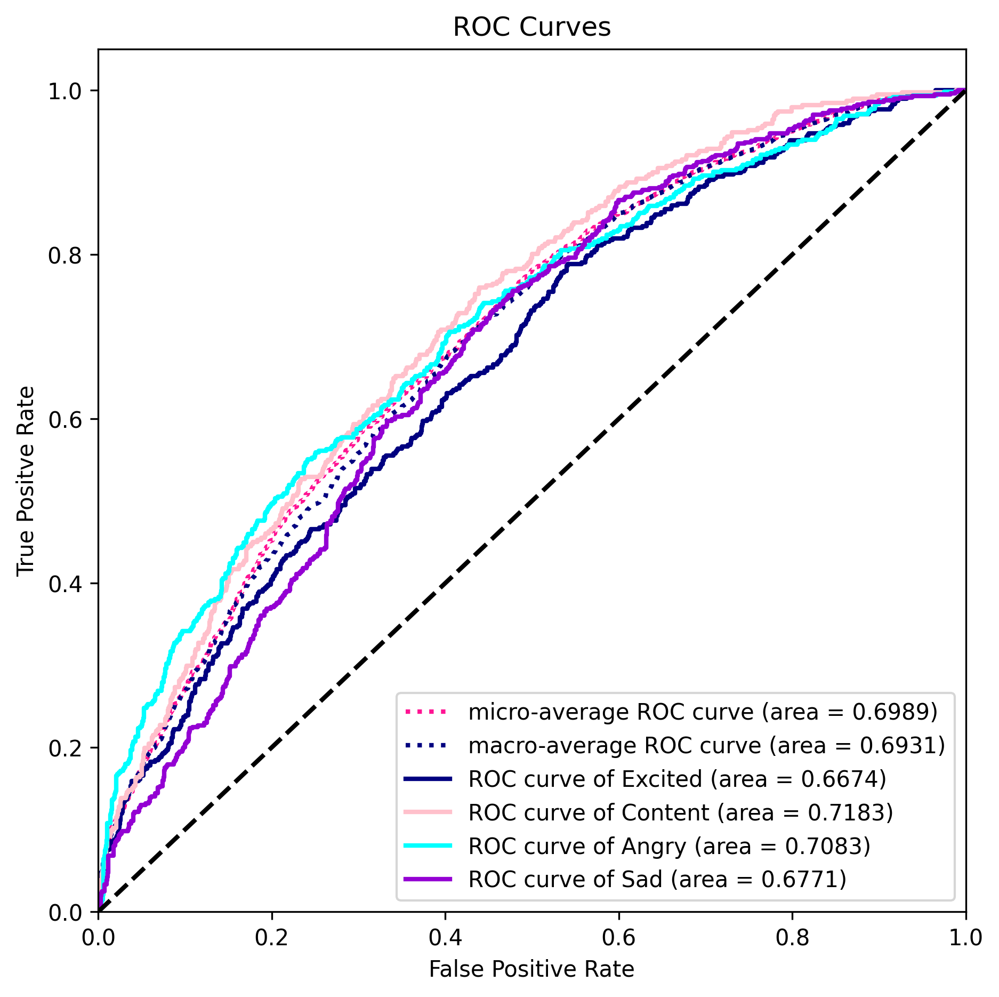

done


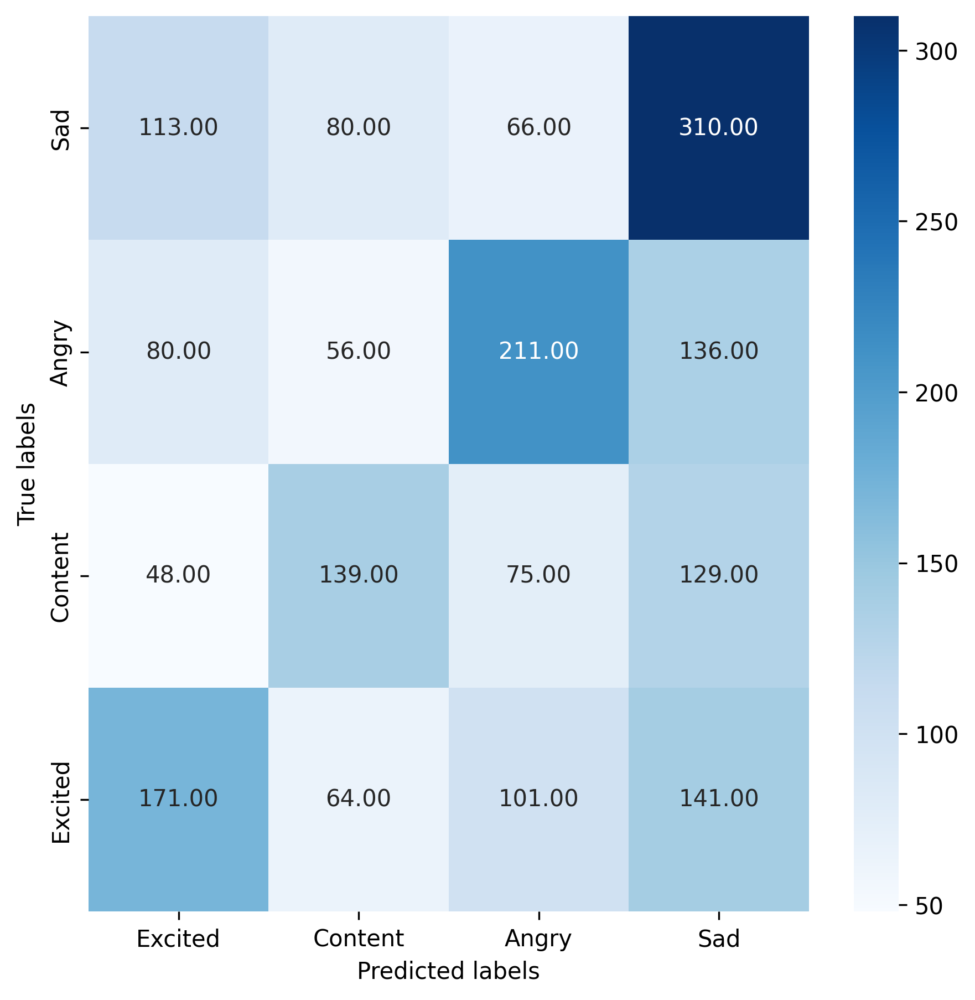

done


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 32, 512, 1)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 500, 40)    │           560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 1, 500, 40)     │        51,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1, 500, 40)     │           160 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_6 (Activation)       │ (None, 1, 500, 40)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_2             │ (None, 1, 165, 40)     │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_7 (Activation)       │ (None, 1, 165, 40)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1, 165, 40)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 6600)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │        26,404 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_8 (Activation)       │ (None, 4)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 234,814 (917.25 KB)

 Trainable params: 78,244 (305.64 KB)

 Non-trainable params: 80 (320.00 B)

 Optimizer params: 156,490 (611.29 KB)

[0.43281251192092896]
Accuracy: 43.28% (+/- 0.00%)
shallowconvnet Train End.


In [10]:
import logging
shallowconvnet_logger = logging.getLogger('shallowconvnet_logger')
shallowconvnet_logger.setLevel(logging.INFO)
file_handler = logging.FileHandler('logs/shallowconvnet.log')
shallowconvnet_logger.addHandler(file_handler)

import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []

data = np.load('data_processed/train_data.npy')
labels = np.load('data_processed/train_labels.npy')
labels = np.argmax(labels, axis=1)
# Convert labels to categorical one-hot encoding
labels = to_categorical(labels)

train_data, test_data, train_labels, test_labels = train_test_split(data, labels, test_size = 0.1, random_state=42)

early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)
checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_shallowconvnet.weights.h5', 
                             monitor='val_accuracy', verbose=1, save_best_only=True, 
                             mode='max', save_weights_only=True)

model = ShallowConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

hist = model.fit(train_data, train_labels, epochs=200,
                 batch_size=128,
                 validation_data=(test_data, test_labels),
                 callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])

cv_scores.append(max(list(hist.history['val_accuracy'])))


model_best = ShallowConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
model_best.load_weights(f'model/model_best_within_shallowconvnet.weights.h5')

pred = model_best.predict(test_data)

plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                  colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                  file=f'picture/roc_within_shallowconvnet.jpg',dpi=300)

plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                     ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                     file=f'picture/hm_within_shallowconvnet.jpg',dpi=300)
shallowconvnet_logger.info(f"Training Epochs Accuracy: {list(hist.history['val_accuracy'])}")


model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
shallowconvnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('shallowconvnet Train End.')


# Subject Independent Testing

In [ ]:
import _pickle as cPickle
import os
from tensorflow.keras.utils import to_categorical
import numpy as np

# # Define the path to the preprocessed folder
preprocessed_folder = '/kaggle/input/deap-dataset/PREPROCESSED/data_preprocessed_python'

def losocv_data_split(test_file):
    """
    This function collects data from all files in the preprocessed folder except the test_file.
    The test_file is left out for testing, and the rest are used for training.
    
    Parameters:
    - preprocessed_folder: path to the folder containing preprocessed data files
    - test_file: the file to leave out for testing
    
    Returns:
    - train_data, train_labels: training data and labels from the other files
    - test_data, test_labels: test data and labels from the specified test_file
    """

    train_data = []
    train_labels = []
    test_data = []
    test_labels = []
    
    # Iterate through the files in the preprocessed folder
    for filename in os.listdir(preprocessed_folder):
        if filename.endswith('.dat'):
            # Load the data from the file
            filepath = os.path.join(preprocessed_folder, filename)
            dat = cPickle.load(open(filepath, 'rb'), encoding='latin1')

            if filename == test_file:
                # If this is the test file, store its data separately
                test_data = np.array(dat['data'])
                test_data = test_data[:, :32]  # Keep only the first 32 channels (if needed)
                test_data = test_data.reshape(test_data.shape[0], test_data.shape[1], test_data.shape[2], 1)
                
                test_labels = np.array(dat['labels'])
            else:
                # Otherwise, append to the training data
                for sample in dat['data']:
                    train_data.append(sample)
                for label in dat['labels']:
                    train_labels.append(label)

    # Convert the lists to numpy arrays for test data
    train_data = np.array(train_data)
    train_data = train_data[:, :32]  # Keep only the first 32 channels (if needed)
    train_data = train_data.reshape(train_data.shape[0], train_data.shape[1], train_data.shape[2], 1)
    
    train_labels = np.array(train_labels)
    train_labels = np.argmax(train_labels, axis=1)
    # Convert labels to categorical one-hot encoding
    train_labels = to_categorical(train_labels)
    
    train_data, train_labels = segment_data(train_data, train_labels)
    train_labels = np.array(train_labels)
    train_data = np.array(train_data)
    
    # Shuffle the training data
    num_samples = train_data.shape[0]
    shuffled_indices = np.random.permutation(num_samples)
    train_data = train_data[shuffled_indices]
    train_labels = train_labels[shuffled_indices]
    
    # Convert the lists to numpy arrays for testing data
    test_data = np.array(test_data)
    test_data = test_data[:, :32]  # Keep only the first 32 channels (if needed)
    test_data = test_data.reshape(test_data.shape[0], test_data.shape[1], test_data.shape[2], 1)
    
    test_labels = np.array(test_labels)
    test_labels = np.argmax(test_labels, axis=1)
    # Convert labels to categorical one-hot encoding
    test_labels = to_categorical(test_labels)
    
    test_data, test_labels = segment_data(test_data, test_labels)
    test_data = np.array(test_data)
    test_labels = np.array(test_labels)

    return train_data, train_labels, test_data, test_labels

test_file = 's01.dat'  # Specify the file to leave out for testing

train_data, train_labels, test_data, test_labels = losocv_data_split(test_file)

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200


I0000 00:00:1729566444.479980     110 service.cc:145] XLA service 0x79ed9c048360 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1729566444.480031     110 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  3/146 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - accuracy: 0.2591 - loss: 1.6134  

I0000 00:00:1729566454.744330     110 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.2790 - loss: 1.4261
Epoch 1: val_accuracy improved from -inf to 0.30000, saving model to model/subject_independent_model_best_within_t1_0.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - accuracy: 0.2792 - loss: 1.4259 - val_accuracy: 0.3000 - val_loss: 1.4755 - learning_rate: 0.0010
Epoch 2/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3707 - loss: 1.3273
Epoch 2: val_accuracy did not improve from 0.30000
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3708 - loss: 1.3272 - val_accuracy: 0.0517 - val_loss: 1.5491 - learning_rate: 0.0010
Epoch 3/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.3888 - loss: 1.2959
Epoch 3: val_accuracy did not improve from 0.30000
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3888 - loss: 1.2959 - val_accuracy: 0.0950 - val_loss: 1.5419 - learning_rate: 0.0010
Epoch 4/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.4083 - loss: 1.2734
E

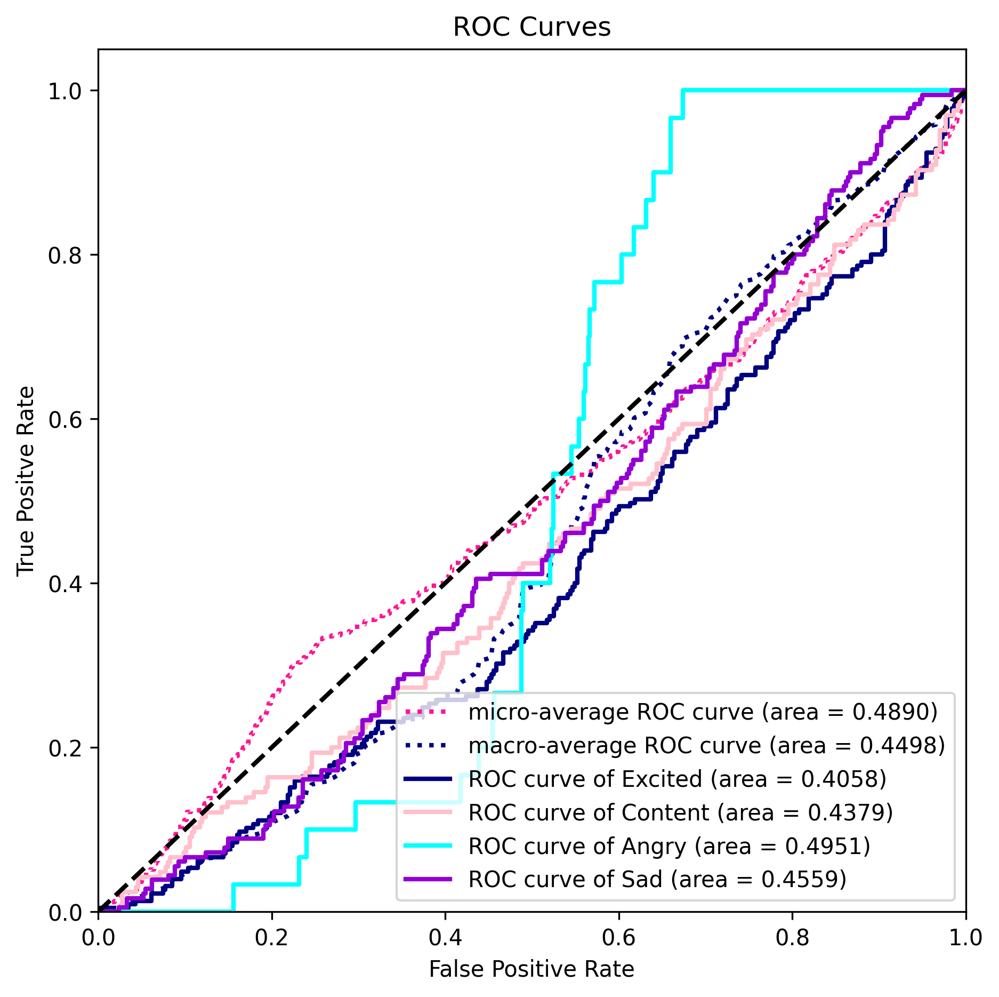

done


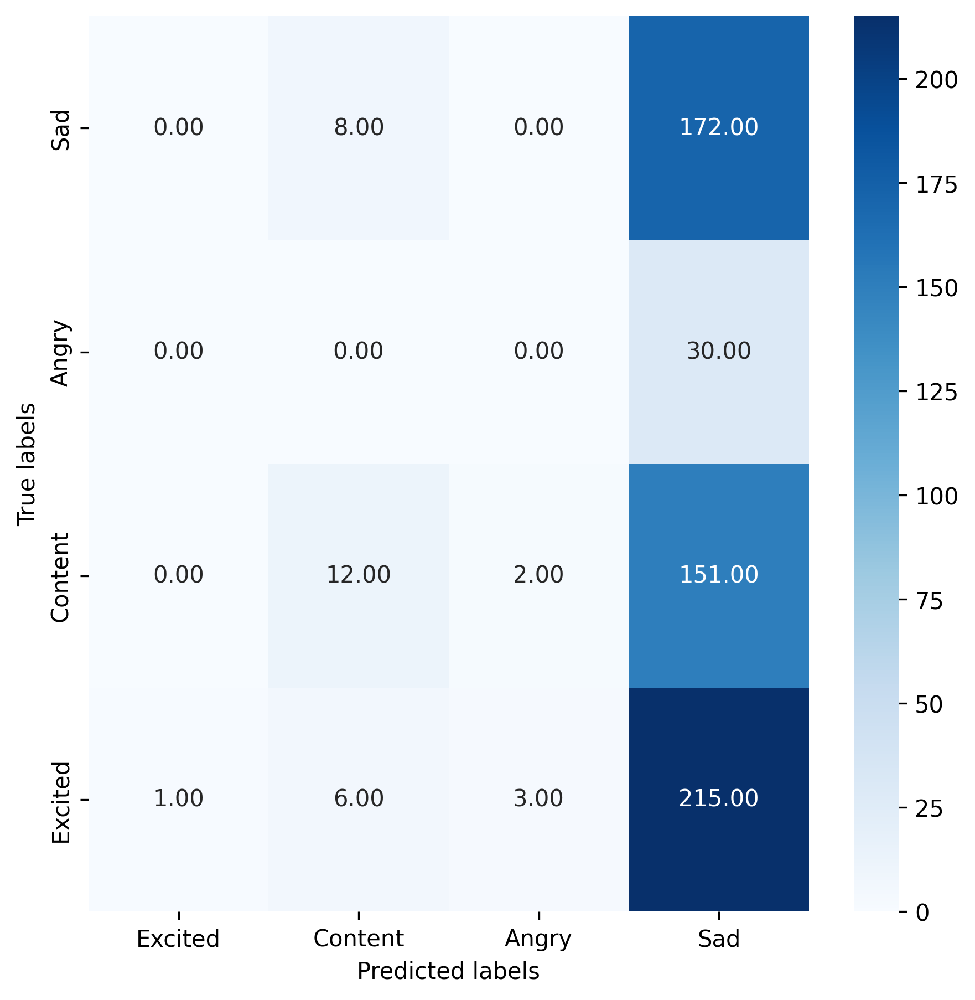

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.2836 - loss: 1.4341
Epoch 1: val_accuracy improved from -inf to 0.33000, saving model to model/subject_independent_model_best_within_t1_1.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - accuracy: 0.2838 - loss: 1.4337 - val_accuracy: 0.3300 - val_loss: 1.3762 - learning_rate: 0.0010
Epoch 2/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3864 - loss: 1.3156
Epoch 2: val_accuracy did not improve from 0.33000
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3864 - loss: 1.3155 - val_accuracy: 0.1967 - val_loss: 1.4128 - learning_rate: 0.0010
Epoch 3/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4014 - loss: 1.2773
Epoch 3: val_accuracy did not improve from 0.33000
146/146 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - accuracy: 0.4013 - loss: 1.2773 - val_accuracy: 0.1433 - val_loss: 1.4469 - learning_rate: 0.0010
Epoch 4/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4104 - lo

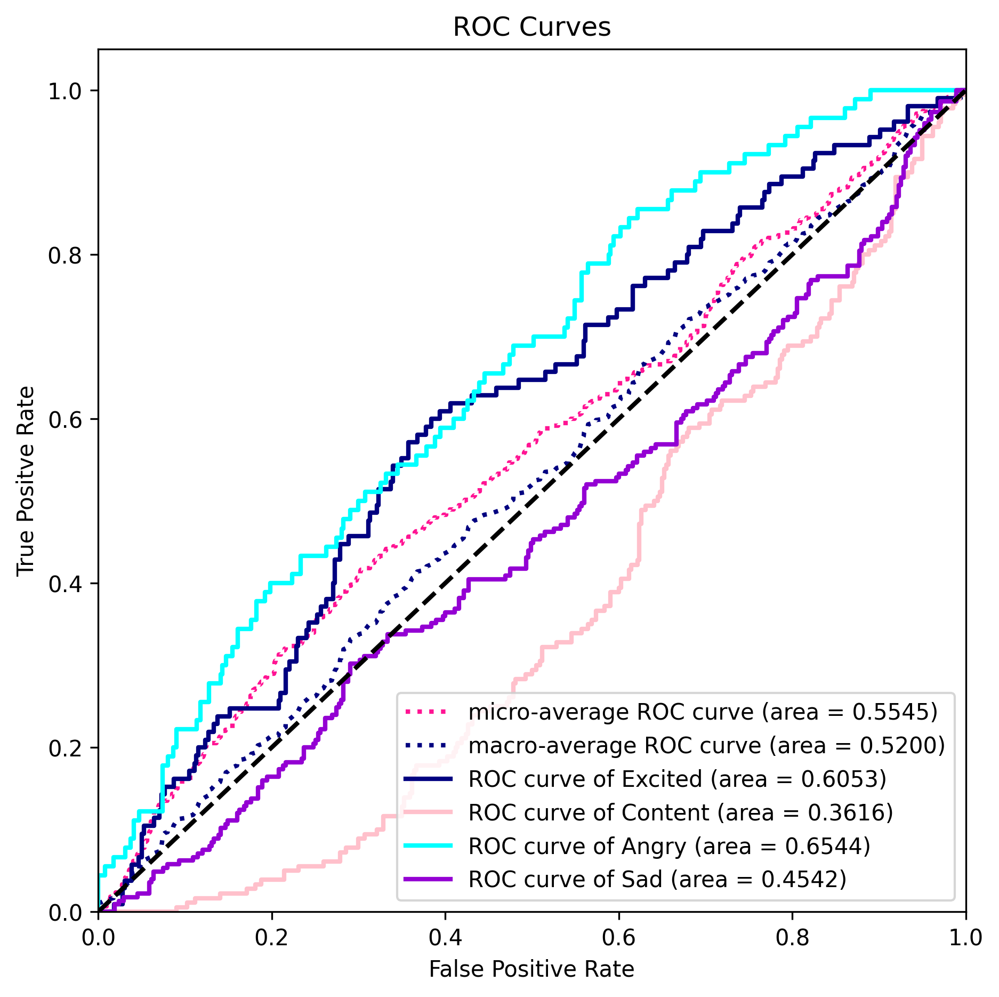

done


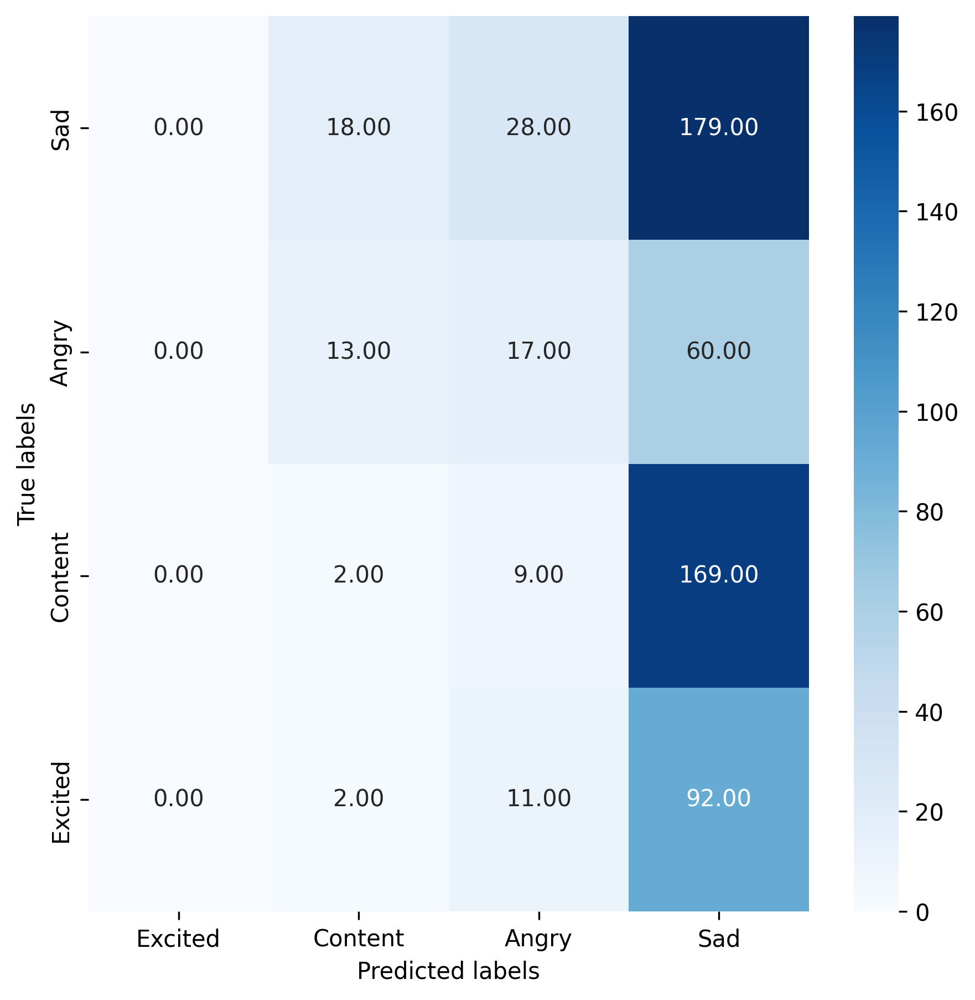

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.2925 - loss: 1.4147
Epoch 1: val_accuracy improved from -inf to 0.07500, saving model to model/subject_independent_model_best_within_t1_2.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - accuracy: 0.2927 - loss: 1.4144 - val_accuracy: 0.0750 - val_loss: 1.5015 - learning_rate: 0.0010
Epoch 2/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3671 - loss: 1.3202
Epoch 2: val_accuracy improved from 0.07500 to 0.39000, saving model to model/subject_independent_model_best_within_t1_2.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3672 - loss: 1.3201 - val_accuracy: 0.3900 - val_loss: 1.3880 - learning_rate: 0.0010
Epoch 3/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3922 - loss: 1.2906
Epoch 3: val_accuracy did not improve from 0.39000
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - accuracy: 0.3922 - loss: 1.2905 - val_accuracy: 0.2017 - val_loss: 1.7501 - learning_rate: 0.00

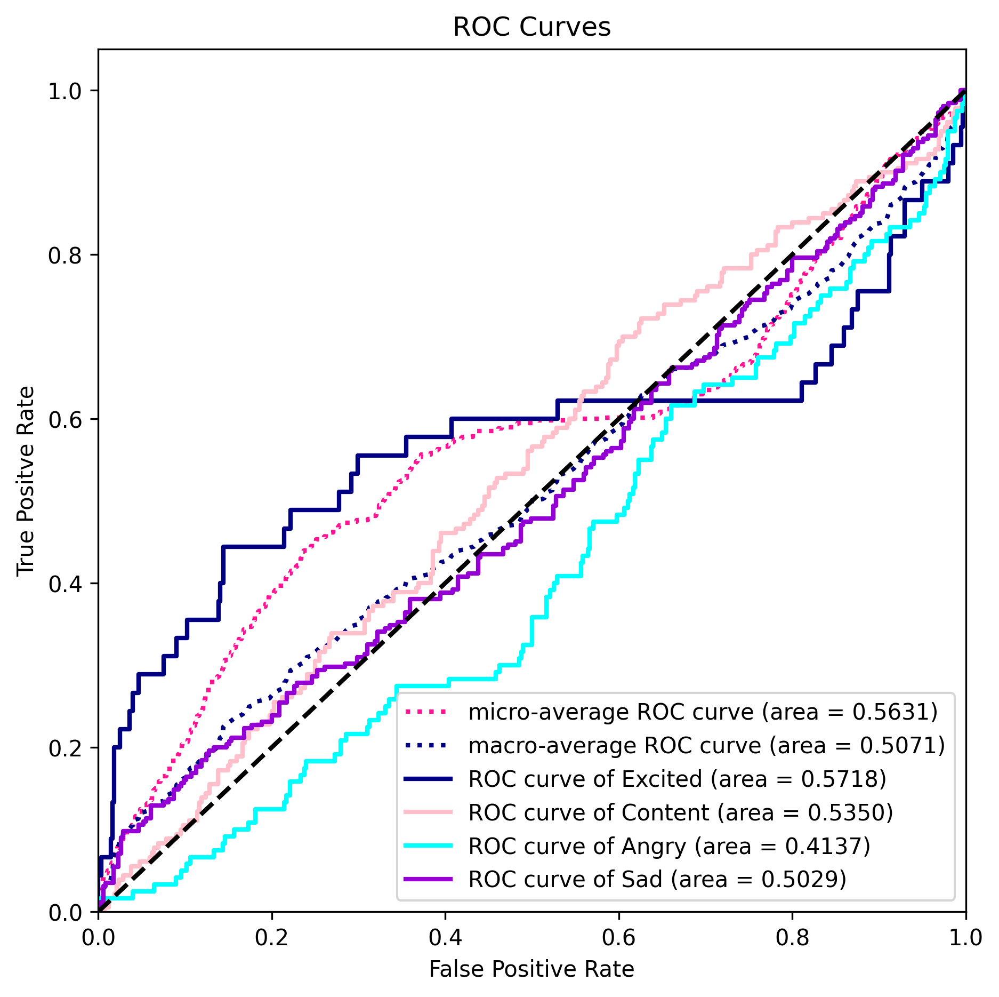

done


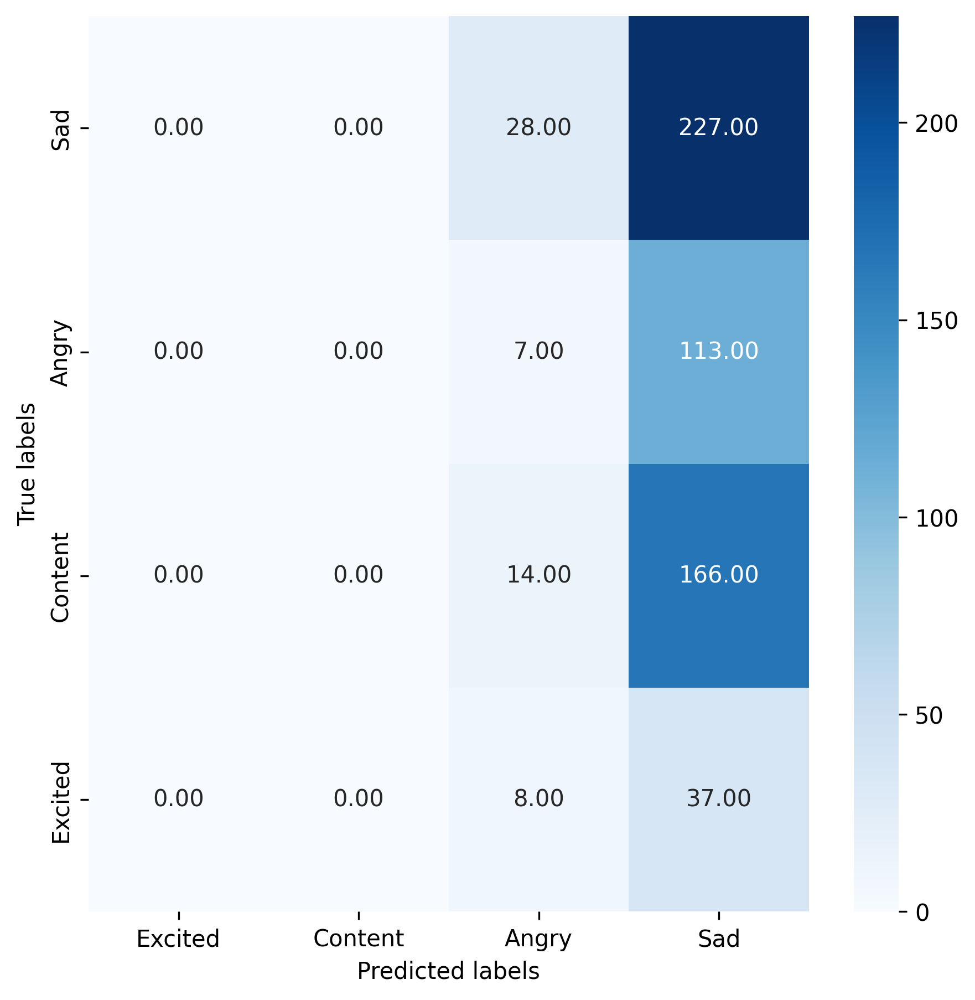

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3103 - loss: 1.4000
Epoch 1: val_accuracy improved from -inf to 0.32500, saving model to model/subject_independent_model_best_within_t1_3.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.3104 - loss: 1.3997 - val_accuracy: 0.3250 - val_loss: 1.4200 - learning_rate: 0.0010
Epoch 2/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3694 - loss: 1.3223
Epoch 2: val_accuracy improved from 0.32500 to 0.35000, saving model to model/subject_independent_model_best_within_t1_3.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3694 - loss: 1.3222 - val_accuracy: 0.3500 - val_loss: 1.3772 - learning_rate: 0.0010
Epoch 3/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3853 - loss: 1.2923
Epoch 3: val_accuracy improved from 0.35000 to 0.38333, saving model to model/subject_independent_model_best_within_t1_3.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.38

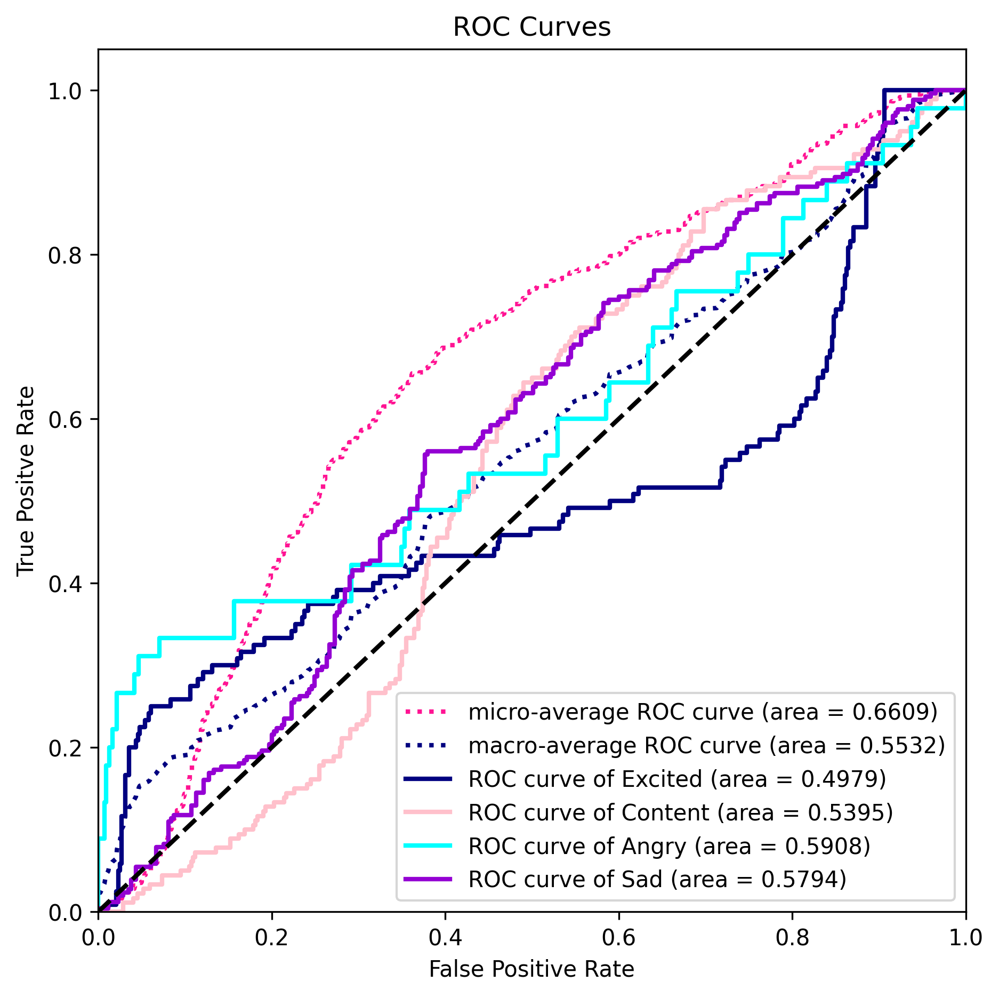

done


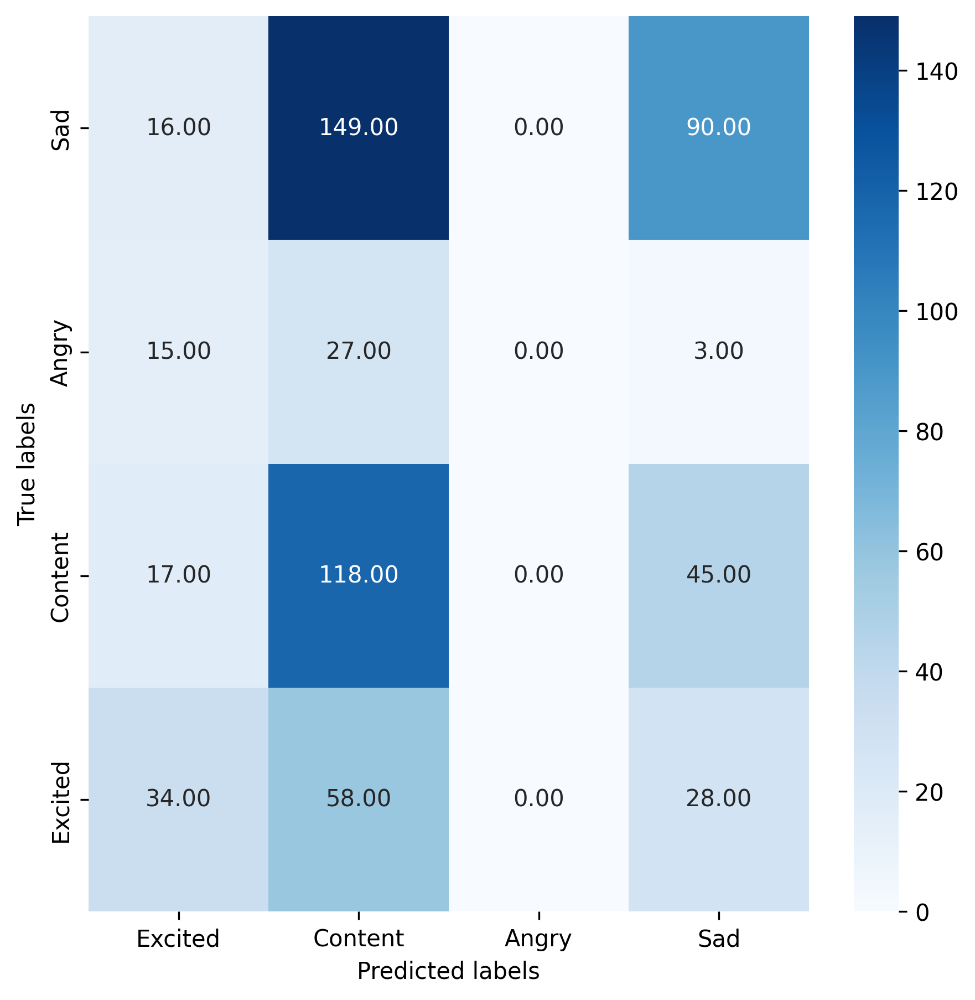

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.2839 - loss: 1.4324
Epoch 1: val_accuracy improved from -inf to 0.31167, saving model to model/subject_independent_model_best_within_t1_4.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - accuracy: 0.2841 - loss: 1.4321 - val_accuracy: 0.3117 - val_loss: 1.3609 - learning_rate: 0.0010
Epoch 2/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3711 - loss: 1.3264
Epoch 2: val_accuracy did not improve from 0.31167
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3711 - loss: 1.3263 - val_accuracy: 0.0250 - val_loss: 1.5851 - learning_rate: 0.0010
Epoch 3/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3834 - loss: 1.2991
Epoch 3: val_accuracy did not improve from 0.31167
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3834 - loss: 1.2991 - val_accuracy: 0.0017 - val_loss: 1.8410 - learning_rate: 0.0010
Epoch 4/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4025 - los

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1029: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


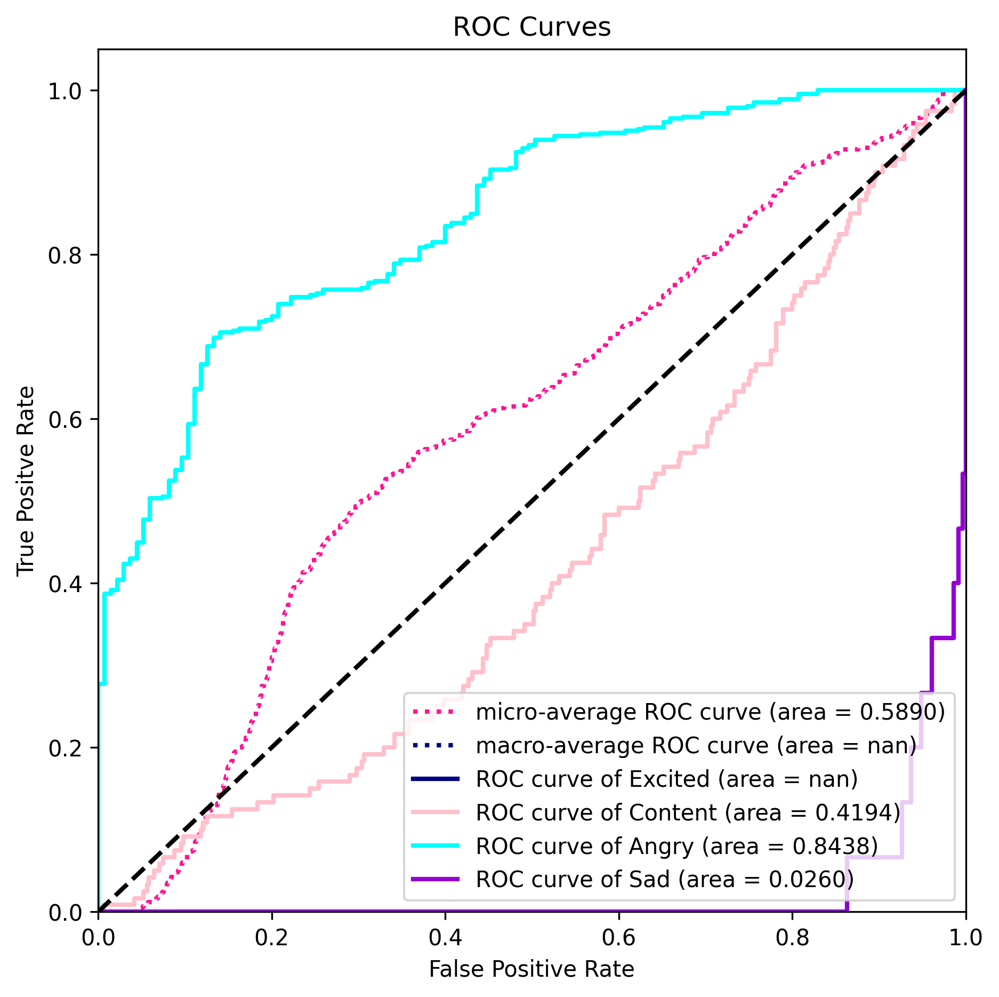

done


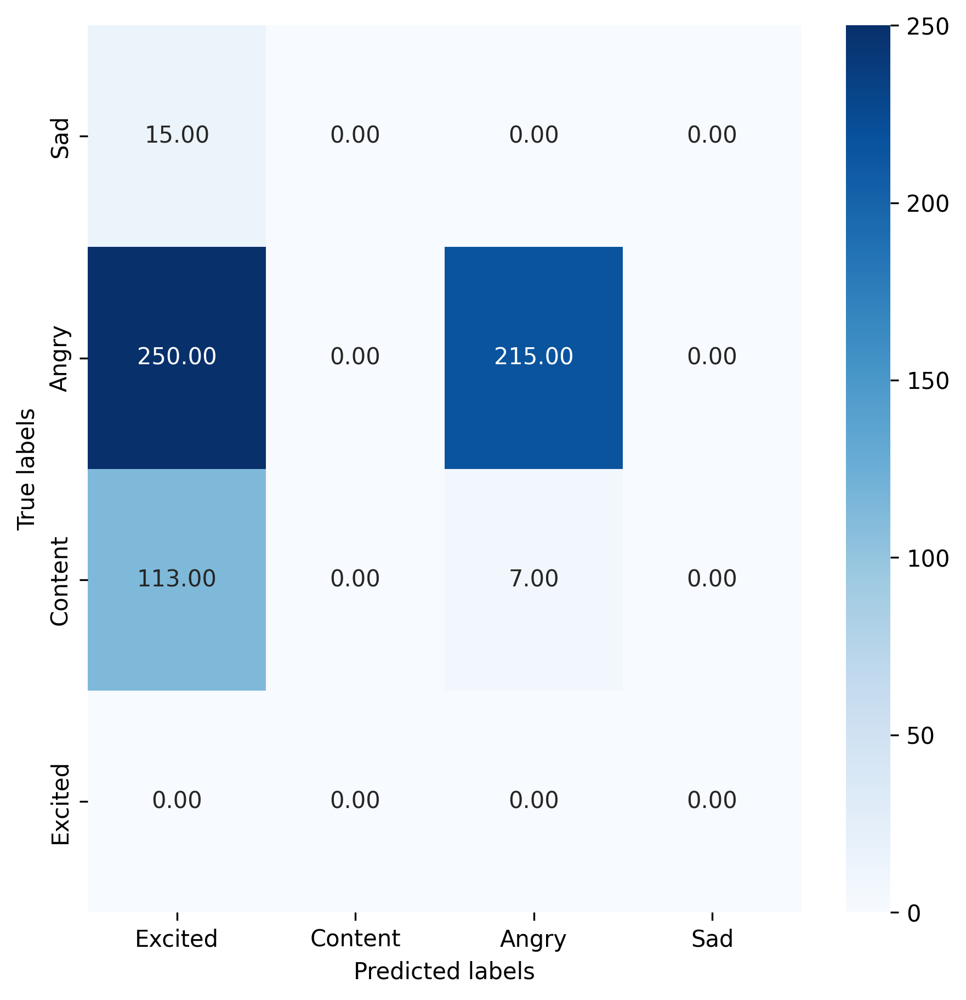

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.2895 - loss: 1.4084
Epoch 1: val_accuracy improved from -inf to 0.38000, saving model to model/subject_independent_model_best_within_t1_5.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - accuracy: 0.2897 - loss: 1.4081 - val_accuracy: 0.3800 - val_loss: 1.3960 - learning_rate: 0.0010
Epoch 2/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3824 - loss: 1.3075
Epoch 2: val_accuracy did not improve from 0.38000
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3825 - loss: 1.3074 - val_accuracy: 0.1767 - val_loss: 1.5301 - learning_rate: 0.0010
Epoch 3/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4033 - loss: 1.2820
Epoch 3: val_accuracy did not improve from 0.38000
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.4033 - loss: 1.2819 - val_accuracy: 0.1067 - val_loss: 1.7747 - learning_rate: 0.0010
Epoch 4/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4194 - los

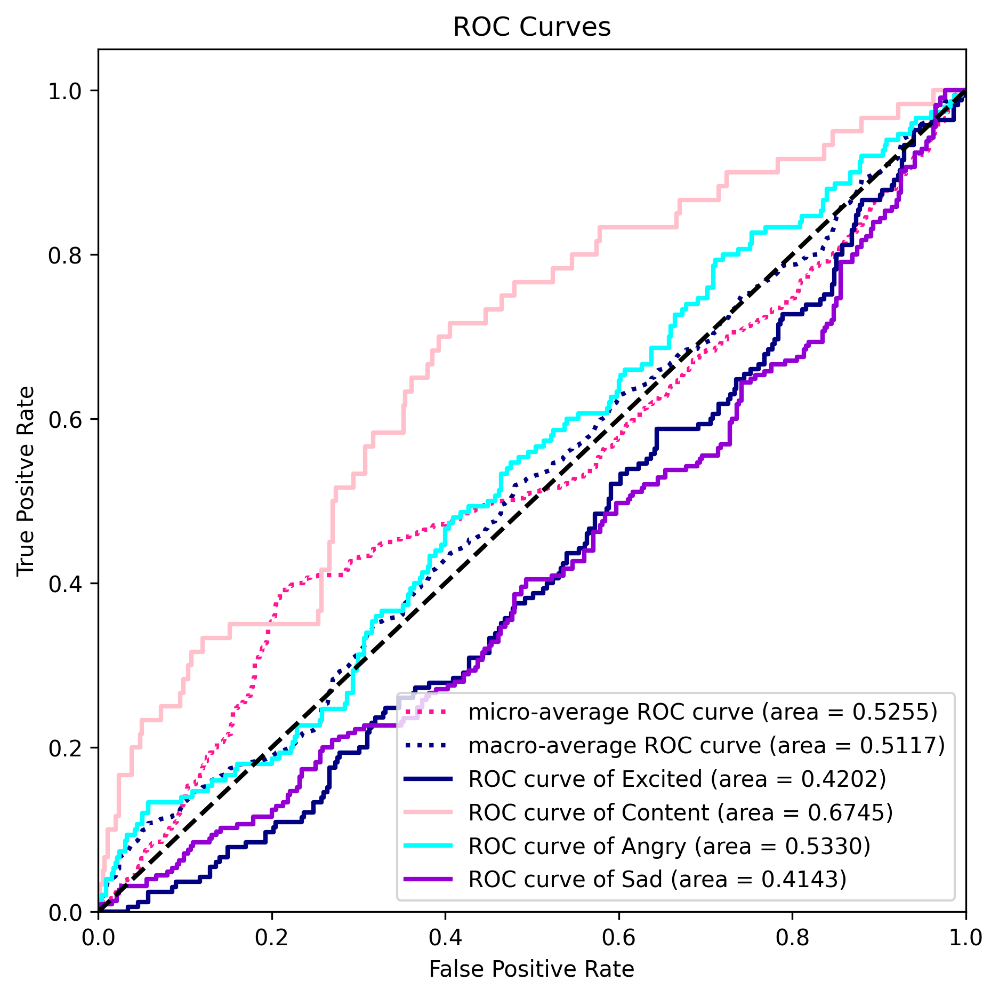

done


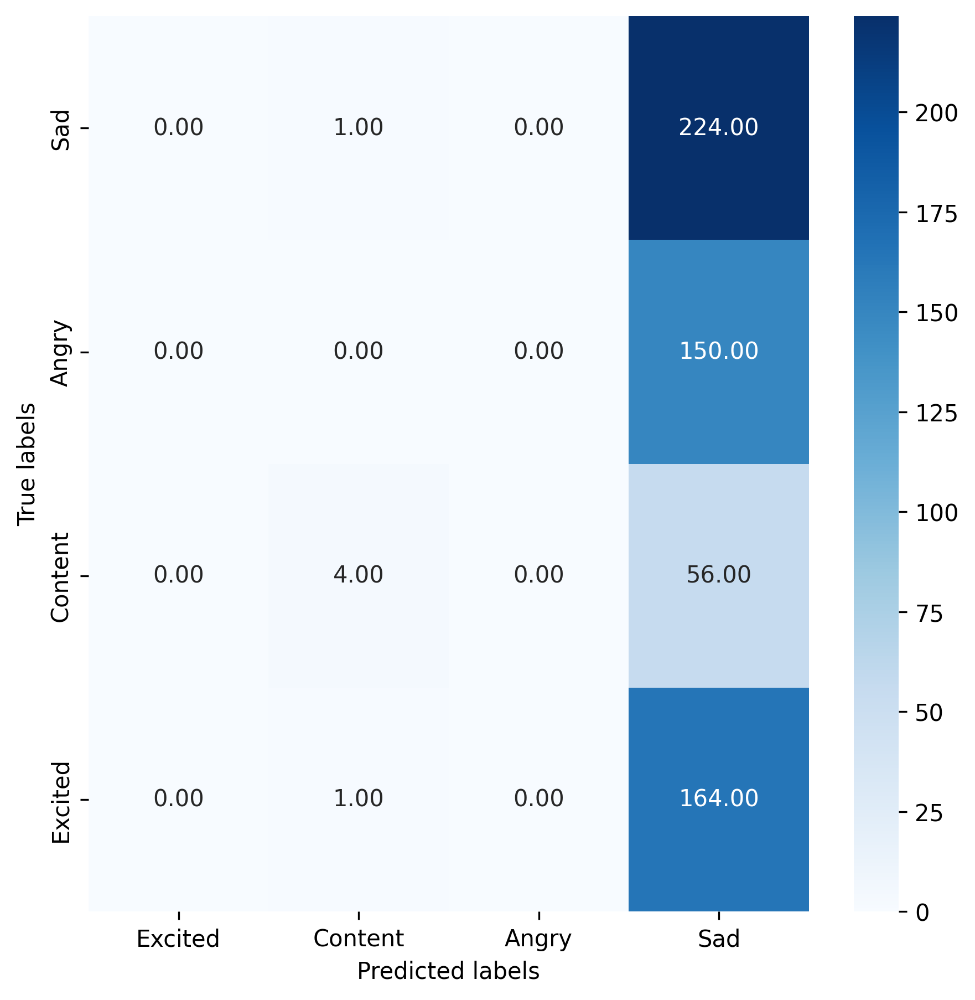

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.2886 - loss: 1.4402
Epoch 1: val_accuracy improved from -inf to 0.12833, saving model to model/subject_independent_model_best_within_t1_6.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - accuracy: 0.2888 - loss: 1.4398 - val_accuracy: 0.1283 - val_loss: 1.4530 - learning_rate: 0.0010
Epoch 2/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3859 - loss: 1.3107
Epoch 2: val_accuracy improved from 0.12833 to 0.16333, saving model to model/subject_independent_model_best_within_t1_6.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3859 - loss: 1.3106 - val_accuracy: 0.1633 - val_loss: 1.6140 - learning_rate: 0.0010
Epoch 3/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3967 - loss: 1.2853
Epoch 3: val_accuracy did not improve from 0.16333
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3967 - loss: 1.2852 - val_accuracy: 0.1467 - val_loss: 1.7624 - learning_rate: 0.00

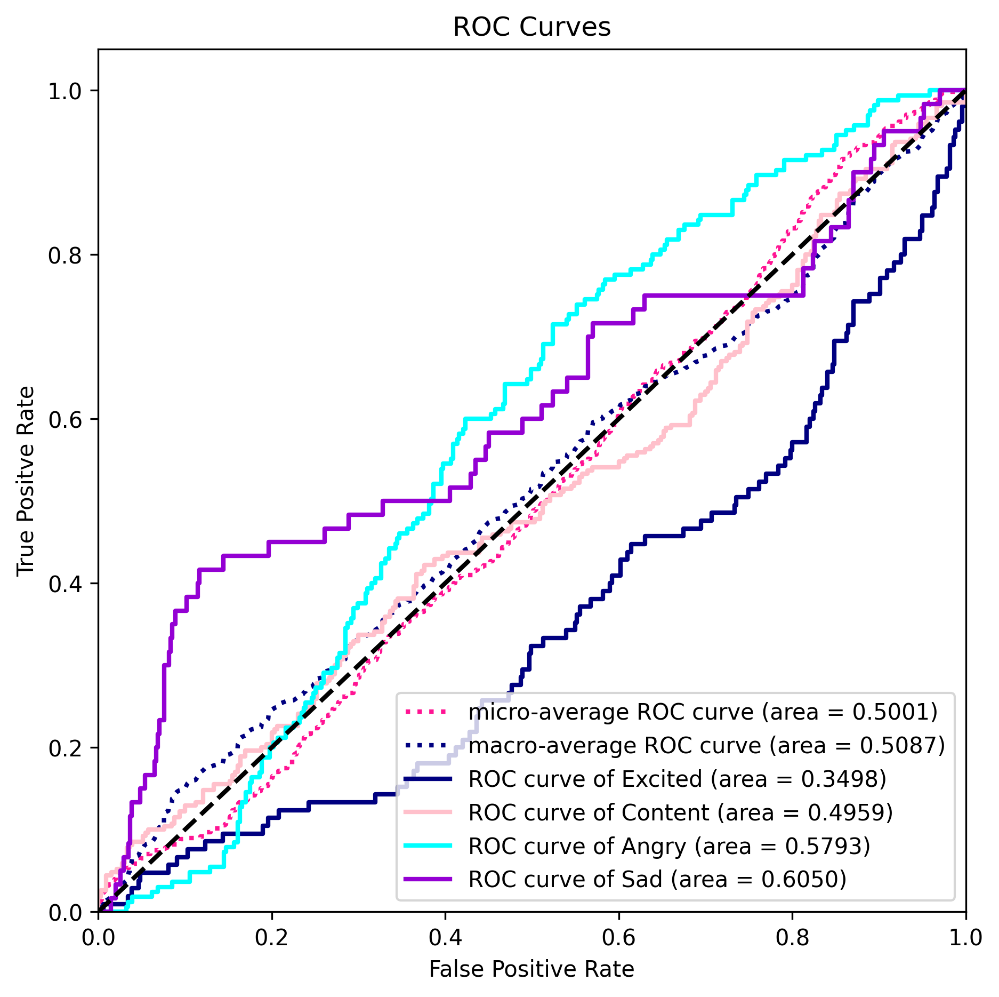

done


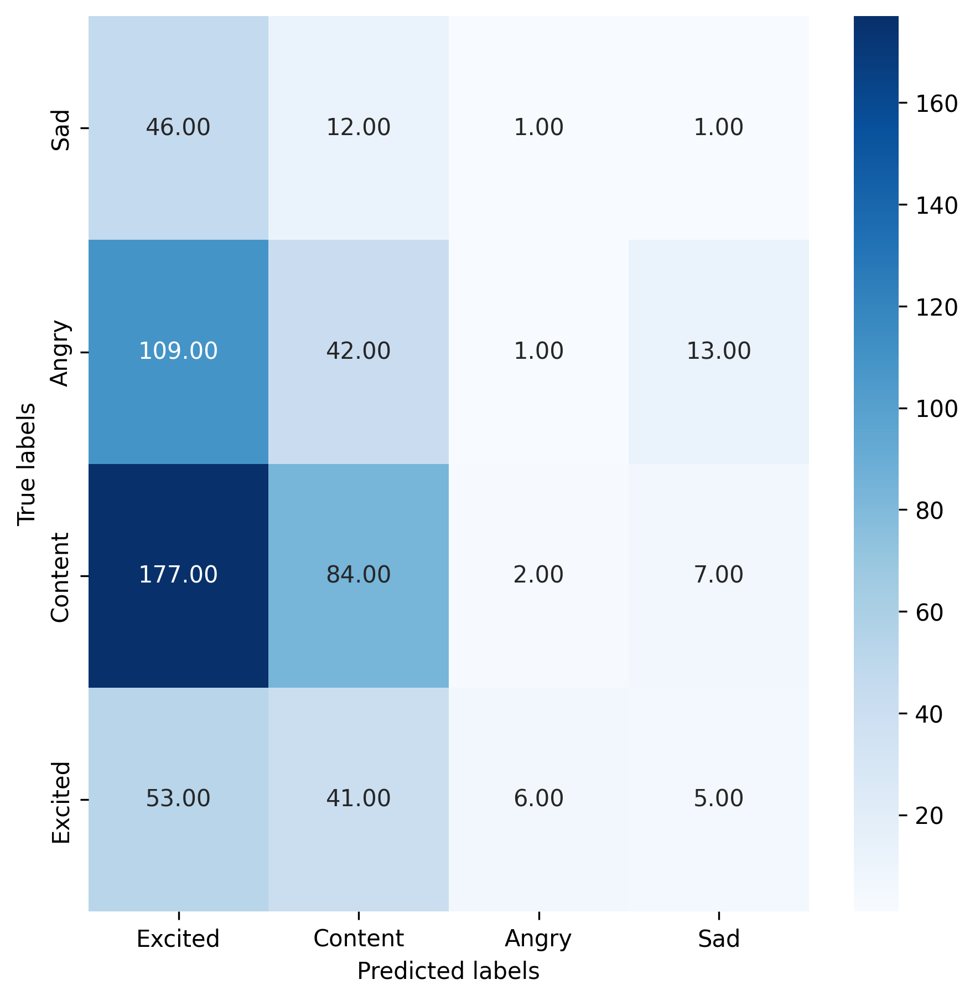

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.2960 - loss: 1.4150
Epoch 1: val_accuracy improved from -inf to 0.12500, saving model to model/subject_independent_model_best_within_t1_7.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.2962 - loss: 1.4146 - val_accuracy: 0.1250 - val_loss: 1.4860 - learning_rate: 0.0010
Epoch 2/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3861 - loss: 1.3089
Epoch 2: val_accuracy did not improve from 0.12500
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3861 - loss: 1.3089 - val_accuracy: 0.1250 - val_loss: 1.5910 - learning_rate: 0.0010
Epoch 3/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4032 - loss: 1.2879
Epoch 3: val_accuracy did not improve from 0.12500
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.4033 - loss: 1.2878 - val_accuracy: 0.1183 - val_loss: 1.7677 - learning_rate: 0.0010
Epoch 4/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4056 - los

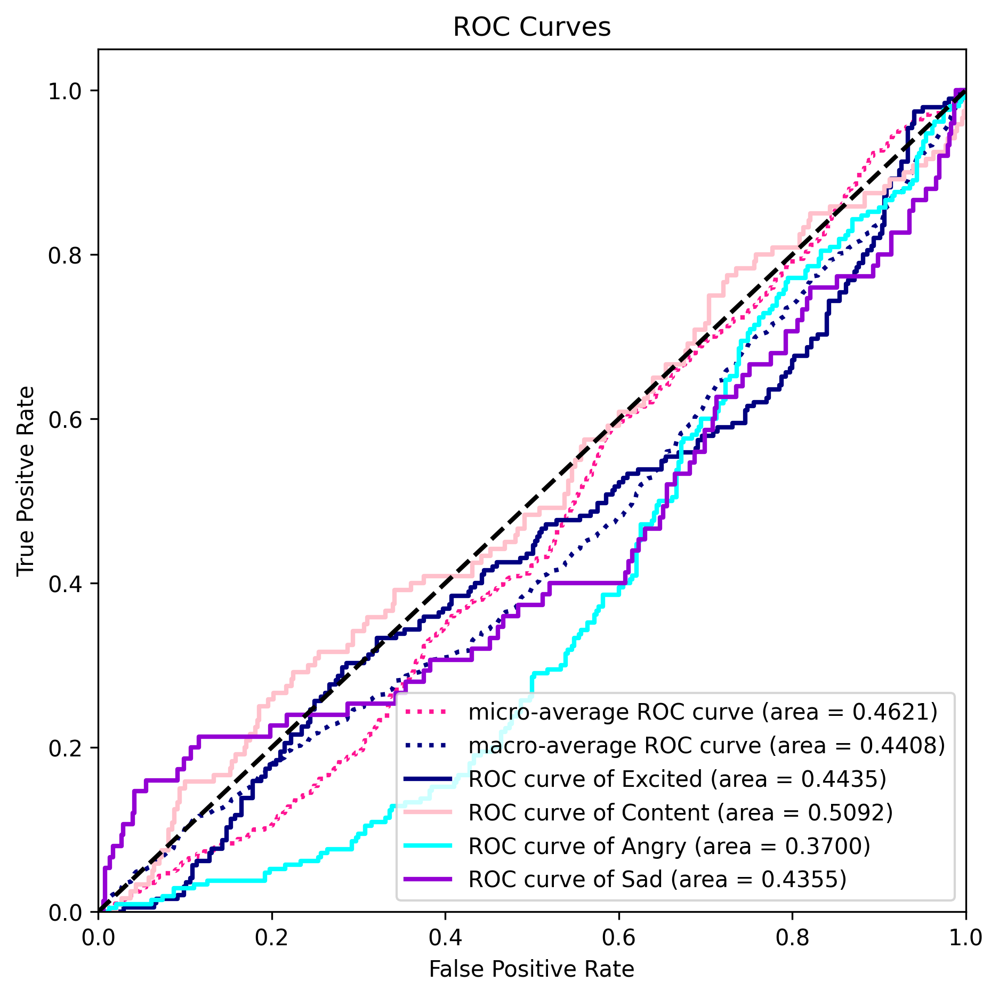

done


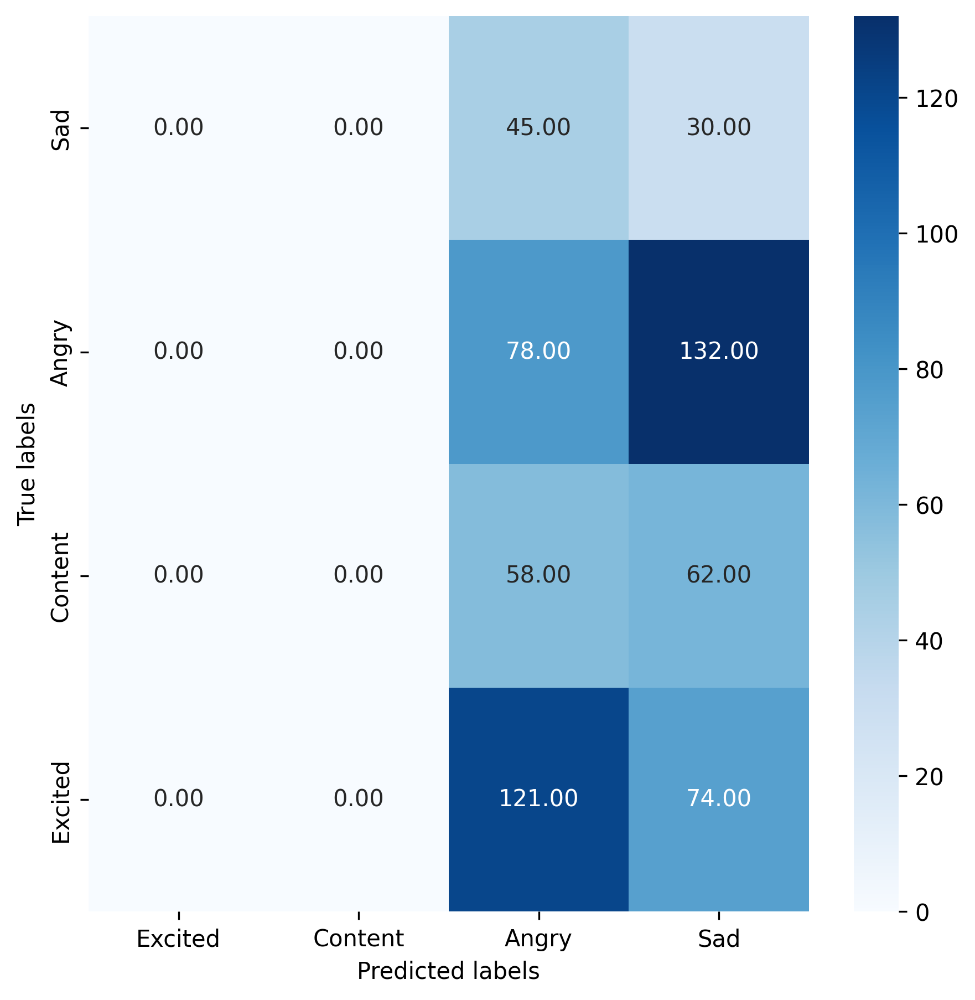

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3007 - loss: 1.4135
Epoch 1: val_accuracy improved from -inf to 0.30667, saving model to model/subject_independent_model_best_within_t1_8.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.3010 - loss: 1.4131 - val_accuracy: 0.3067 - val_loss: 1.4216 - learning_rate: 0.0010
Epoch 2/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3893 - loss: 1.2946
Epoch 2: val_accuracy did not improve from 0.30667
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.3894 - loss: 1.2945 - val_accuracy: 0.3000 - val_loss: 1.5618 - learning_rate: 0.0010
Epoch 3/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4155 - loss: 1.2668
Epoch 3: val_accuracy did not improve from 0.30667
146/146 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - accuracy: 0.4155 - loss: 1.2668 - val_accuracy: 0.2933 - val_loss: 1.4943 - learning_rate: 0.0010
Epoch 4/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4182 - los

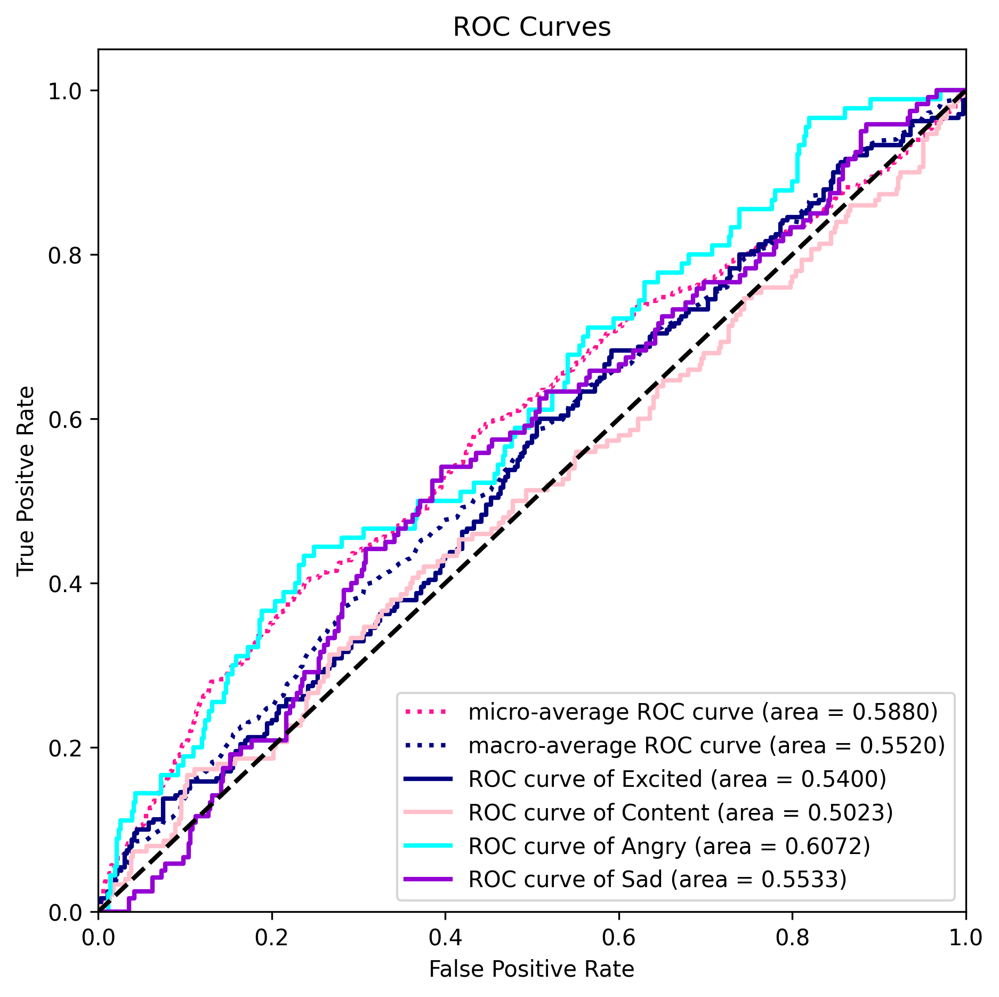

done


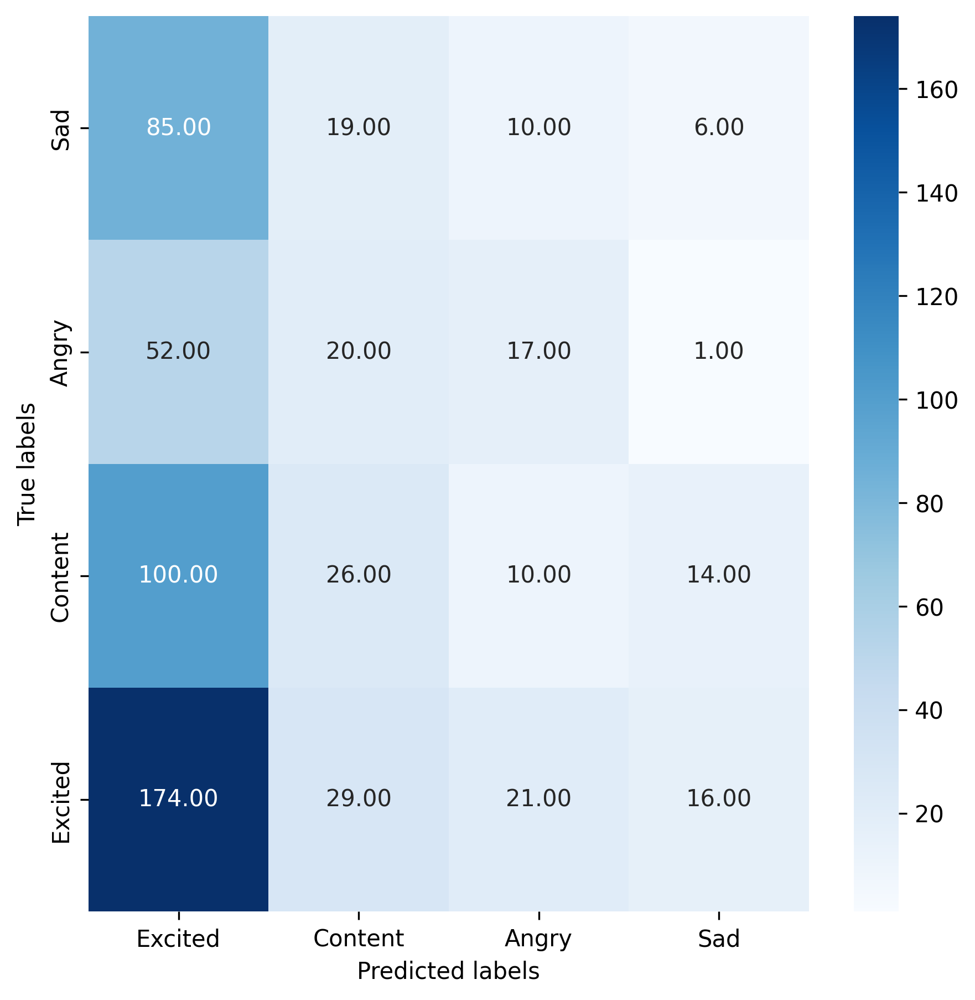

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3068 - loss: 1.3980
Epoch 1: val_accuracy improved from -inf to 0.22500, saving model to model/subject_independent_model_best_within_t1_9.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - accuracy: 0.3070 - loss: 1.3978 - val_accuracy: 0.2250 - val_loss: 1.3949 - learning_rate: 0.0010
Epoch 2/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3782 - loss: 1.3111
Epoch 2: val_accuracy improved from 0.22500 to 0.22833, saving model to model/subject_independent_model_best_within_t1_9.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - accuracy: 0.3783 - loss: 1.3110 - val_accuracy: 0.2283 - val_loss: 1.4970 - learning_rate: 0.0010
Epoch 3/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4088 - loss: 1.2757
Epoch 3: val_accuracy did not improve from 0.22833
146/146 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.4087 - loss: 1.2757 - val_accuracy: 0.1900 - val_loss: 1.7042 - learning_rate: 0.00

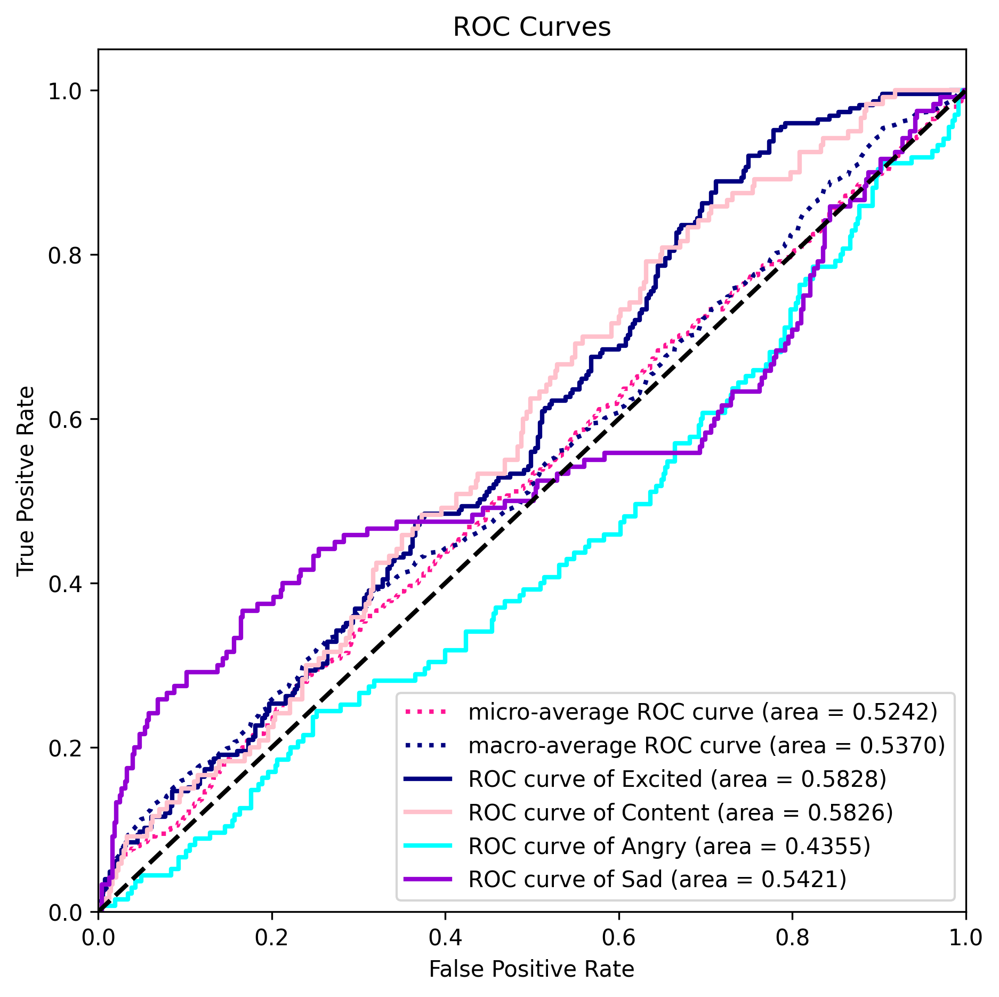

done


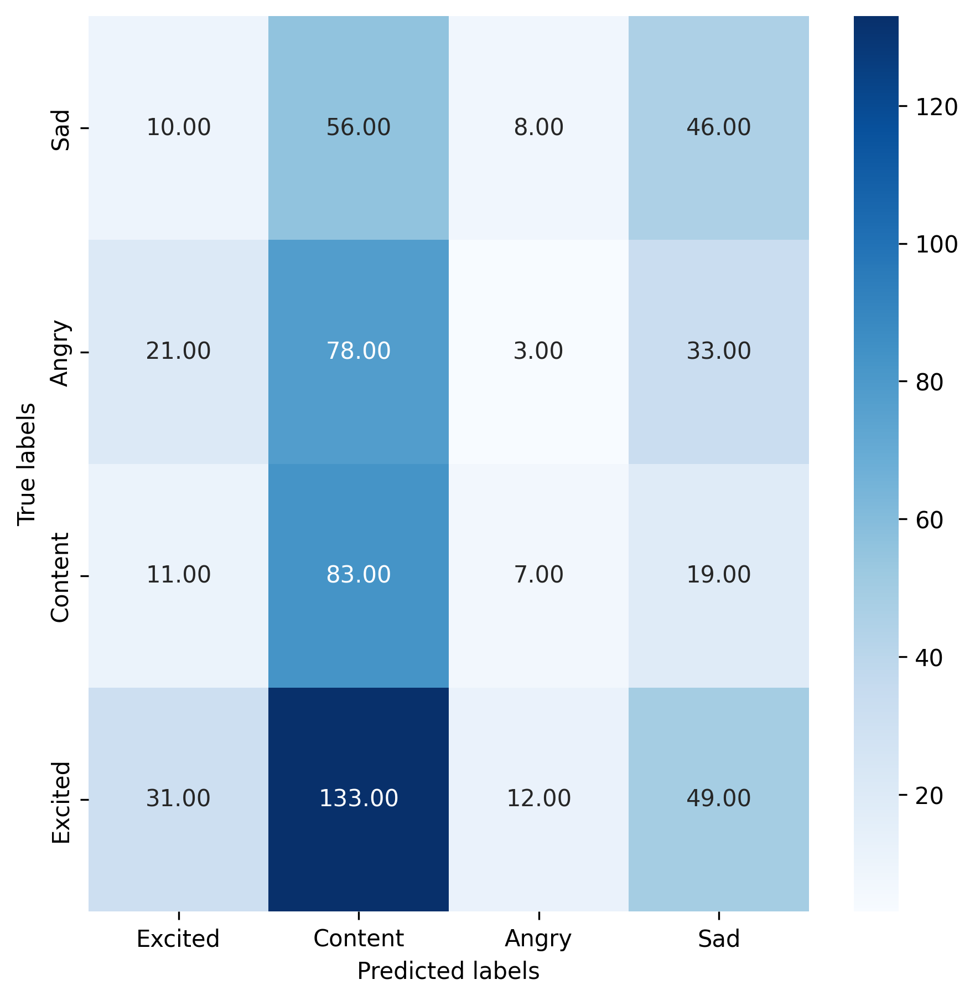

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.2953 - loss: 1.4122
Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to model/subject_independent_model_best_within_t1_10.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - accuracy: 0.2955 - loss: 1.4119 - val_accuracy: 0.5000 - val_loss: 1.2615 - learning_rate: 0.0010
Epoch 2/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3754 - loss: 1.3169
Epoch 2: val_accuracy did not improve from 0.50000
146/146 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - accuracy: 0.3755 - loss: 1.3168 - val_accuracy: 0.3967 - val_loss: 1.2527 - learning_rate: 0.0010
Epoch 3/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3993 - loss: 1.2866
Epoch 3: val_accuracy did not improve from 0.50000
146/146 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - accuracy: 0.3994 - loss: 1.2865 - val_accuracy: 0.2983 - val_loss: 1.2825 - learning_rate: 0.0010
Epoch 4/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4129 - lo

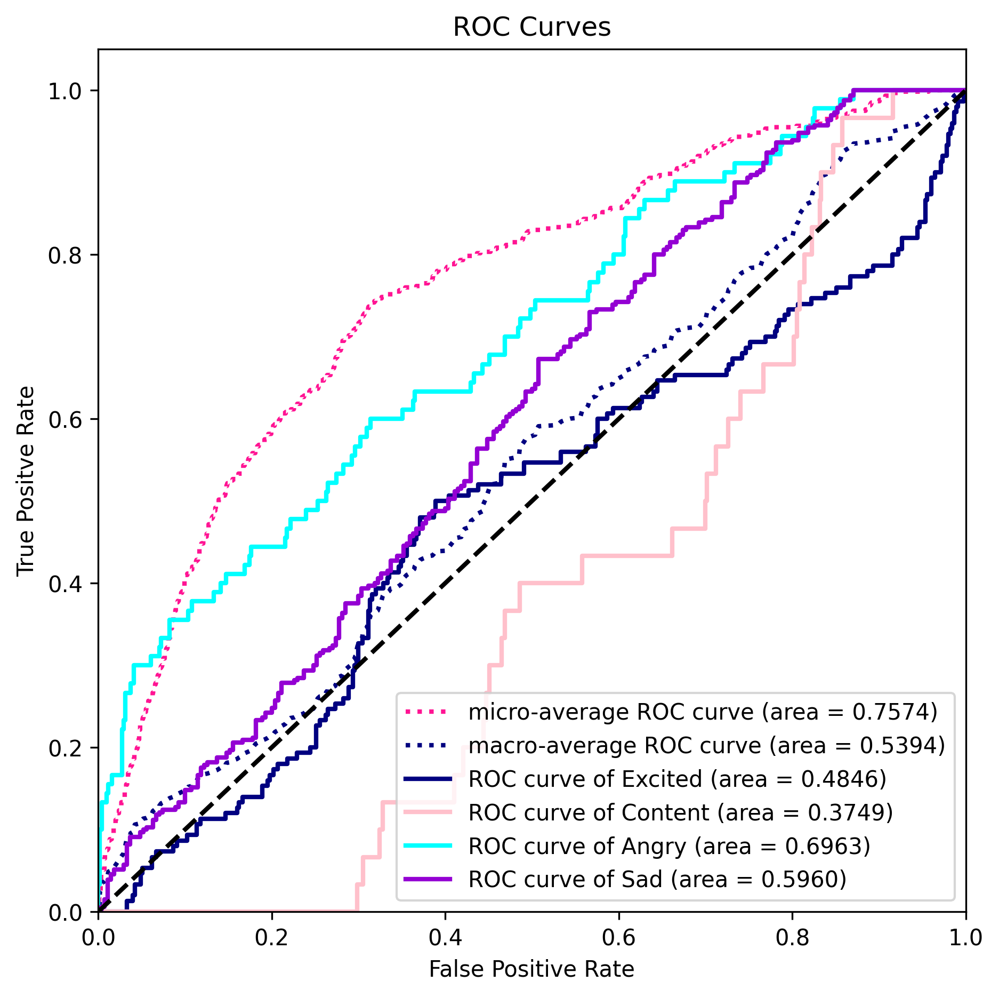

done


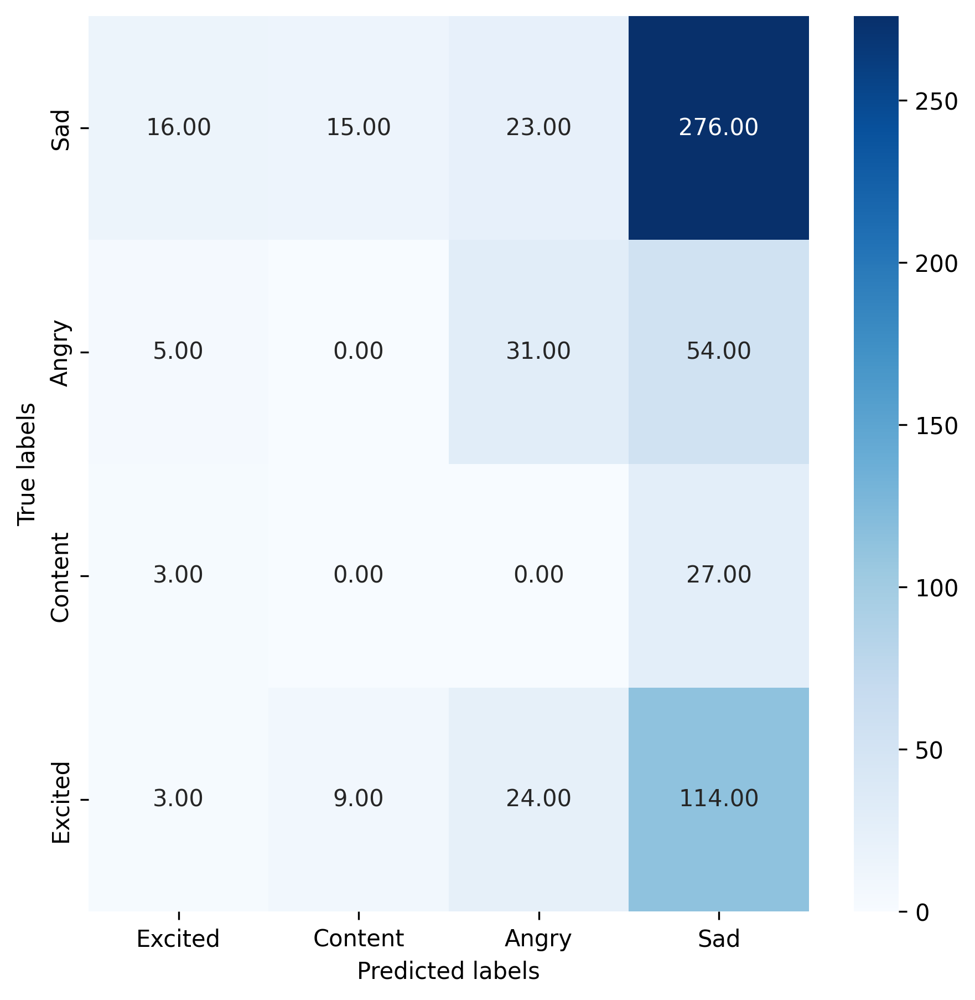

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.2931 - loss: 1.4318
Epoch 1: val_accuracy improved from -inf to 0.20000, saving model to model/subject_independent_model_best_within_t1_11.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - accuracy: 0.2933 - loss: 1.4314 - val_accuracy: 0.2000 - val_loss: 1.4749 - learning_rate: 0.0010
Epoch 2/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3716 - loss: 1.3181
Epoch 2: val_accuracy did not improve from 0.20000
146/146 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - accuracy: 0.3718 - loss: 1.3179 - val_accuracy: 0.2000 - val_loss: 1.5328 - learning_rate: 0.0010
Epoch 3/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3975 - loss: 1.2913
Epoch 3: val_accuracy improved from 0.20000 to 0.22000, saving model to model/subject_independent_model_best_within_t1_11.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - accuracy: 0.3976 - loss: 1.2911 - val_accuracy: 0.2200 - val_loss: 1.5348 - learning_rate: 0.

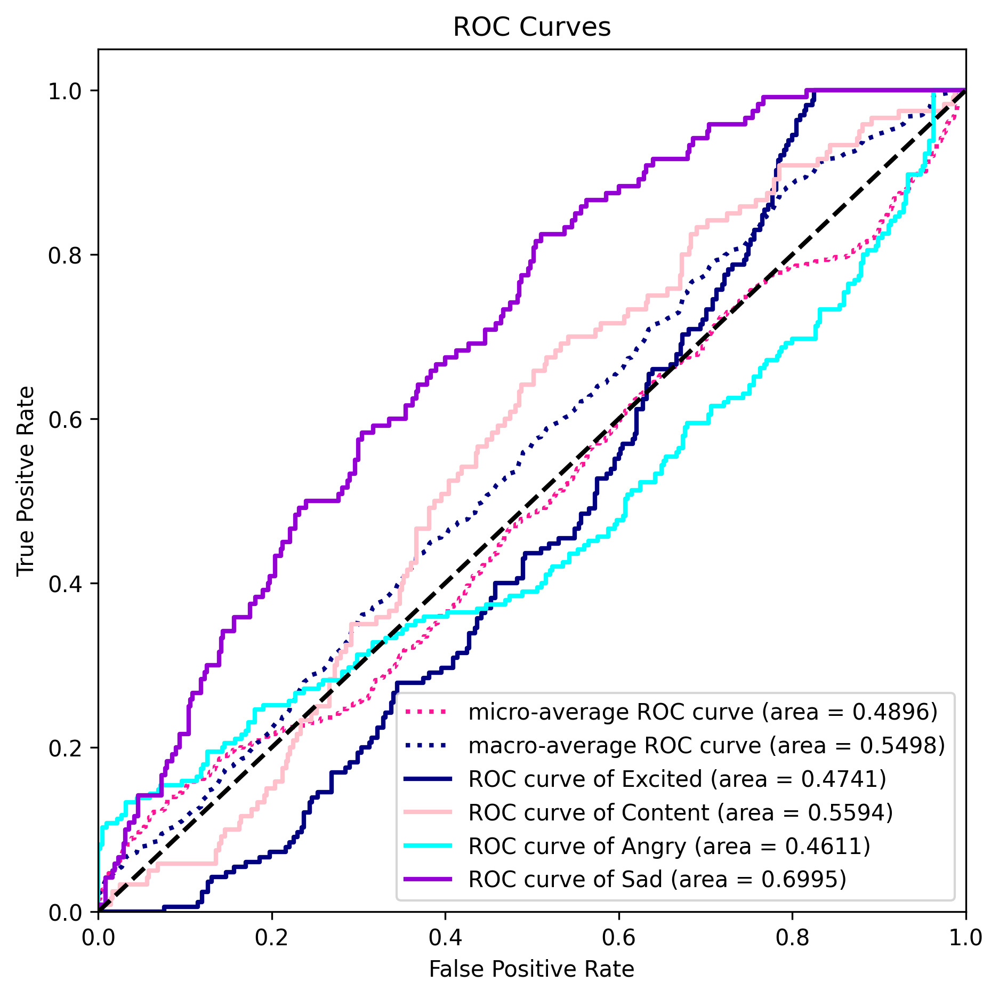

done


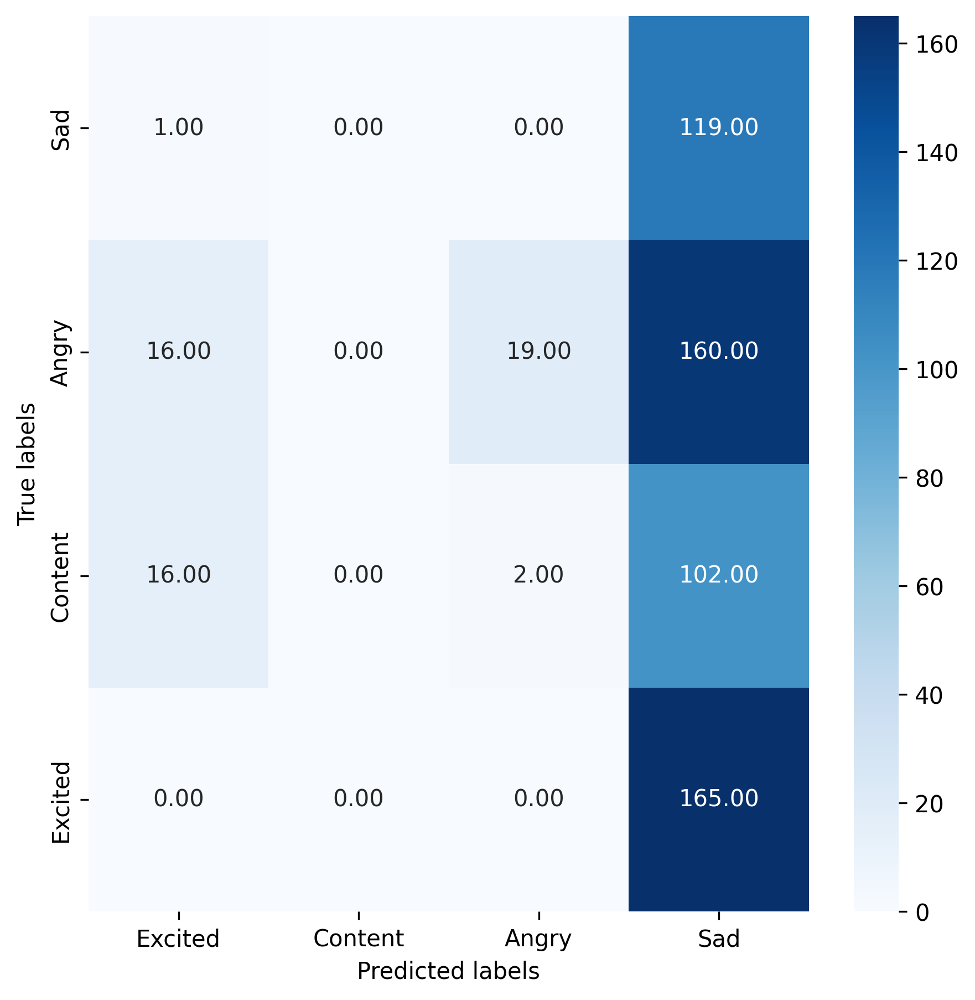

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.2966 - loss: 1.4354
Epoch 1: val_accuracy improved from -inf to 0.35000, saving model to model/subject_independent_model_best_within_t1_12.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.2968 - loss: 1.4350 - val_accuracy: 0.3500 - val_loss: 1.4755 - learning_rate: 0.0010
Epoch 2/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3707 - loss: 1.3137
Epoch 2: val_accuracy improved from 0.35000 to 0.37333, saving model to model/subject_independent_model_best_within_t1_12.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - accuracy: 0.3708 - loss: 1.3136 - val_accuracy: 0.3733 - val_loss: 1.7983 - learning_rate: 0.0010
Epoch 3/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3927 - loss: 1.2921
Epoch 3: val_accuracy did not improve from 0.37333
146/146 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - accuracy: 0.3928 - loss: 1.2920 - val_accuracy: 0.1533 - val_loss: 1.8842 - learning_rate: 0.

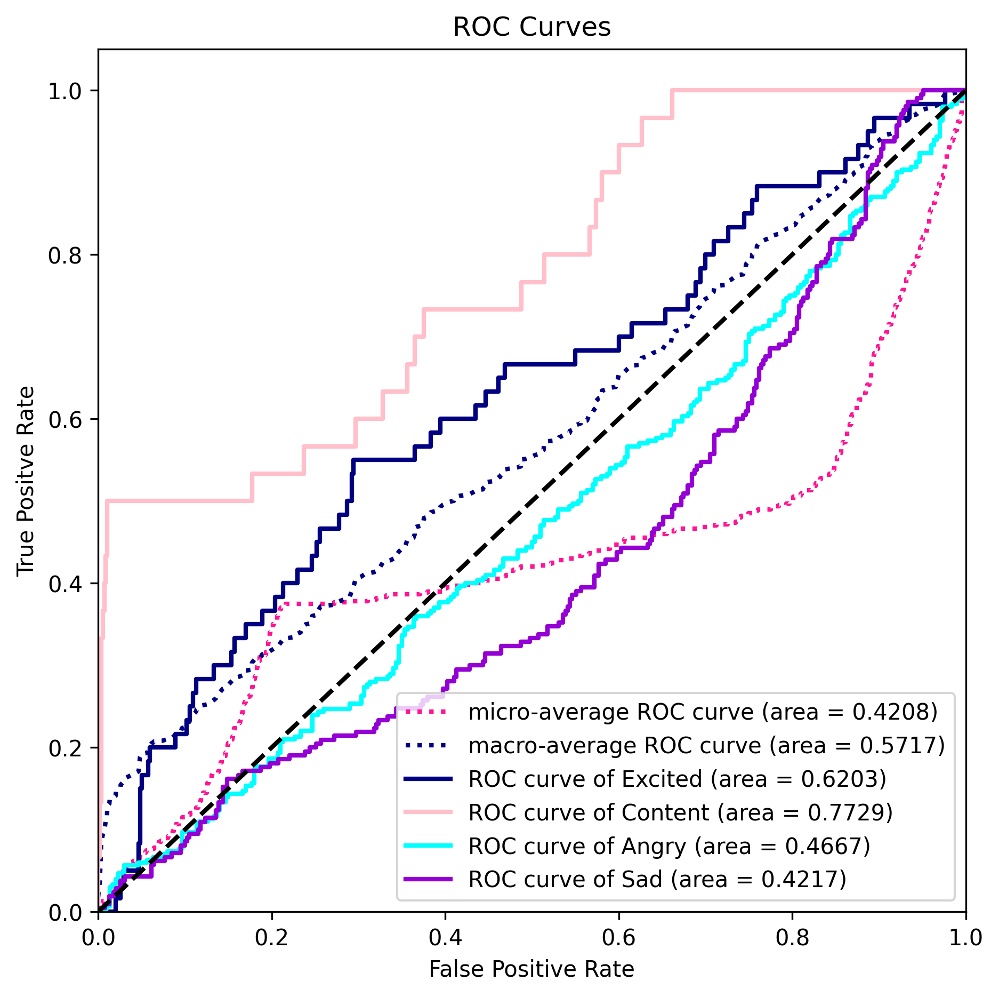

done


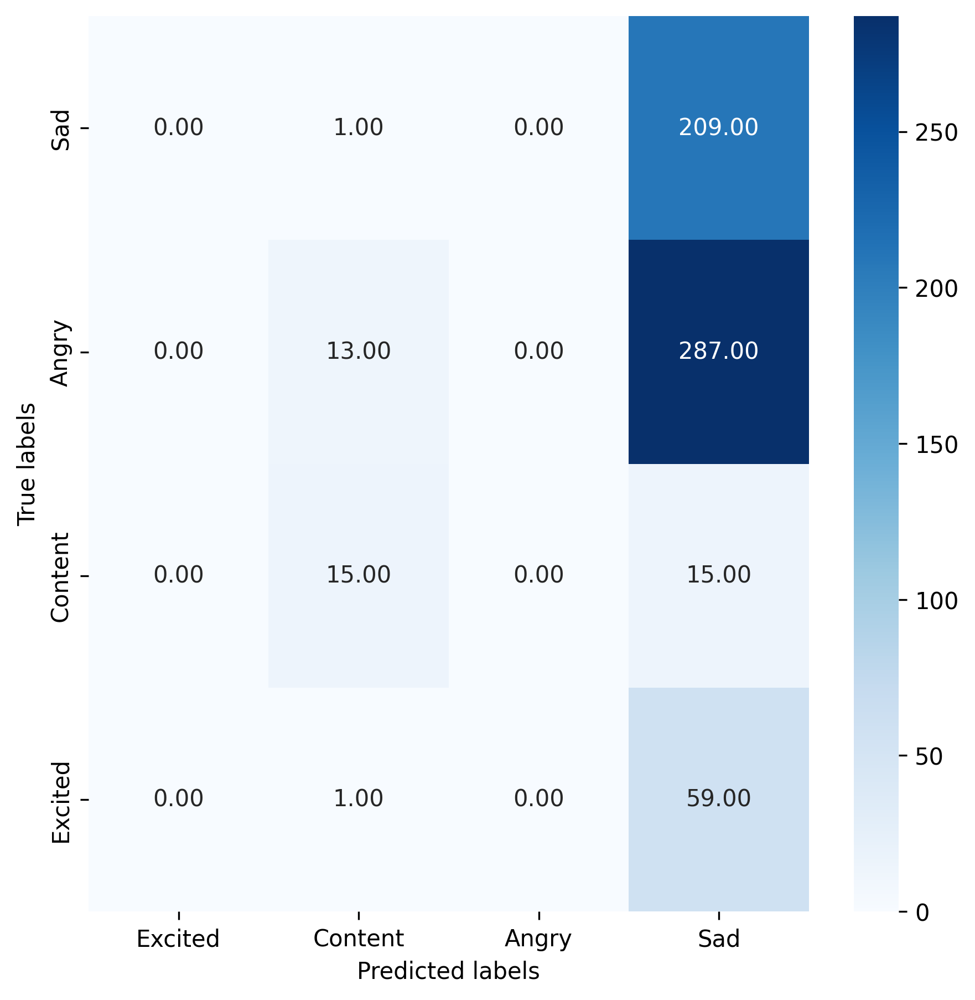

done


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.3000 - loss: 1.4080
Epoch 1: val_accuracy improved from -inf to 0.19500, saving model to model/subject_independent_model_best_within_t1_13.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - accuracy: 0.3003 - loss: 1.4077 - val_accuracy: 0.1950 - val_loss: 1.4226 - learning_rate: 0.0010
Epoch 2/200
145/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.3938 - loss: 1.3026
Epoch 2: val_accuracy improved from 0.19500 to 0.25833, saving model to model/subject_independent_model_best_within_t1_13.weights.h5
146/146 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - accuracy: 0.3938 - loss: 1.3025 - val_accuracy: 0.2583 - val_loss: 1.4869 - learning_rate: 0.0010
Epoch 3/200
146/146 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4111 - loss: 1.2666
Epoch 3: val_accuracy did not improve from 0.25833
146/146 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - accuracy: 0.4111 - loss: 1.2667 - val_accuracy: 0.1967 - val_loss: 1.5828 - learning_rate: 0.

In [ ]:
import logging
ertnet_logger = logging.getLogger('ertnet_logger')
ertnet_logger.setLevel(logging.INFO)
os.makedirs('logs', exist_ok=True)
os.makedirs('model', exist_ok=True)
os.makedirs('picture', exist_ok=True)
file_handler = logging.FileHandler('logs/ertnet.log')
ertnet_logger.addHandler(file_handler)

import numpy as np
from tensorflow import keras
from tensorflow.keras.utils import to_categorical

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []
class Model_Config_DEAP:
    K = 10

    nb_classes=4
    Chans=32
    Samples=512
    dropoutRate=0.5
    kernLength=64
    F1=8
    D=4
    F2=32
    dropoutType='Dropout'

    es_patience=50
    batch_size = 128
    max_epochs = 200
    lr_begin = 1e-3
    lr_end = 1e-5
    re_lr_patience = 10
    re_lr_factor = 0.1
params = Model_Config_DEAP
i = 0
for filename in os.listdir(preprocessed_folder):
    if filename.endswith('.dat'):

        train_data, train_labels, test_data, test_labels = losocv_data_split(filename)
        early_stop = EarlyStopping(monitor='val_loss', patience=params.es_patience, verbose=1)
        # Set model checkpoint callback
        checkpoint = ModelCheckpoint(filepath=f'model/subject_independent_model_best_within_t1_{i}.weights.h5',
                                     monitor='val_accuracy',
                                     verbose=1, save_best_only=True, mode='max', save_weights_only=True)
        # Load model
        model = ertnet(nb_classes=params.nb_classes, Chans=params.Chans,
                        Samples=params.Samples, dropoutRate=params.dropoutRate,
                        kernLength=params.kernLength, F1=params.F1, D=params.D,
                        F2=params.F2)
        # Use tf.keras.optimizers.Adam instead of keras.optimizers.adam_v2.Adam
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=params.lr_begin),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
        # Set reduce learning rate callback
        reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=params.re_lr_factor,
                                      patience=params.re_lr_patience, mode='auto',
                                      min_lr=params.lr_end)
        # Fit model
        hist = model.fit(train_data, train_labels, epochs=params.max_epochs,
                         batch_size=params.batch_size,
                         validation_data=(test_data, test_labels),
                         callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])
        # Get the best accuracy on the validation set
    
        model_best = ertnet(nb_classes=params.nb_classes, Chans=params.Chans,
                            Samples=params.Samples, dropoutRate=params.dropoutRate,
                            kernLength=params.kernLength, F1=params.F1, D=params.D,
                            F2=params.F2)
        model_best.load_weights(f'model/subject_independent_model_best_within_t1_{i}.weights.h5')
        pred = model_best.predict(test_data)
    
        correct_predictions = np.sum(np.argmax(test_labels, axis=1) == np.argmax(pred, axis=1))
        print("Accuracy in exclusive test data: " ,correct_predictions/test_labels.shape[0])
        cv_scores.append(correct_predictions/test_labels.shape[0])
        # Plot ROC curve
        plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'],
                          colorlist=['navy', 'pink', 'cyan', 'darkviolet'],
                          file=f'picture/roc_within_t1_{i}.jpg',dpi=300)
        # Plot confusion matrix
        plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                             ClassSet=['Excited', 'Content', 'Angry', 'Sad'],
                             file=f'picture/hm_within_t1_{i}.jpg',dpi=300)
        ertnet_logger.info(f"{i} Fold Training Epochs Accuracy on test data: {correct_predictions/test_labels.shape[0]}")
        i = i + 1
# Print model summary
model.summary()
# Save information to log file
print(cv_scores)
ertnet_logger.info(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
ertnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('ERTNet Train End.')

## CLstm

In [ ]:
import logging
cl_logger = logging.getLogger('cl_logger')
cl_logger.setLevel(logging.INFO)
os.makedirs('logs', exist_ok=True)
os.makedirs('model', exist_ok=True)
os.makedirs('picture', exist_ok=True)
file_handler = logging.FileHandler('logs/cl.log')
cl_logger.addHandler(file_handler)

import numpy as np
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []
for filename in os.listdir(preprocessed_folder):
    if filename.endswith('.dat'):
        train_data, train_labels, test_data, test_labels = losocv_data_split(filename)

    early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)
    checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_cl.weights.h5', 
                                monitor='val_accuracy', verbose=1, save_best_only=True, 
                                mode='max', save_weights_only=True)

    model = CNN_BiLSTM(4, Chans = 32, Samples = 512, F1=8, D=4, F2=32)
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
                loss='categorical_crossentropy',
                metrics=['accuracy'])

    reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

    hist = model.fit(train_data, train_labels, epochs=200,
                    batch_size=128,
                    validation_data=(test_data, test_labels),
                    callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])

    pred = model.predict(test_data)
    correct_predictions = np.sum(np.argmax(test_labels, axis=1) == np.argmax(pred, axis=1))
    print("Accuracy in exclusive test data: " ,correct_predictions/test_labels.shape[0])
    cv_scores.append(correct_predictions/test_labels.shape[0])

    plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                    colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                    file=f'picture/roc_within_cl.jpg',dpi=600)

    plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                        ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                        file=f'picture/hm_within_cl.jpg',dpi=600)
    cl_logger.info(f"Training Epochs Accuracy: {correct_predictions/test_labels.shape[0]}")

model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
cl_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('cl Train End.')


## DEEPCONVNET

In [ ]:
import logging
deepconvnet_logger = logging.getLogger('deepconvnet_logger')
deepconvnet_logger.setLevel(logging.INFO)
file_handler = logging.FileHandler('logs/deepconvnet.log')
deepconvnet_logger.addHandler(file_handler)

import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []

for filename in os.listdir(preprocessed_folder):
    if filename.endswith('.dat'):
        train_data, train_labels, test_data, test_labels = losocv_data_split(filename)
    early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)

    checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_deepconvnet.weights.h5', 
                                monitor='val_accuracy', verbose=1, save_best_only=True, 
                                mode='max', save_weights_only=True)

    model = DeepConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
                loss='categorical_crossentropy',
                metrics=['accuracy'])

    reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

    hist = model.fit(train_data, train_labels, epochs=200,
                    batch_size=128,
                    validation_data=(test_data, test_labels),
                    callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])

    model_best = DeepConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
    model_best.load_weights(f'model/model_best_within_deepconvnet.weights.h5')

    pred = model_best.predict(test_data)
    correct_predictions = np.sum(np.argmax(test_labels, axis=1) == np.argmax(pred, axis=1))
    print("Accuracy in exclusive test data: " ,correct_predictions/test_labels.shape[0])
    cv_scores.append(correct_predictions/test_labels.shape[0])

    plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                    colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                    file=f'picture/roc_within_deepconvnet.jpg',dpi=300)

    plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                        ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                        file=f'picture/hm_within_deepconvnet.jpg',dpi=300)
    deepconvnet_logger.info(f"Training Epochs Accuracy: {correct_predictions/test_labels.shape[0]}")

model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
deepconvnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('deepconvnet Train End.')


## EEGNET

In [ ]:
import logging
eegnet_logger = logging.getLogger('eegnet_logger')
eegnet_logger.setLevel(logging.INFO)
file_handler = logging.FileHandler('logs/eegnet.log')
eegnet_logger.addHandler(file_handler)

import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []


for filename in os.listdir(preprocessed_folder):
    if filename.endswith('.dat'):
        train_data, train_labels, test_data, test_labels = losocv_data_split(filename)

    early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)
    checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_eegnet.weights.h5', 
                                monitor='val_accuracy', verbose=1, save_best_only=True, 
                                mode='max', save_weights_only=True)

    model = EEGNet(nb_classes=4, Chans=32, Samples=512, dropoutRate=0.5, kernLength=64, F1=8, D=4, F2=32)
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
                loss='categorical_crossentropy',
                metrics=['accuracy'])

    reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

    hist = model.fit(train_data, train_labels, epochs=200,
                    batch_size=128,
                    validation_data=(test_data, test_labels),
                    callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()], verbose=0)


    model_best = EEGNet(nb_classes=4, Chans=32, Samples=512, dropoutRate=0.5, kernLength=64, F1=8, D=4, F2=32)
    model_best.load_weights(f'model/model_best_within_eegnet.weights.h5')
    pred = model_best.predict(test_data)

    correct_predictions = np.sum(np.argmax(test_labels, axis=1) == np.argmax(pred, axis=1))
    print("Accuracy in exclusive test data: " ,correct_predictions/test_labels.shape[0])
    cv_scores.append(correct_predictions/test_labels.shape[0])

    plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                    colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                    file=f'picture/roc_within_eegnet.jpg',dpi=300)

    plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                        ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                        file=f'picture/hm_within_eegnet.jpg',dpi=300)
    eegnet_logger.info(f"Training Epochs Accuracy: {correct_predictions/test_labels.shape[0]}")

model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
eegnet_logger.info(cv_scores)
eegnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('EEGNet Train End.')


## SHOLLOWCONVNET

In [ ]:
import logging
shallowconvnet_logger = logging.getLogger('shallowconvnet_logger')
shallowconvnet_logger.setLevel(logging.INFO)
file_handler = logging.FileHandler('logs/shallowconvnet.log')
shallowconvnet_logger.addHandler(file_handler)

import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import KFold

from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

cv_scores = []

for filename in os.listdir(preprocessed_folder):
    if filename.endswith('.dat'):
        train_data, train_labels, test_data, test_labels = losocv_data_split(filename)

    early_stop = EarlyStopping(monitor='val_loss', patience=50, verbose=1)
    checkpoint = ModelCheckpoint(filepath=f'model/model_best_within_shallowconvnet.weights.h5', 
                                monitor='val_accuracy', verbose=1, save_best_only=True, 
                                mode='max', save_weights_only=True)

    model = ShallowConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
                loss='categorical_crossentropy',
                metrics=['accuracy'])

    reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.1,patience=10,mode='auto',min_lr=1e-5)

    hist = model.fit(train_data, train_labels, epochs=200,
                    batch_size=128,
                    validation_data=(test_data, test_labels),
                    callbacks=[reduce_lr, checkpoint, early_stop, MyCustomCallback()])


    model_best = ShallowConvNet(nb_classes=4, Chans = 32, Samples = 512, dropoutRate = 0.5)
    model_best.load_weights(f'model/model_best_within_shallowconvnet.weights.h5')

    pred = model_best.predict(test_data)

    correct_predictions = np.sum(np.argmax(test_labels, axis=1) == np.argmax(pred, axis=1))
    print("Accuracy in exclusive test data: " ,correct_predictions/test_labels.shape[0])
    cv_scores.append(correct_predictions/test_labels.shape[0])

    plot_ROC(test_labels, pred, labels=['Excited', 'Content', 'Angry', 'Sad'], 
                    colorlist=['navy', 'pink', 'cyan', 'darkviolet'], 
                    file=f'picture/roc_within_shallowconvnet.jpg',dpi=300)

    plotHeatMap(np.argmax(test_labels,axis=1), np.argmax(pred,axis=1),
                        ClassSet=['Excited', 'Content', 'Angry', 'Sad'], 
                        file=f'picture/hm_within_shallowconvnet.jpg',dpi=300)
    shallowconvnet_logger.info(f"Training Epochs Accuracy: {correct_predictions/test_labels.shape[0]}")


model.summary()

print(cv_scores)
print('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
shallowconvnet_logger.info('Accuracy: %.2f%% (+/- %.2f%%)' % (np.mean(cv_scores)*100, np.std(cv_scores)*100))
print('shallowconvnet Train End.')


# END












